# prova structure 3

In [1]:
import tensorflow.keras.backend as K
from tensorflow.keras.regularizers import l2
from hyperopt import STATUS_OK, tpe, Trials, hp, fmin
from hyperopt.pyll.stochastic import sample
from hyperopt.pyll.base import scope
from sklearn.model_selection import KFold
import numpy as np
from matplotlib import pyplot as plt
from tensorflow.keras.optimizers import Adam,Nadam,Adamax
from time import perf_counter
import tensorflow as tf
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning, module="tensorflow")

import tinyDA as tda
from scipy.stats import multivariate_normal, uniform
import arviz as az
import keras
import sys



from module_utils import * 
from data_collection import *
sys.path.append('../utils')
from Structure3 import *
from pathlib import Path

# path to the current notebook
current_file_path = Path().resolve()
# path to the current folder
load_context_functions(current_file_path.parent.name)

# introduction of a seed for reproducibility purposes
seed = 10
tf.random.set_seed(seed)
np.random.seed(seed)
keras.utils.set_random_seed(seed)

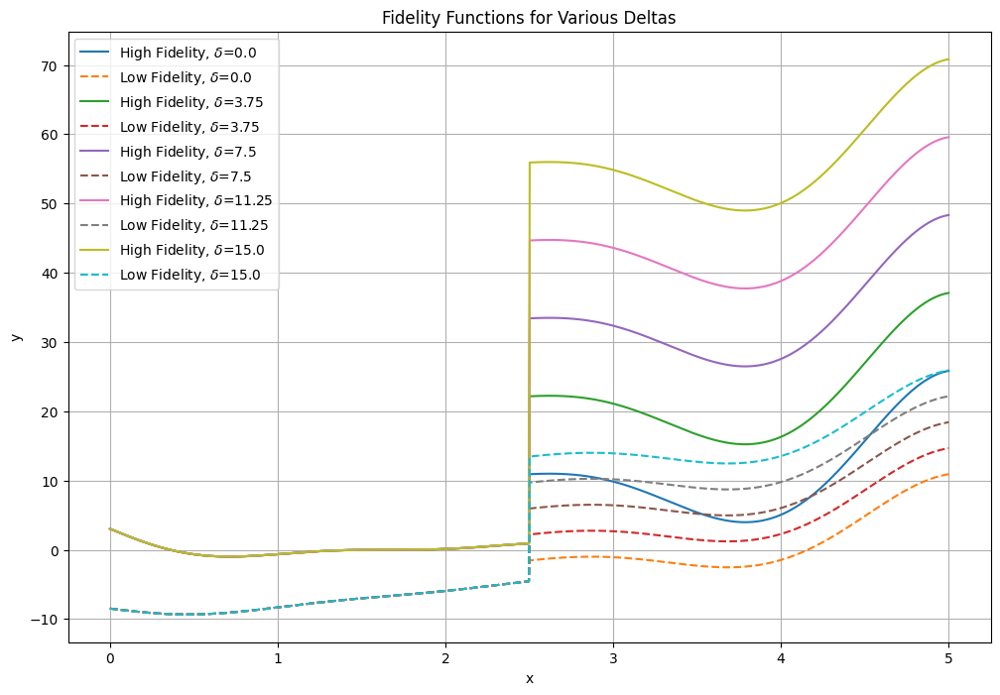

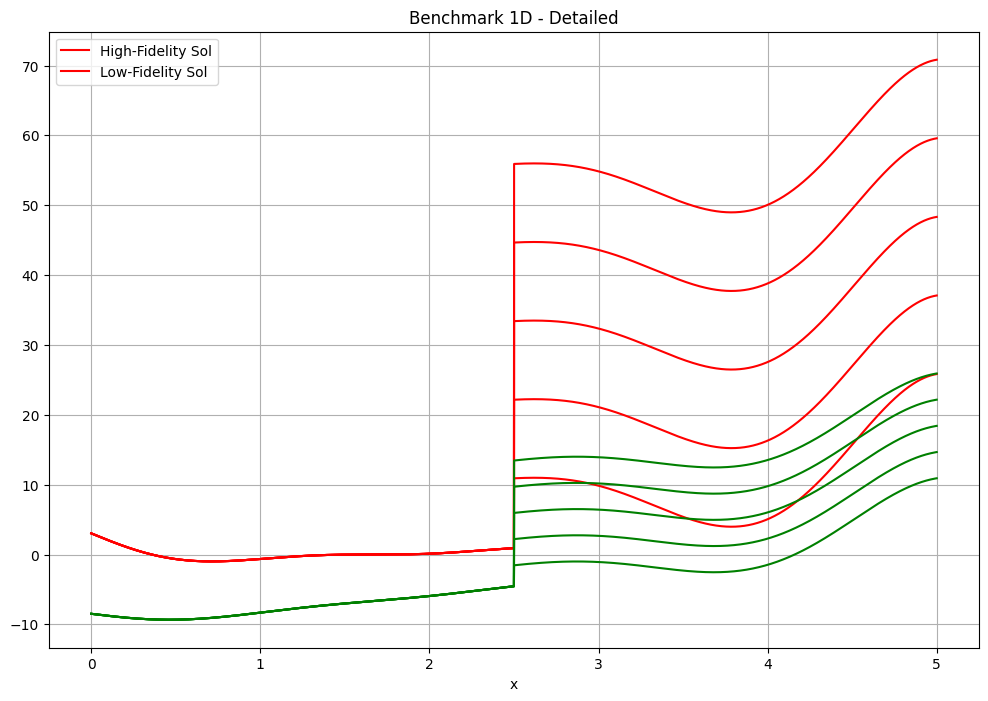

In [2]:
example = "Discontinuous"
fidelity_func = FidelityFunctionModified(example)
fidelity_func.plot_functions()
fidelity_func.plot_detailed_functions()

In [3]:
data=fidelity_func.get_parameters(example)

The function training took 42.158643 seconds.


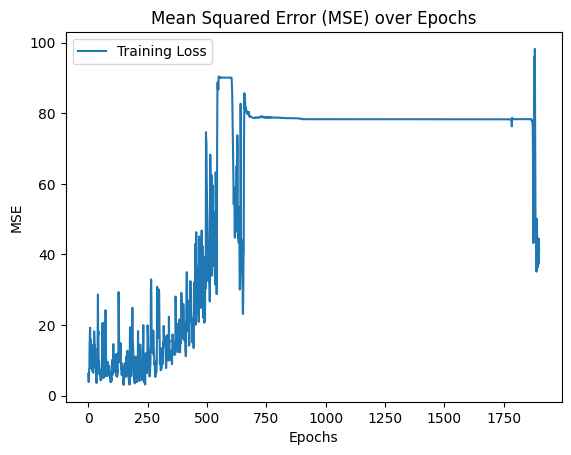

Test MSE: 577.8508038383619
R^2: -0.3648429260334054


Text(0.5, 1.0, 'Low fidelity model')

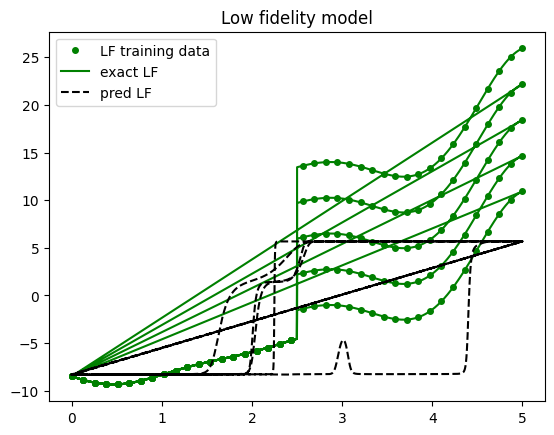

In [4]:
# parameters of the Neural Network
bestLF_params = {'lr' : 0.0255, 'kernel_init' : 'glorot_uniform', 'opt' : 'Adam'}
definition_LF={
        "network_type": "LF",
        "params": bestLF_params,
        "data_train": data["xlf"],
        "output_train": data["Ylf"],
        "N": data["NepoLF"],
        "n": data["Nlf"],
        "train": True,
        "do_HPO": False,
        "verbose": False
    }
# building of the neural network
modelLF=NetworkFactory.build_network(**definition_LF)
# prediction step
yLF=modelLF.prediction(data["datatest"])
(mse_LF,R2_LF)=modelLF.performance(data["datatest"],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]))

# Plot of the estimated results
plt.figure()
plt.plot(data["xlf"][:,0],data["Ylf"],'go', label = 'LF training data', markersize = 4)
plt.plot(data["datatest"][:,0],data["modified_lowfid"](data["datatest"][:,0],data["datatest"][:,1]),'g', label = 'exact LF') 
plt.plot(data["datatest"][:,0],yLF,'k--', label = 'pred LF')
plt.legend()
plt.title('Low fidelity model')

The function training took 104.557763 seconds.


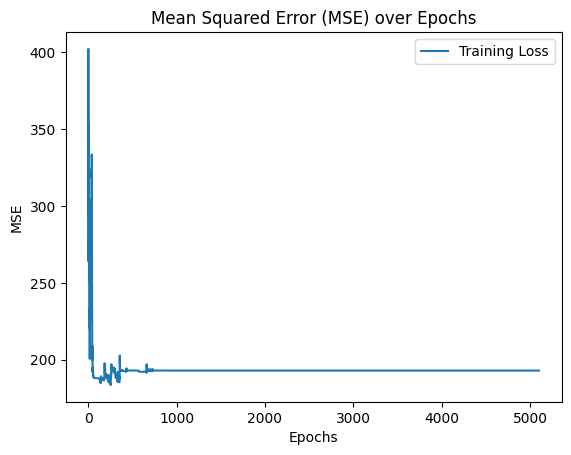

Test MSE: 199.68335810754954
R^2: 0.52836196307184


Text(0.5, 1.0, 'High fidelity model')

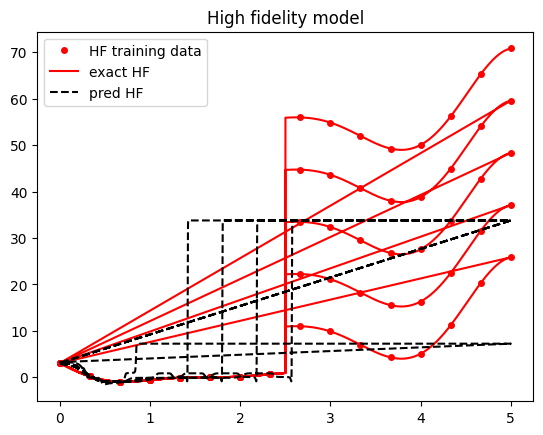

In [5]:
# parameters of the Neural Network
bestHF_params = {'lr' : 0.0255, 'kernel_init' : 'glorot_uniform', 'opt' : 'Adam'}
definition_HF={
        "network_type": "LF",
        "params": bestLF_params,
        "data_train": data["xhf"],
        "output_train": data["Yhf"],
        "N": data["NepoHF"],
        "n": data["Nhf"],
        "train": True,
        "do_HPO": False,
        "verbose": False
    }
modelHF=NetworkFactory.build_network(**definition_HF)
yHF=modelHF.prediction(data["datatest"])
(mse_HF,R2_HF)=modelHF.performance(data["datatest"],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]))

# Plot of the estimated results
plt.figure()
plt.plot(data["xhf"][:,0],data["Yhf"],'ro', label = 'HF training data', markersize = 4)
plt.plot(data["datatest"][:,0],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]),'r', label = 'exact HF') 
plt.plot(data["datatest"][:,0],yHF,'k--', label = 'pred HF')
plt.legend()
plt.title('High fidelity model')



The function training took 41.662397 seconds.


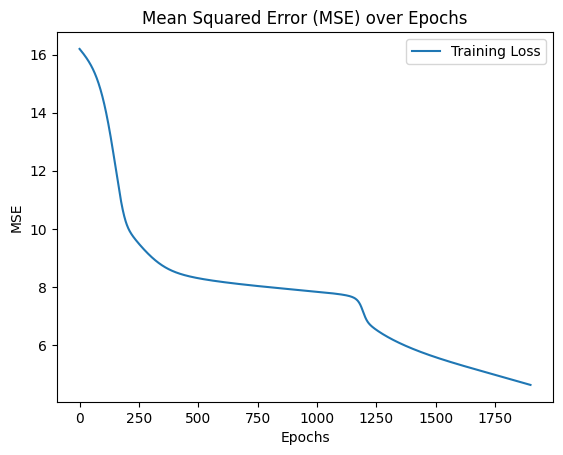

The function training took 100.917562 seconds.


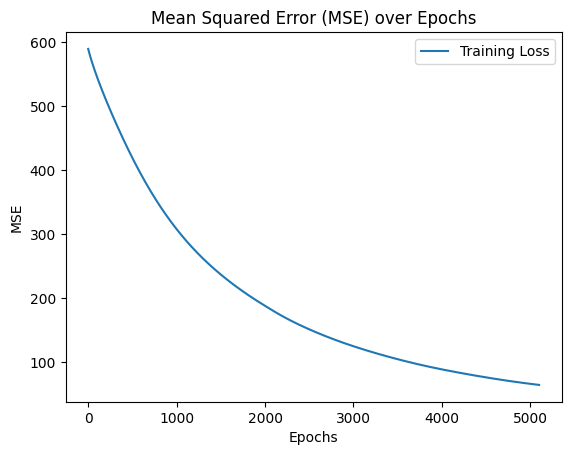

Test MSE: 60.26490160111733
R^2: 0.8576585442262498


Text(0.5, 1.0, 'High fidelity model')

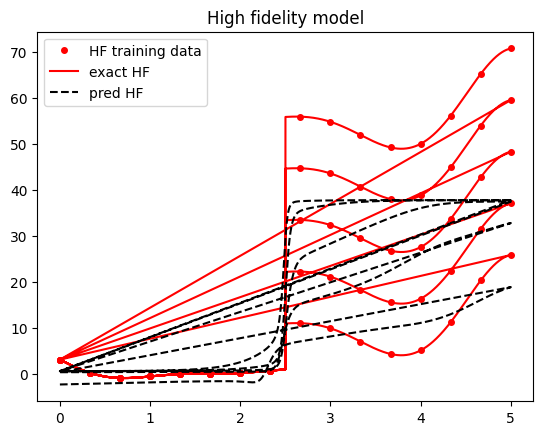

In [6]:
### 2 steps NEURAL NETWORK ###
# collection of parameters
# bestLF_params = {
#     'lr': 0.0255, 
#     'kernel_init': 'glorot_uniform', 
#     'opt': 'Adam'
# }
bestLF_params ={'nodes': 9, 'l2weight': 0.00011106070021031, 'lr': 0.0002497112206649614, 'kernel_init': 'uniform', 'opt': 'Adam'}



# best_params = {
#     'kernel_init': 'uniform', 
#     'l2weight': 0.00010018625799978436, 
#     'lr': 0.07093837044166487, 
#     'nodes': 74.0, 
#     'opt': 'Adamax'
# }
best_params= {'nodes': 9, 'l2weight': 0.00011106070021031, 'lr': 0.0002497112206649614, 'kernel_init': 'uniform', 'opt': 'Adam'}
params = [bestLF_params, best_params]

N = [data["NepoLF"], data["NepoHF"]]
n = [data["Nlf"], data["Nhf"]]

# names of the networks 
names = ['LF', 'HF']

# collection of the parameters
definition_2steps = {
    "network_type": "2step",
    "names": names,
    "params": params,
    "data_train": [data["xlf"], data["xhf"]],
    "output_train": [data["Ylf"], data["Yhf"]],
    "N": N,
    "n": n,
    "train": True,
    "do_HPO": False,
    "verbose": False
}

# creation of 2 steps model 
final_model = NetworkFactory.build_network(**definition_2steps)

if final_model == -1:
    raise ValueError("Failed to build the network. Check the network type and parameters.")

y_test=final_model.prediction(data["datatest"])

(mse_MF,R_MF)=final_model.performance(data["datatest"],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]))

    #(mse_MF,R_MF)=final_model.performance(data["x_test"].reshape(-1,1),data["high_fid"](data["x_test"]))

### PLOT of predicted models ###
#LF single-fidelity



plt.figure()
plt.plot(data["xhf"][:,0],data["Yhf"],'ro', label = 'HF training data', markersize = 4)
plt.plot(data["datatest"][:,0],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]),'r', label = 'exact HF') 
plt.plot(data["datatest"][:,0],y_test,'k--', label = 'pred HF')
plt.legend()
plt.title('High fidelity model')


Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 3000/3000 [02:10<00:00, 23.07it/s]


Sampling chain 2/2


Running chain, α = 0.28: 100%|██████████| 3000/3000 [02:09<00:00, 23.16it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.71]
    mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.71  0.723   6.294    8.918      0.042    0.029     302.0     259.0   

    r_hat  
x0   1.02  
Autocorrelation...
The difference between estimated values [3.96]



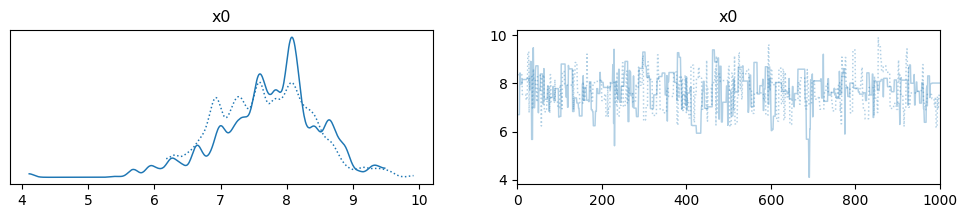

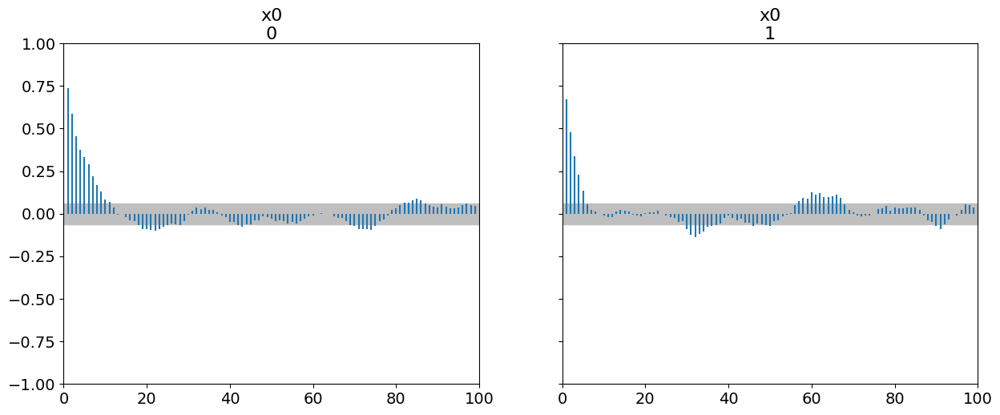

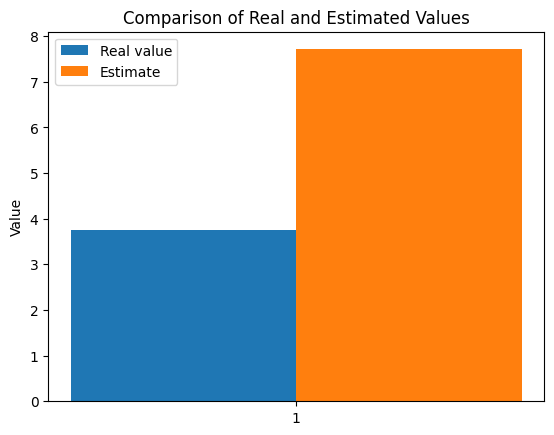

The function param_inverse took 262.053051 seconds.
Sampling chain 1/2


Running chain, α = 0.35: 100%|██████████| 3000/3000 [02:10<00:00, 23.00it/s]


Sampling chain 2/2


Running chain, α = 0.27: 100%|██████████| 3000/3000 [02:10<00:00, 22.96it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.615]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.615  0.642   6.453    8.762      0.031    0.022     425.0     369.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [3.865]



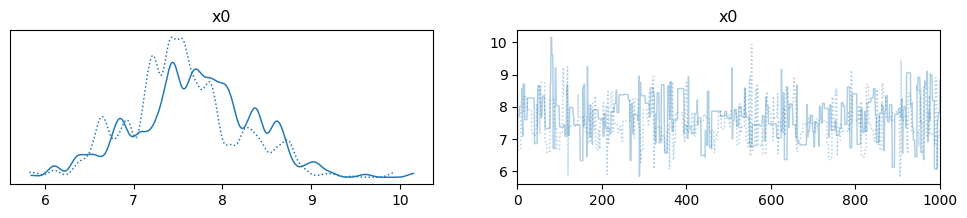

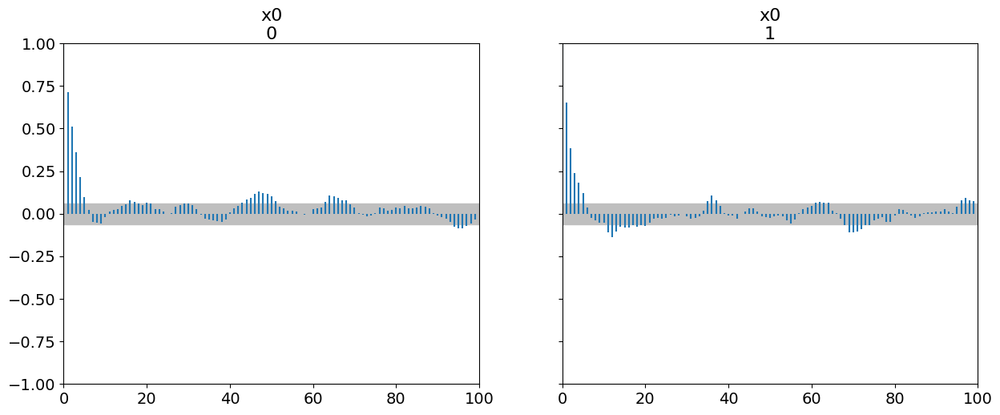

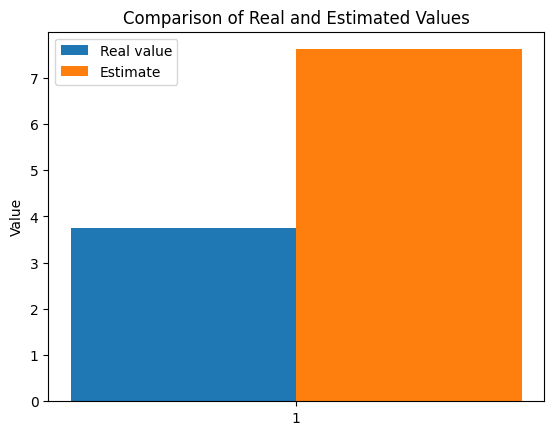

The function param_inverse took 267.116432 seconds.
Sampling chain 1/2


Running chain, α = 0.21: 100%|██████████| 3000/3000 [02:09<00:00, 23.14it/s]


Sampling chain 2/2


Running chain, α = 0.27: 100%|██████████| 3000/3000 [02:10<00:00, 23.07it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.68]
    mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.68  0.695   6.531    9.006      0.039    0.028     323.0     321.0   

    r_hat  
x0    1.0  
Autocorrelation...
The difference between estimated values [3.93]



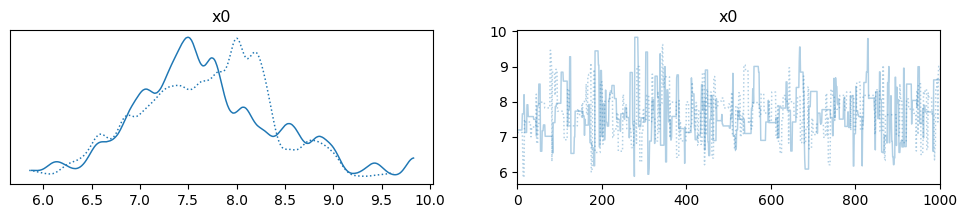

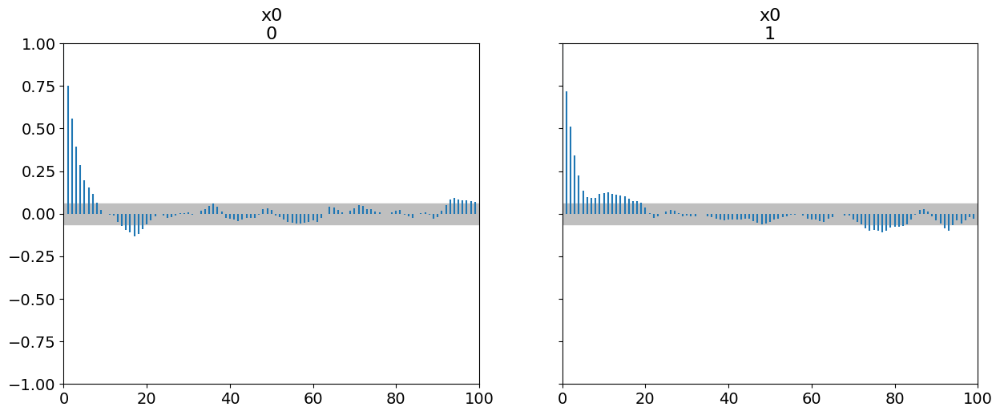

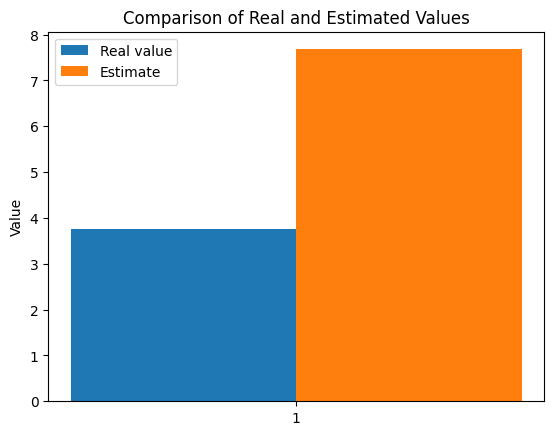

The function param_inverse took 260.505668 seconds.
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 3000/3000 [02:10<00:00, 22.95it/s]


Sampling chain 2/2


Running chain, α = 0.19: 100%|██████████| 3000/3000 [02:11<00:00, 22.88it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [16.177]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  16.177  0.843  15.104    17.31      0.056     0.04     289.0     316.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [12.427]



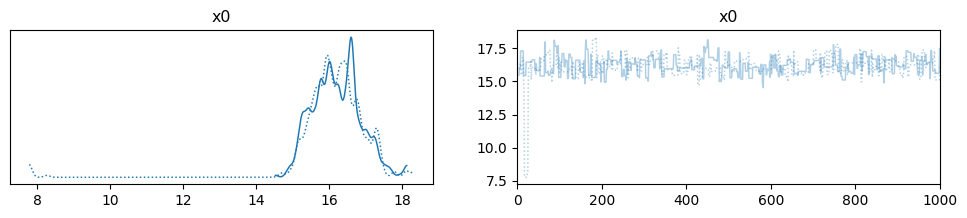

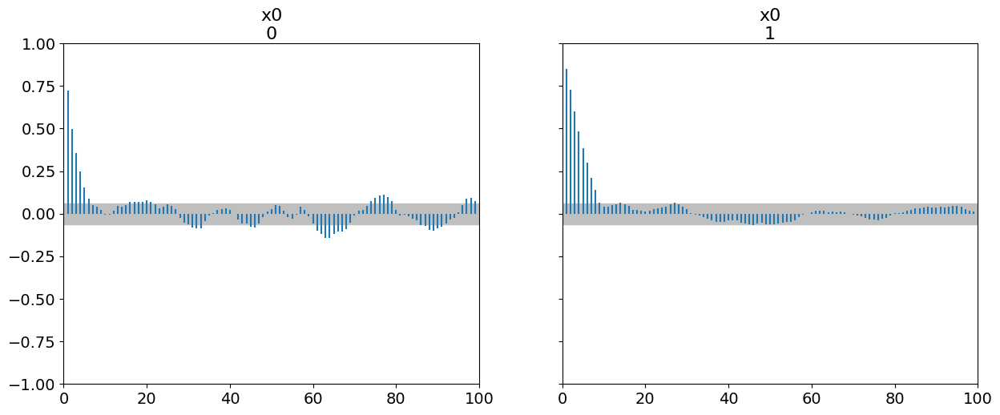

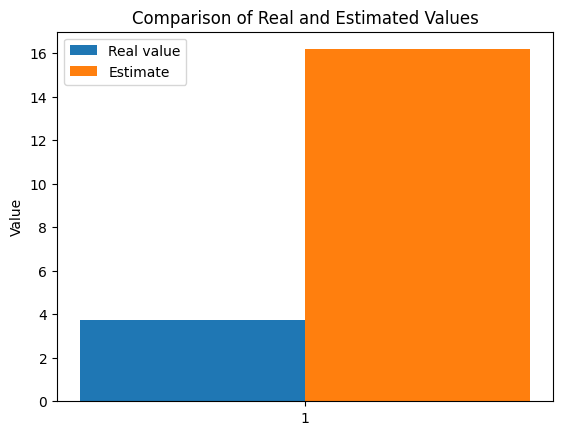

The function param_inverse took 262.425260 seconds.
Sampling chain 1/2


Running chain, α = 0.19: 100%|██████████| 3000/3000 [02:09<00:00, 23.15it/s]


Sampling chain 2/2


Running chain, α = 0.26: 100%|██████████| 3000/3000 [02:10<00:00, 22.93it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [14.481]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  14.481  3.337   7.713   17.308      1.291    0.956      18.0      64.0   

    r_hat  
x0   1.15  
Autocorrelation...
The difference between estimated values [10.731]



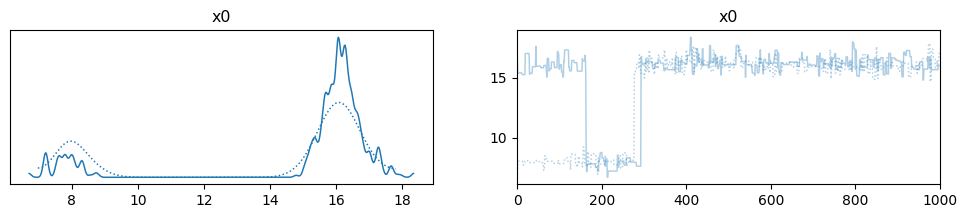

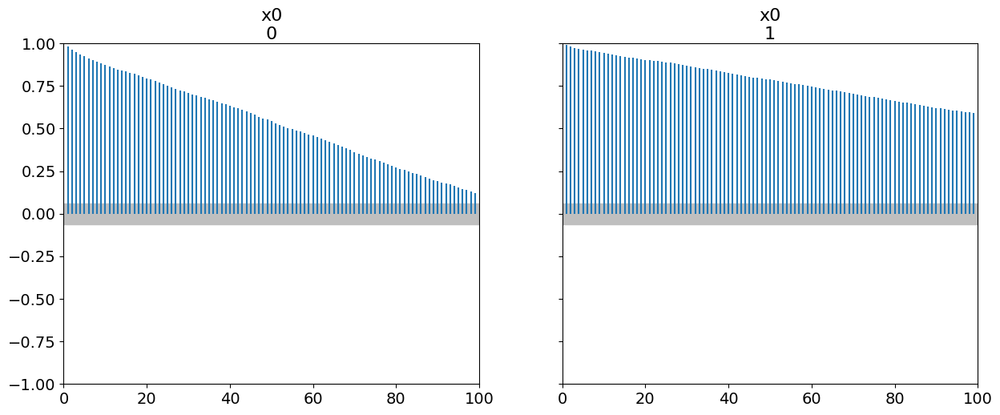

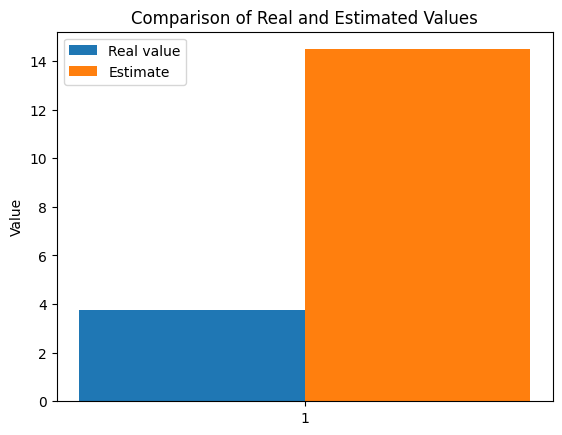

The function param_inverse took 261.047881 seconds.
Sampling chain 1/2


Running chain, α = 0.19: 100%|██████████| 3000/3000 [02:10<00:00, 22.99it/s]


Sampling chain 2/2


Running chain, α = 0.21: 100%|██████████| 3000/3000 [02:10<00:00, 23.03it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [16.086]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  16.086  1.204  15.048   17.355      0.146    0.104     231.0     113.0   

    r_hat  
x0   1.02  
Autocorrelation...
The difference between estimated values [12.336]



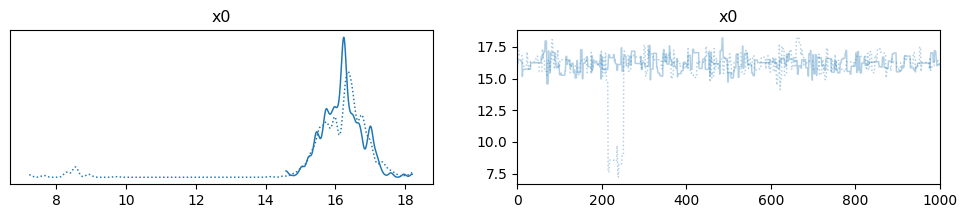

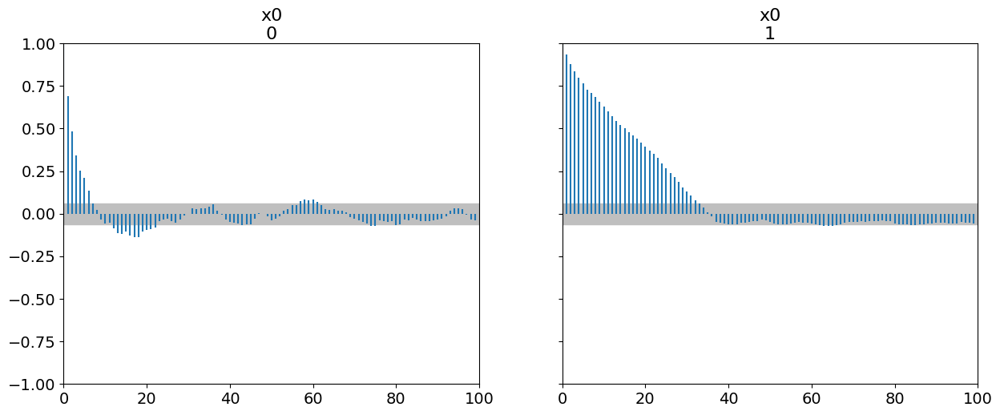

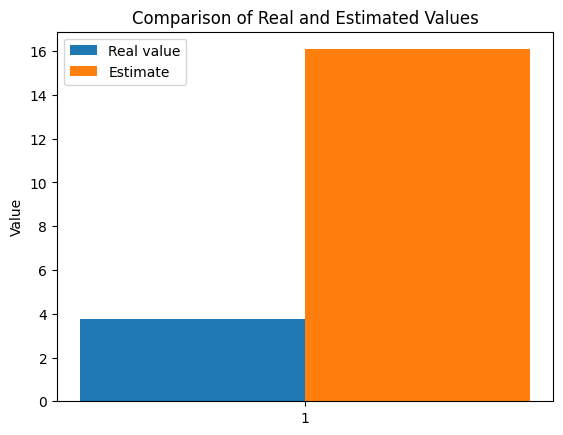

The function param_inverse took 267.371015 seconds.
Sampling chain 1/2


Running chain, α = 0.24: 100%|██████████| 3000/3000 [02:03<00:00, 24.39it/s]


Sampling chain 2/2


Running chain, α = 0.23: 100%|██████████| 3000/3000 [02:04<00:00, 24.17it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.519]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.519  0.778   6.237    8.947      0.049    0.035     259.0     273.0   

    r_hat  
x0   1.02  
Autocorrelation...
The difference between estimated values [3.769]



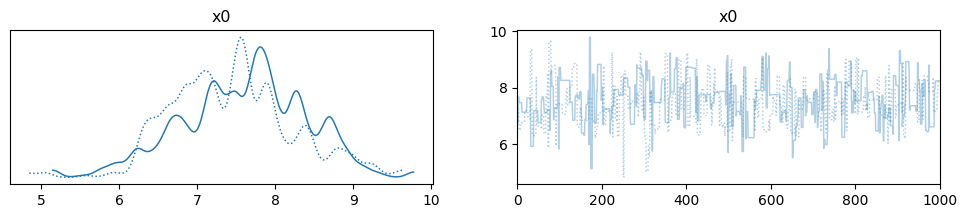

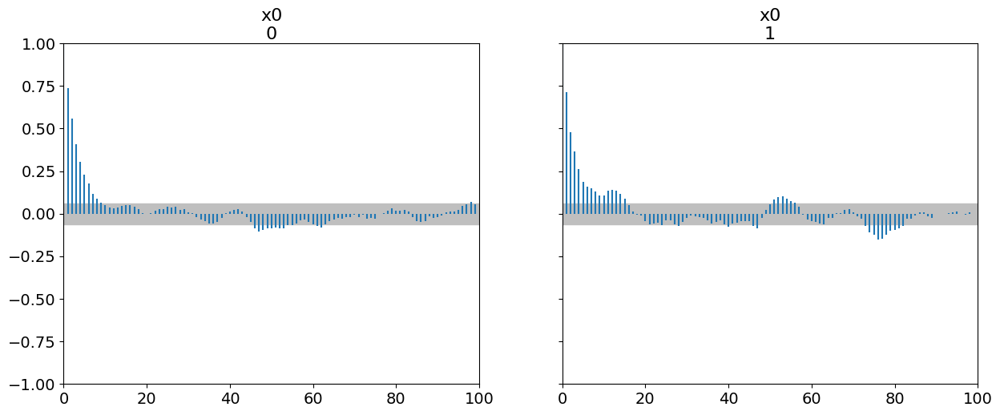

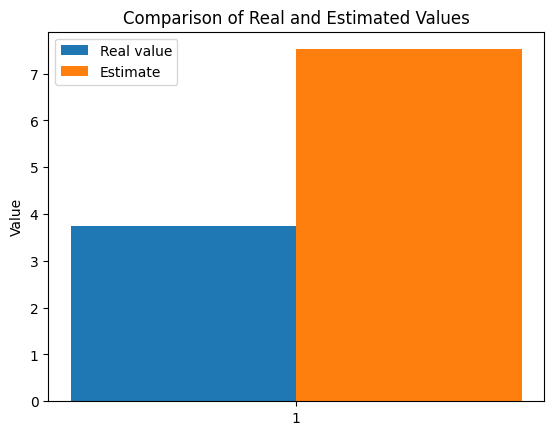

The function param_inverse took 247.692463 seconds.
Sampling chain 1/2


Running chain, α = 0.28: 100%|██████████| 3000/3000 [02:03<00:00, 24.33it/s]


Sampling chain 2/2


Running chain, α = 0.23: 100%|██████████| 3000/3000 [02:03<00:00, 24.26it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.386]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.386  0.839   5.923    8.878      0.048    0.034     317.0     254.0   

    r_hat  
x0    1.0  
Autocorrelation...
The difference between estimated values [3.636]



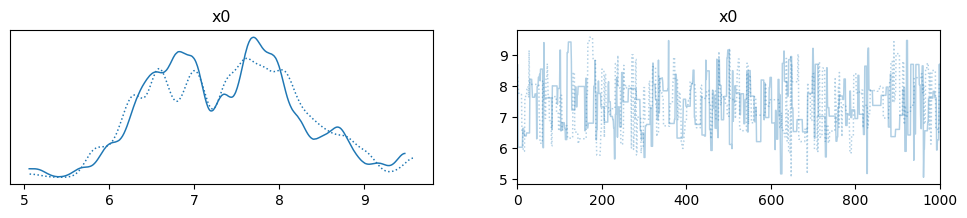

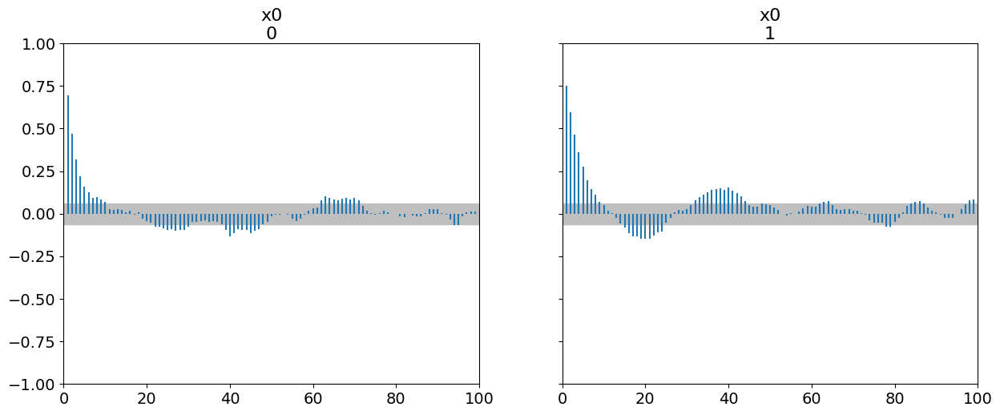

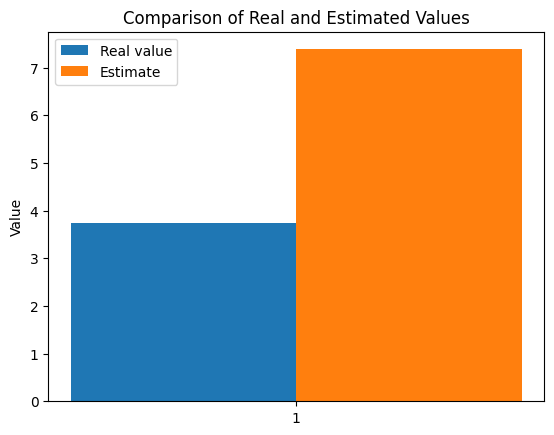

The function param_inverse took 253.809183 seconds.
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 3000/3000 [02:03<00:00, 24.26it/s]


Sampling chain 2/2


Running chain, α = 0.25: 100%|██████████| 3000/3000 [02:03<00:00, 24.26it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.49]
    mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.49  0.808   6.177    9.016      0.045    0.032     330.0     230.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [3.74]



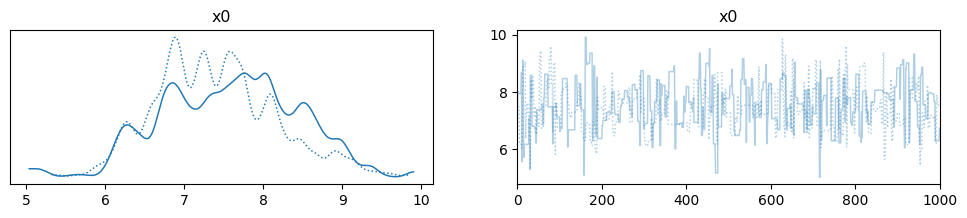

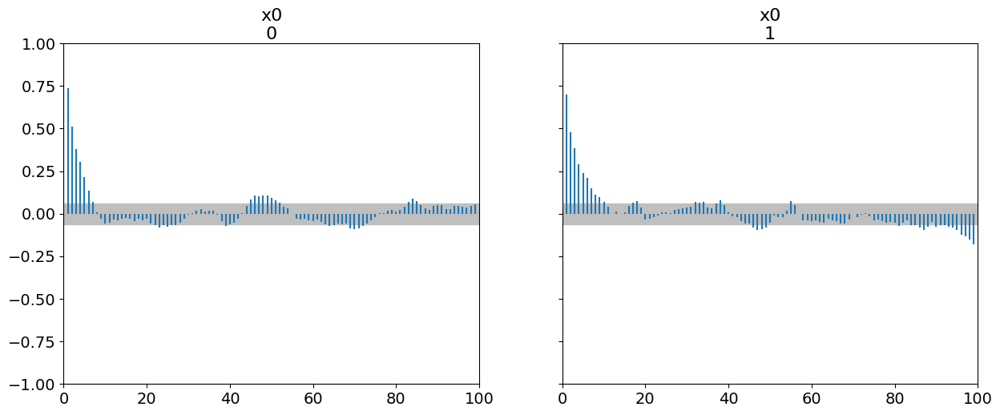

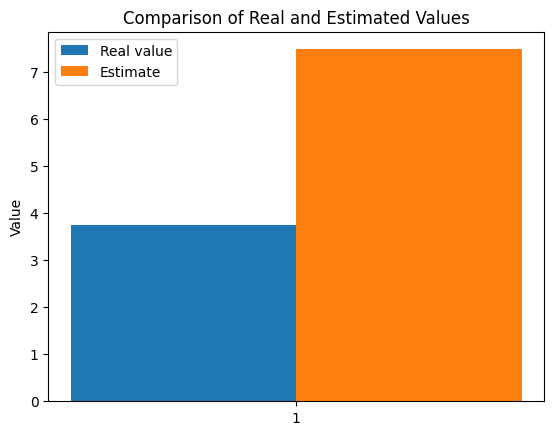

The function param_inverse took 247.999506 seconds.
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 3000/3000 [02:03<00:00, 24.29it/s]


Sampling chain 2/2


Running chain, α = 0.23: 100%|██████████| 3000/3000 [02:04<00:00, 24.17it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.902]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.902  0.561   6.868    8.894       0.03    0.021     353.0     285.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [4.152]



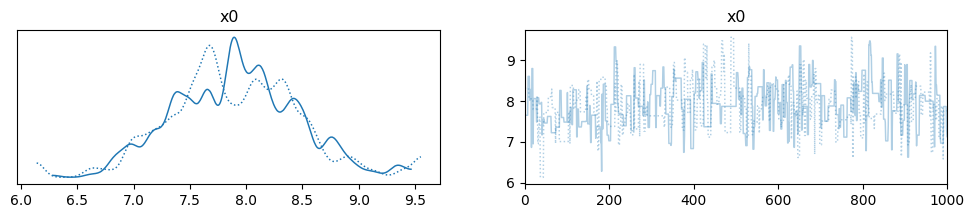

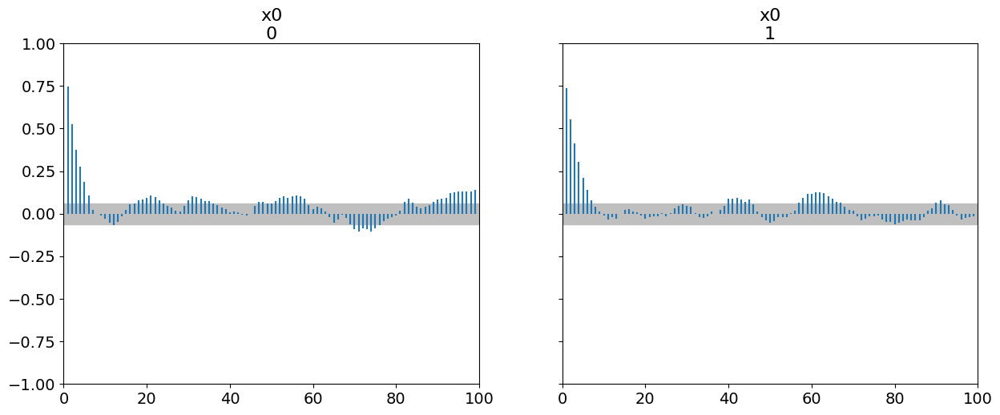

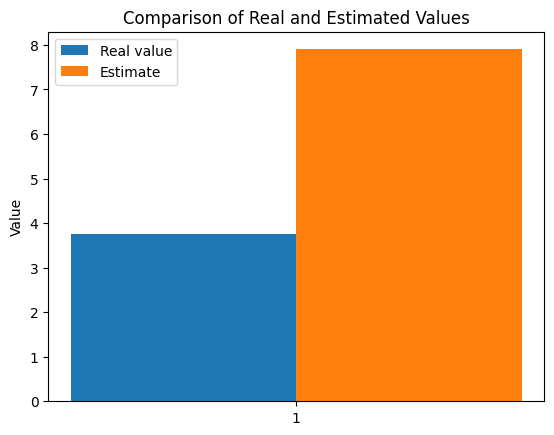

The function param_inverse took 253.256110 seconds.
Sampling chain 1/2


Running chain, α = 0.24: 100%|██████████| 3000/3000 [02:04<00:00, 24.00it/s]


Sampling chain 2/2


Running chain, α = 0.24: 100%|██████████| 3000/3000 [02:03<00:00, 24.28it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.854]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.854  0.598   6.851    8.928      0.033    0.023     323.0     334.0   

    r_hat  
x0    1.0  
Autocorrelation...
The difference between estimated values [4.104]



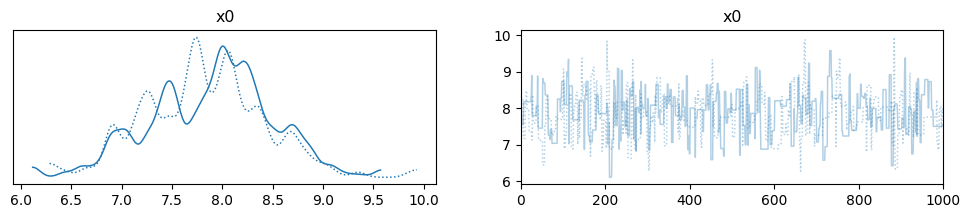

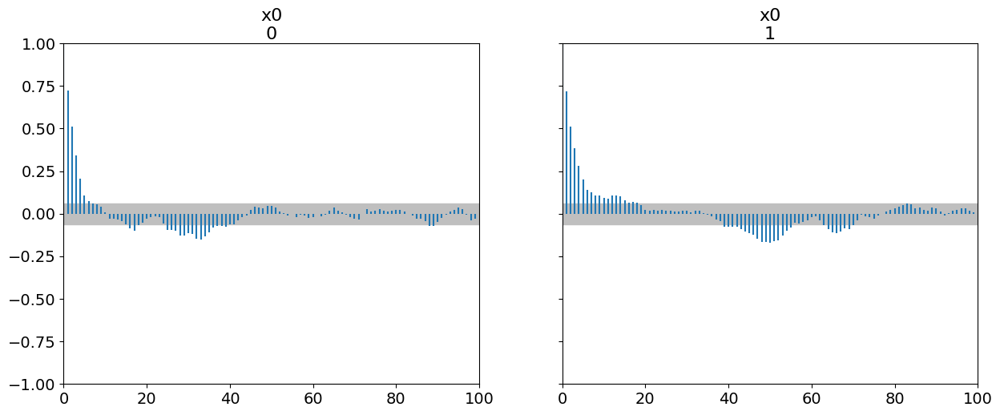

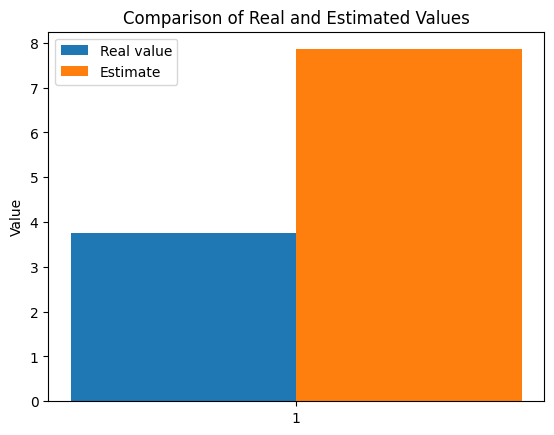

The function param_inverse took 249.141005 seconds.
Sampling chain 1/2


Running chain, α = 0.19: 100%|██████████| 3000/3000 [02:04<00:00, 24.19it/s]


Sampling chain 2/2


Running chain, α = 0.24: 100%|██████████| 3000/3000 [02:03<00:00, 24.23it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.861]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.861  0.629    6.88    9.099       0.04    0.029     252.0     317.0   

    r_hat  
x0    1.0  
Autocorrelation...
The difference between estimated values [4.111]



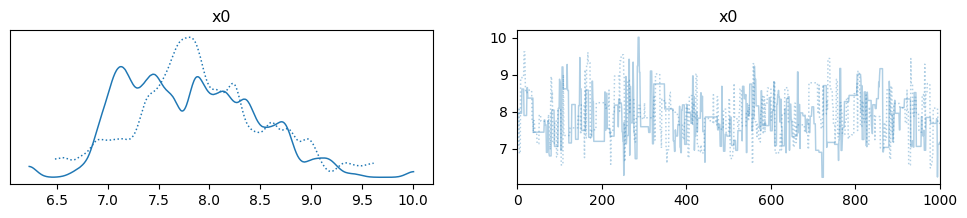

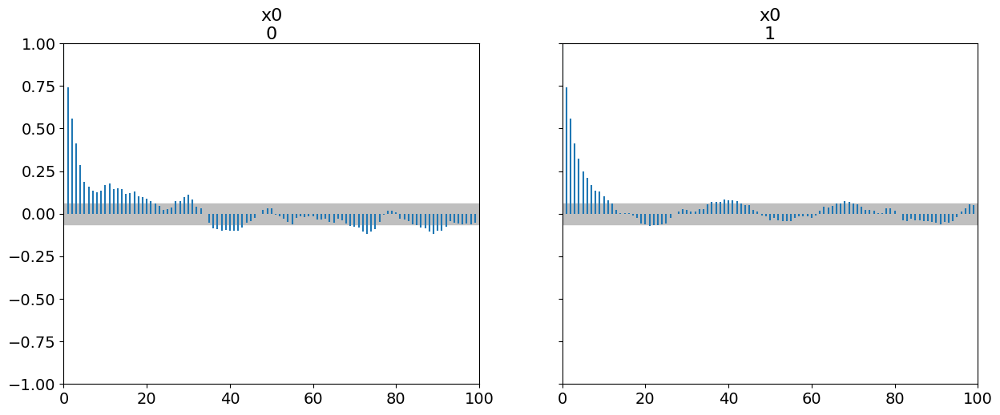

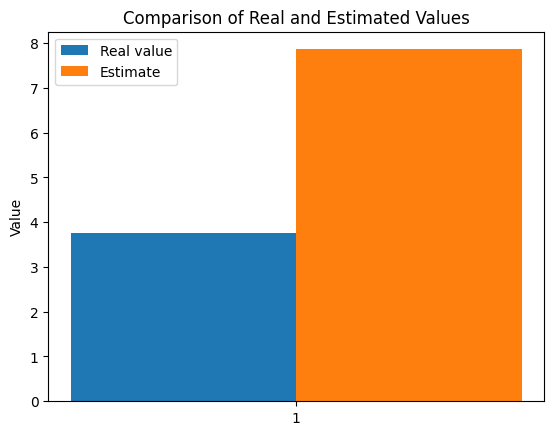

The function param_inverse took 248.594273 seconds.
Sampling chain 1/2


Running chain, α = 0.29: 100%|██████████| 3000/3000 [02:11<00:00, 22.80it/s]


Sampling chain 2/2


Running chain, α = 0.20: 100%|██████████| 3000/3000 [02:11<00:00, 22.78it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.681]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.681  0.668   6.349    8.812      0.043     0.03     245.0     259.0   

    r_hat  
x0   1.02  
Autocorrelation...
The difference between estimated values [3.931]



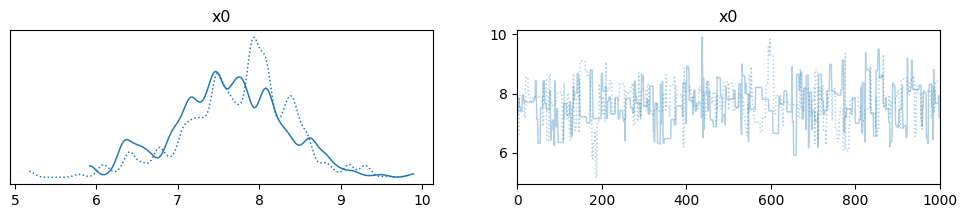

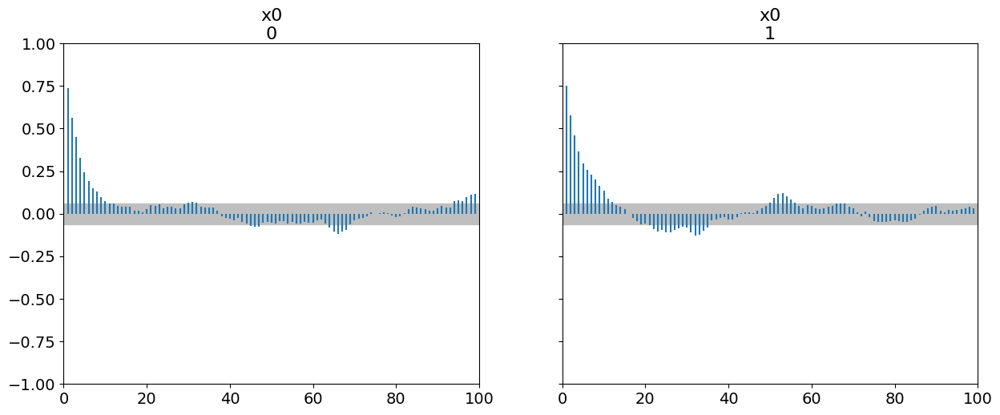

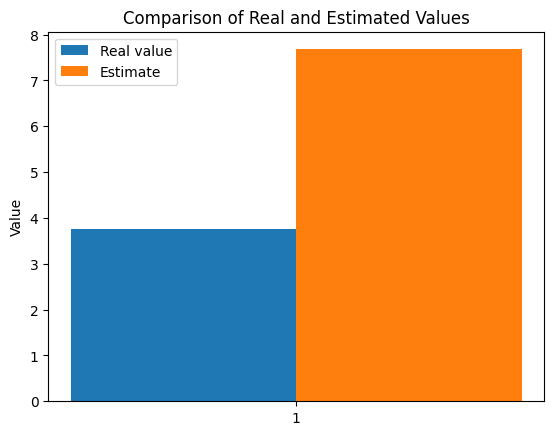

The function param_inverse took 263.964939 seconds.
Sampling chain 1/2


Running chain, α = 0.17: 100%|██████████| 3000/3000 [02:10<00:00, 22.94it/s]


Sampling chain 2/2


Running chain, α = 0.34: 100%|██████████| 3000/3000 [02:10<00:00, 22.93it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.684]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.684  0.675   6.514    8.987      0.034    0.025     372.0     296.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [3.934]



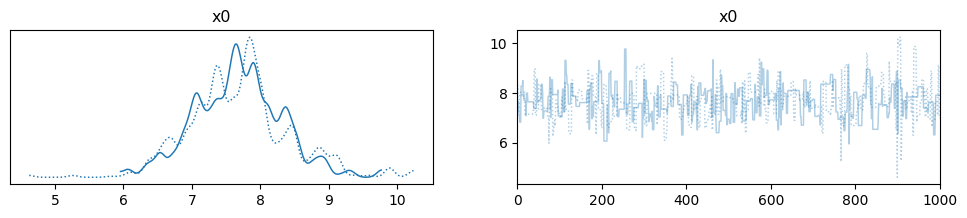

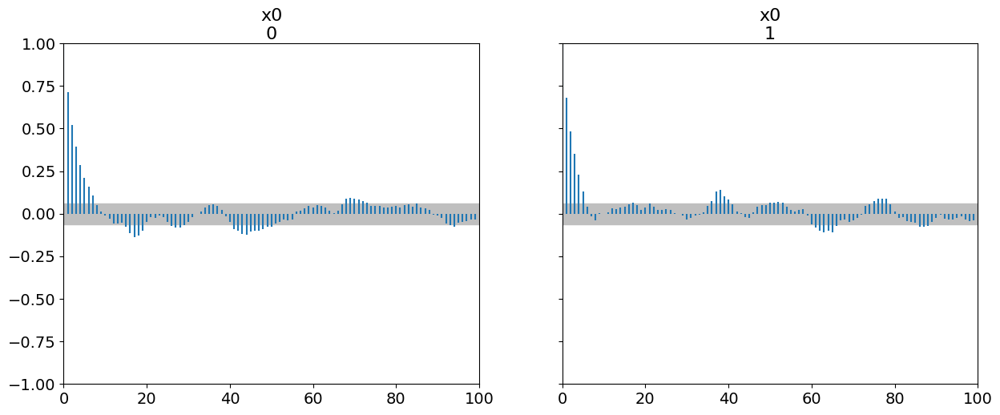

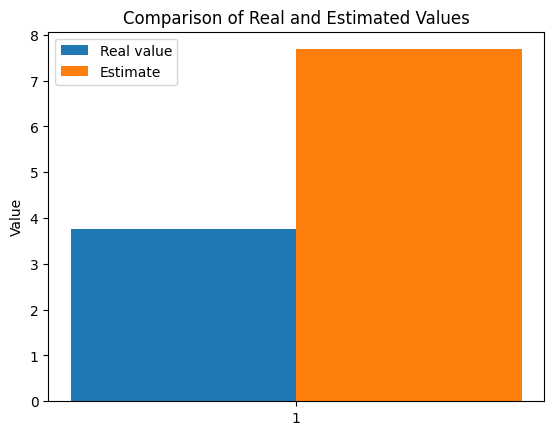

The function param_inverse took 262.257350 seconds.
Sampling chain 1/2


Running chain, α = 0.33: 100%|██████████| 3000/3000 [02:10<00:00, 23.03it/s]


Sampling chain 2/2


Running chain, α = 0.24: 100%|██████████| 3000/3000 [02:10<00:00, 22.94it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.642]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.642  0.677   6.397     8.88      0.038    0.027     314.0     371.0   

    r_hat  
x0    1.0  
Autocorrelation...
The difference between estimated values [3.892]



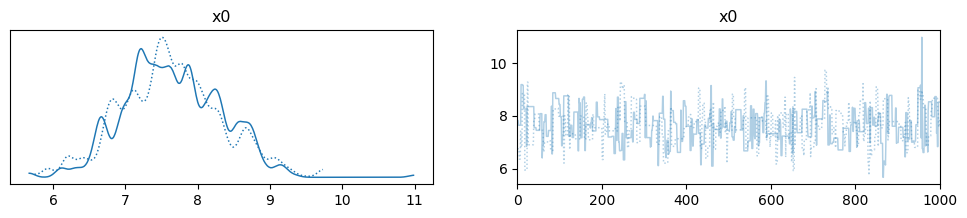

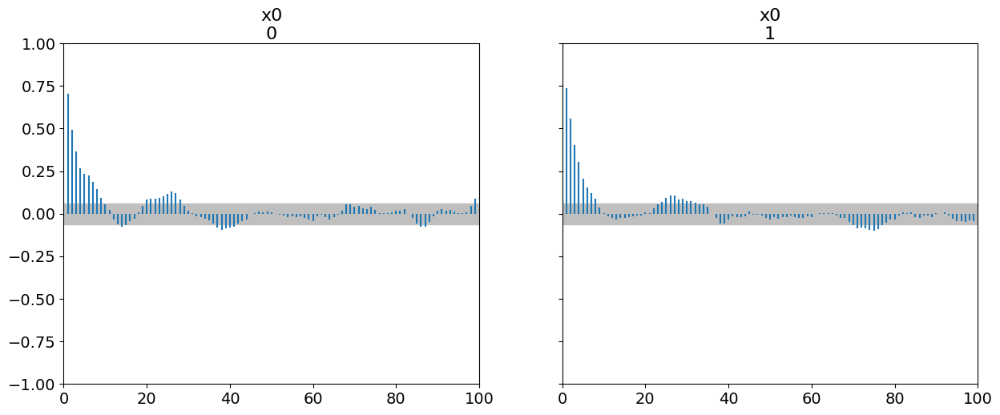

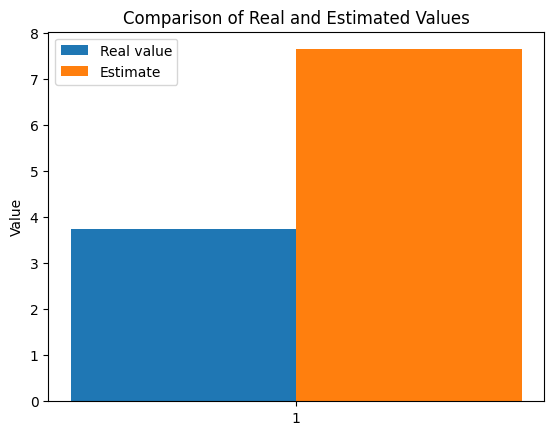

The function param_inverse took 261.699329 seconds.
Sampling chain 1/2


Running chain, α = 0.23: 100%|██████████| 3000/3000 [02:19<00:00, 21.49it/s]


Sampling chain 2/2


Running chain, α = 0.28: 100%|██████████| 3000/3000 [02:24<00:00, 20.79it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [16.384]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  16.384  0.615  15.199   17.483      0.032    0.023     354.0     274.0   

    r_hat  
x0    1.0  
Autocorrelation...
The difference between estimated values [12.634]



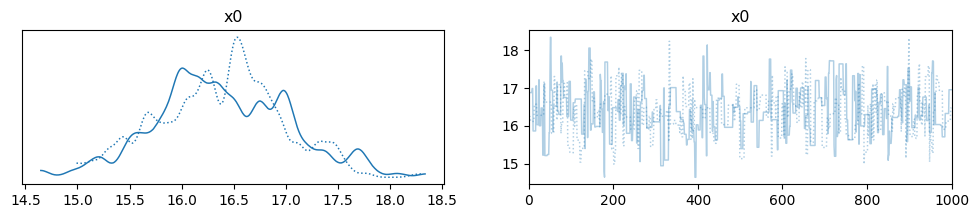

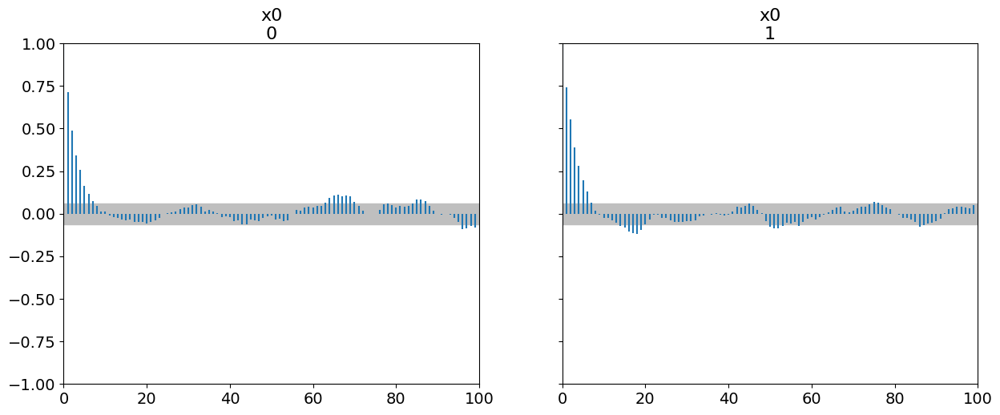

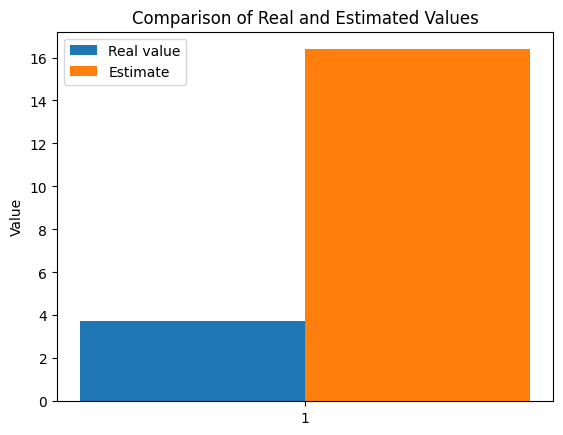

The function param_inverse took 289.418904 seconds.
Sampling chain 1/2


Running chain, α = 0.24: 100%|██████████| 3000/3000 [02:10<00:00, 23.06it/s]


Sampling chain 2/2


Running chain, α = 0.28: 100%|██████████| 3000/3000 [02:10<00:00, 22.93it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [10.172]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  10.172  3.623    7.25   16.887      2.509    2.106       3.0      23.0   

    r_hat  
x0   1.59  
Autocorrelation...
The difference between estimated values [6.422]



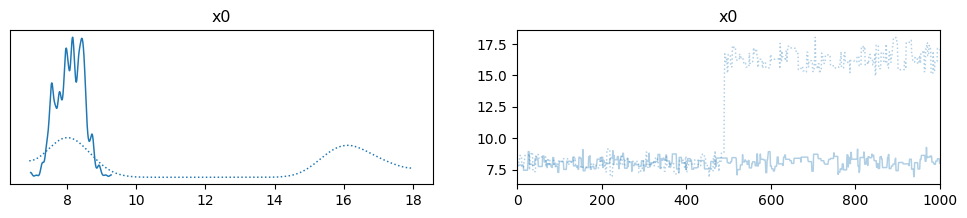

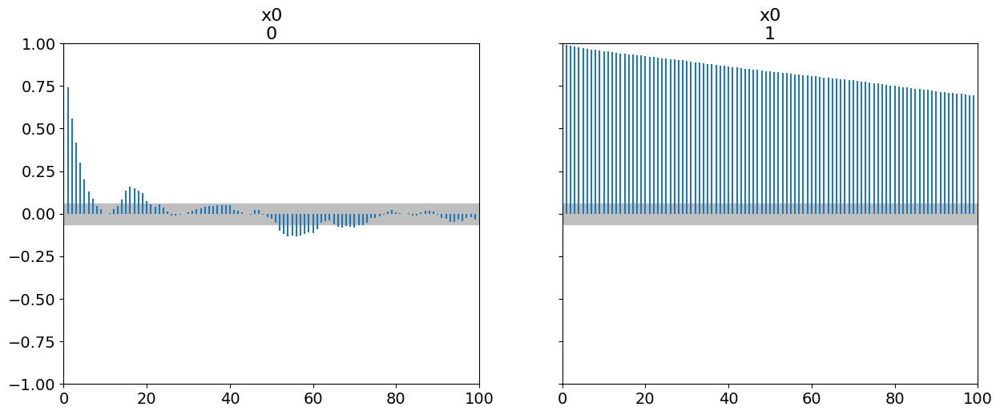

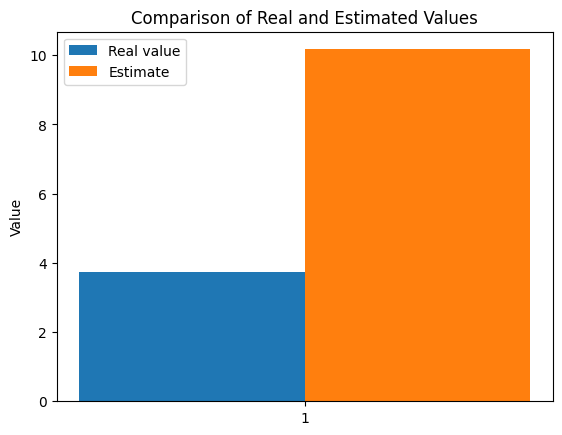

The function param_inverse took 261.638658 seconds.
Sampling chain 1/2


Running chain, α = 0.28: 100%|██████████| 3000/3000 [02:10<00:00, 22.92it/s]


Sampling chain 2/2


Running chain, α = 0.28: 100%|██████████| 3000/3000 [02:10<00:00, 22.94it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [15.434]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  15.434  2.365   7.939   17.487      0.888    0.655      22.0      12.0   

    r_hat  
x0   1.07  
Autocorrelation...
The difference between estimated values [11.684]



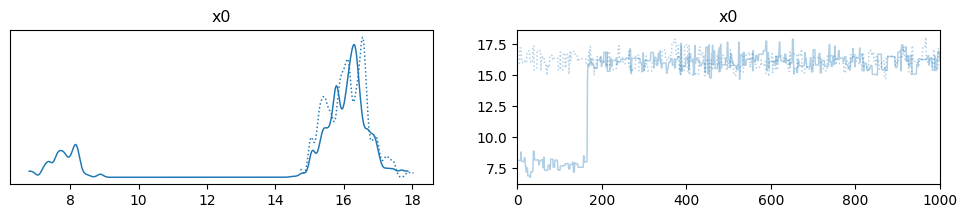

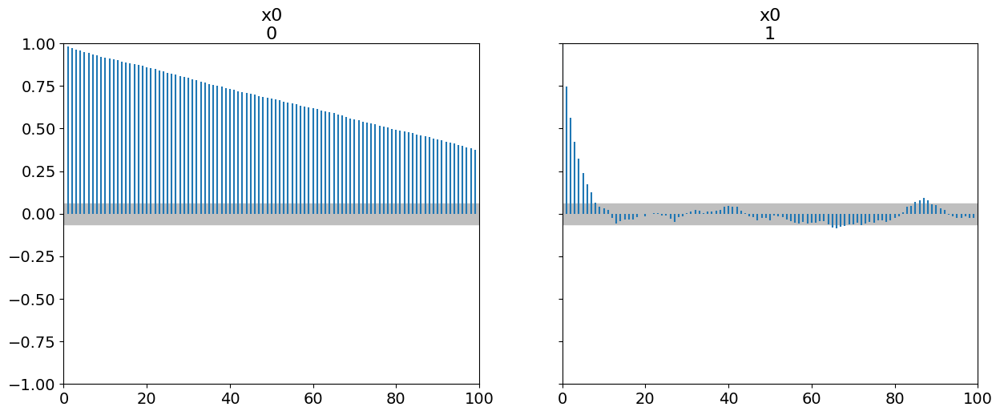

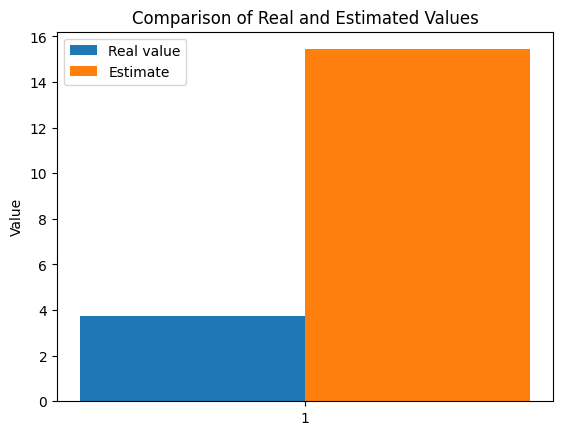

The function param_inverse took 267.882990 seconds.
Sampling chain 1/2


Running chain, α = 0.20: 100%|██████████| 3000/3000 [02:03<00:00, 24.35it/s]


Sampling chain 2/2


Running chain, α = 0.18: 100%|██████████| 3000/3000 [02:03<00:00, 24.26it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.457]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.457  0.789   6.115    8.928      0.044    0.032     319.0     258.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [3.707]



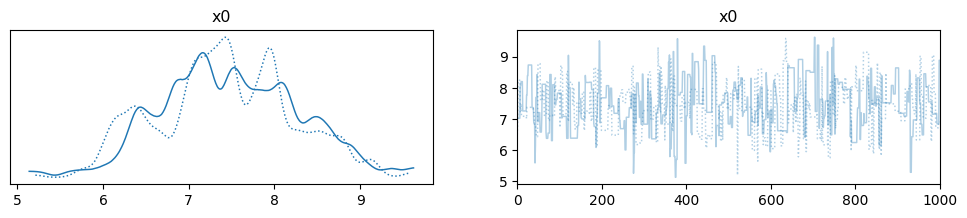

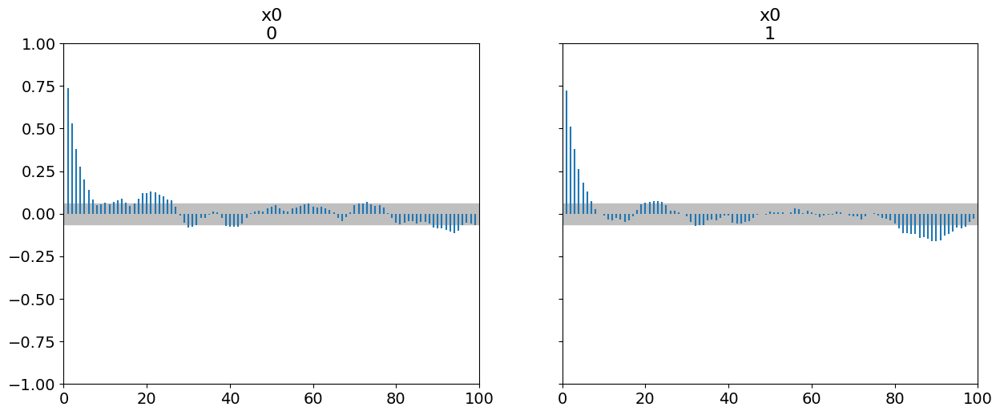

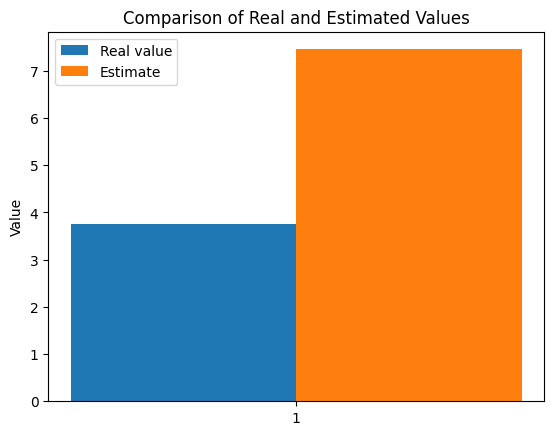

The function param_inverse took 252.462564 seconds.
Sampling chain 1/2


Running chain, α = 0.21: 100%|██████████| 3000/3000 [02:03<00:00, 24.33it/s]


Sampling chain 2/2


Running chain, α = 0.28: 100%|██████████| 3000/3000 [02:03<00:00, 24.32it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.422]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.422  0.748   6.045    8.736      0.043    0.031     308.0     328.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [3.672]



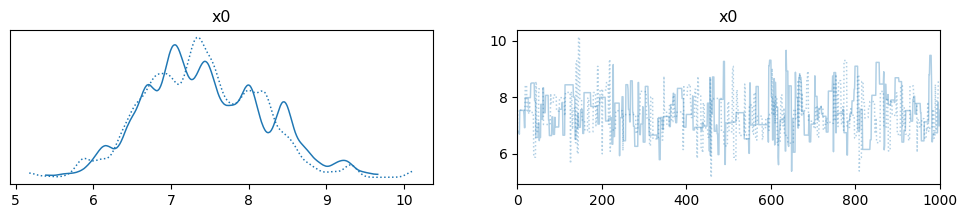

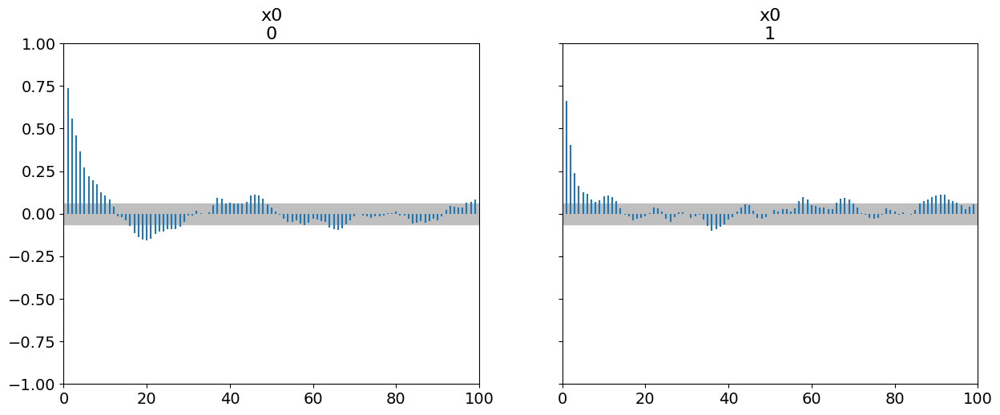

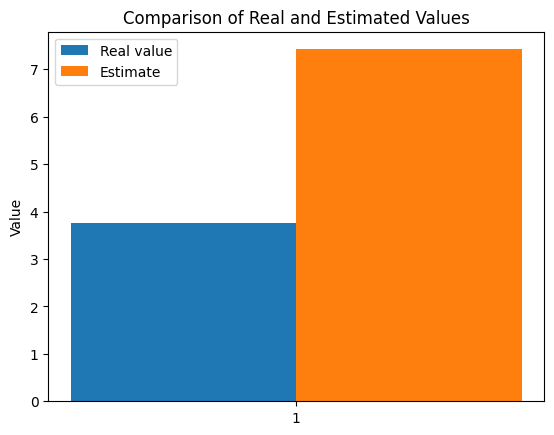

The function param_inverse took 247.476594 seconds.
Sampling chain 1/2


Running chain, α = 0.17: 100%|██████████| 3000/3000 [02:03<00:00, 24.31it/s]


Sampling chain 2/2


Running chain, α = 0.32: 100%|██████████| 3000/3000 [02:03<00:00, 24.21it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.35]
    mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.35  0.784   6.093     8.83       0.04    0.029     390.0     365.0   

    r_hat  
x0    1.0  
Autocorrelation...
The difference between estimated values [3.6]



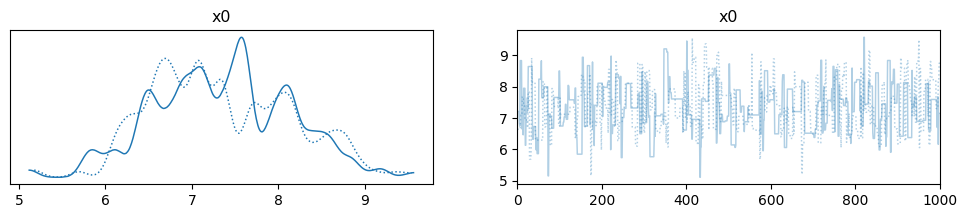

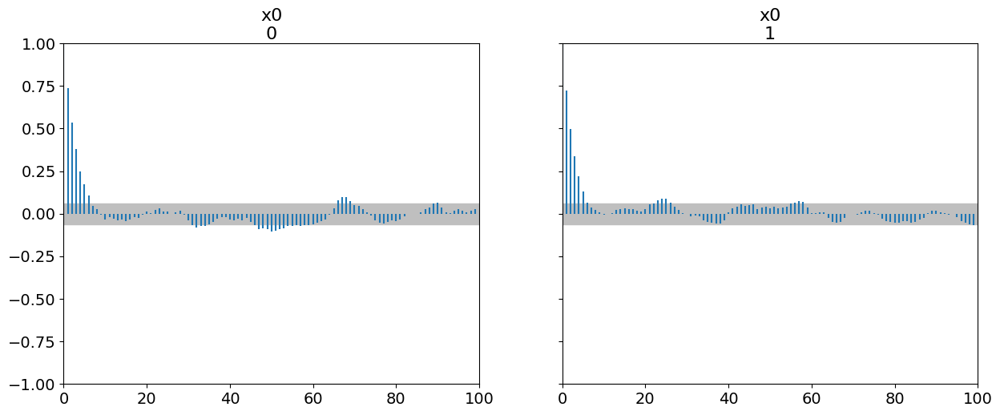

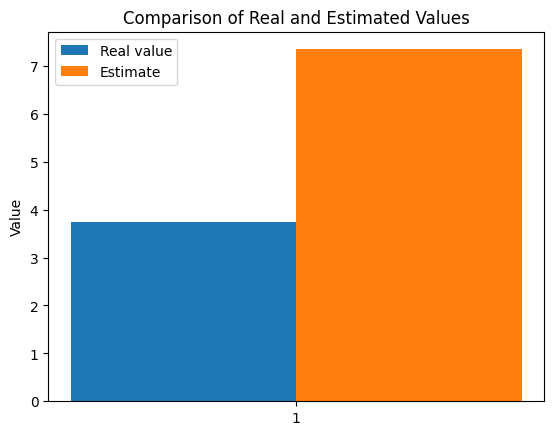

The function param_inverse took 253.089745 seconds.
Sampling chain 1/2


Running chain, α = 0.28: 100%|██████████| 3000/3000 [02:03<00:00, 24.26it/s]


Sampling chain 2/2


Running chain, α = 0.20: 100%|██████████| 3000/3000 [02:03<00:00, 24.32it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.862]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.862  0.601     6.8     8.98      0.036    0.026     283.0     276.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [4.112]



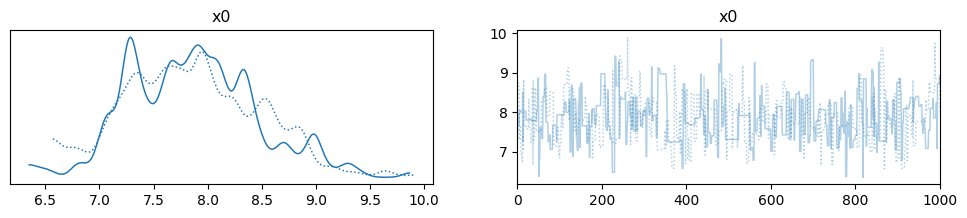

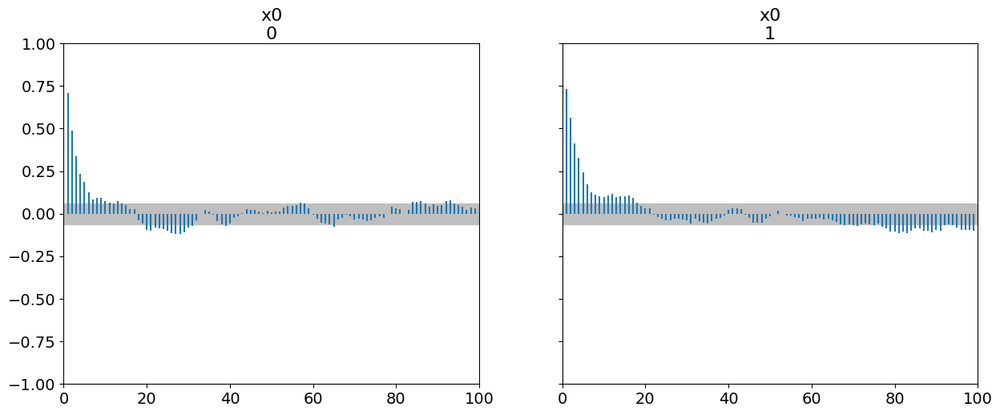

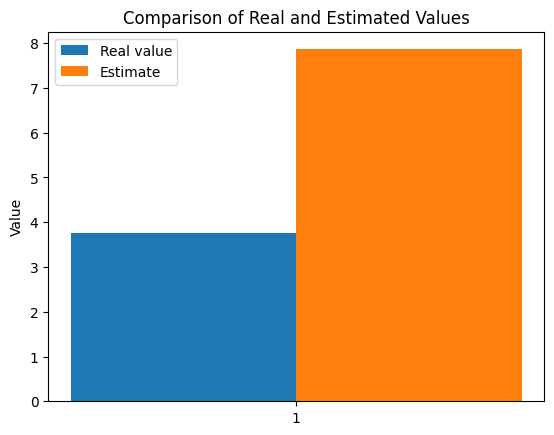

The function param_inverse took 252.891037 seconds.
Sampling chain 1/2


Running chain, α = 0.33: 100%|██████████| 3000/3000 [02:03<00:00, 24.28it/s]


Sampling chain 2/2


Running chain, α = 0.37: 100%|██████████| 3000/3000 [02:03<00:00, 24.31it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.913]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.913  0.677   6.852    9.297      0.036    0.026     362.0     297.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [4.163]



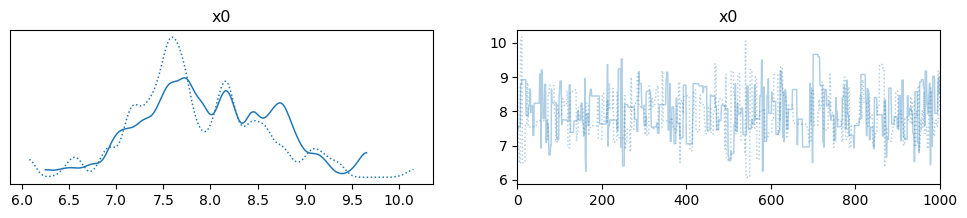

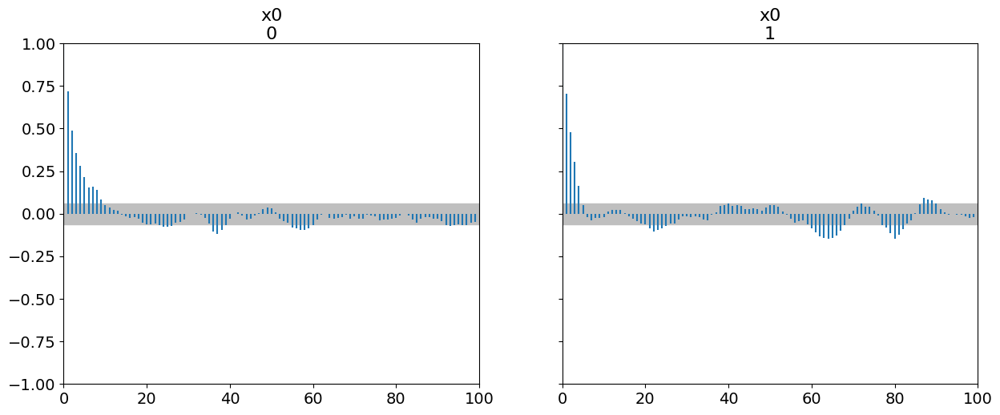

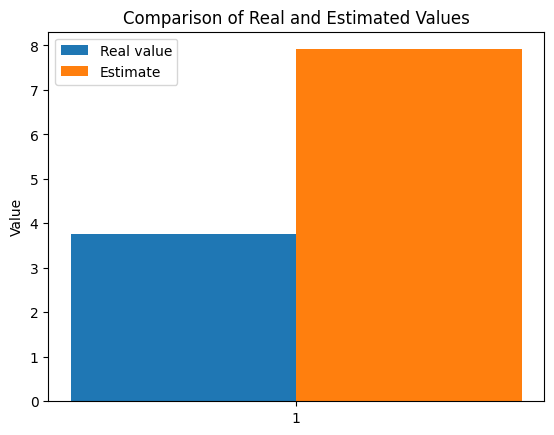

The function param_inverse took 247.708119 seconds.
Sampling chain 1/2


Running chain, α = 0.22: 100%|██████████| 3000/3000 [02:03<00:00, 24.23it/s]


Sampling chain 2/2


Running chain, α = 0.33: 100%|██████████| 3000/3000 [02:03<00:00, 24.26it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.861]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.861  0.642   6.577    8.974      0.033    0.023     381.0     264.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [4.111]



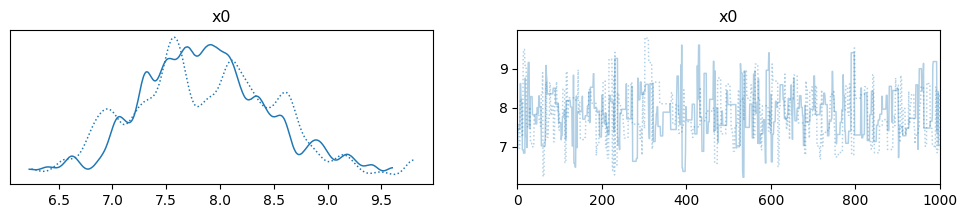

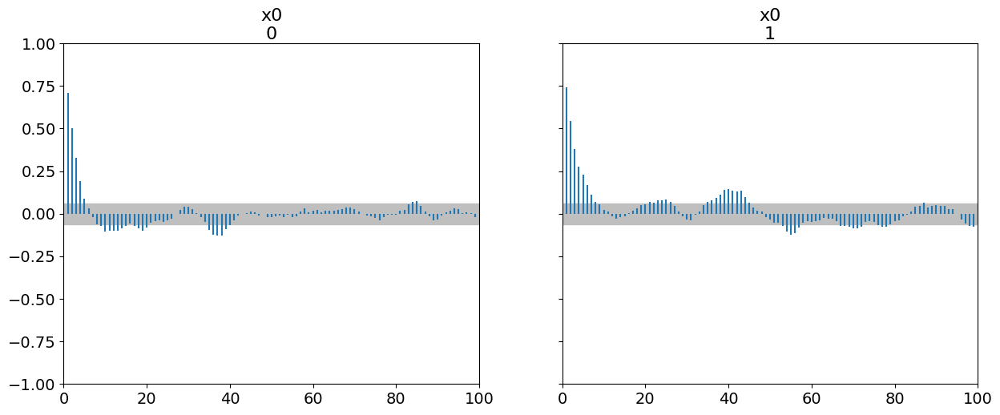

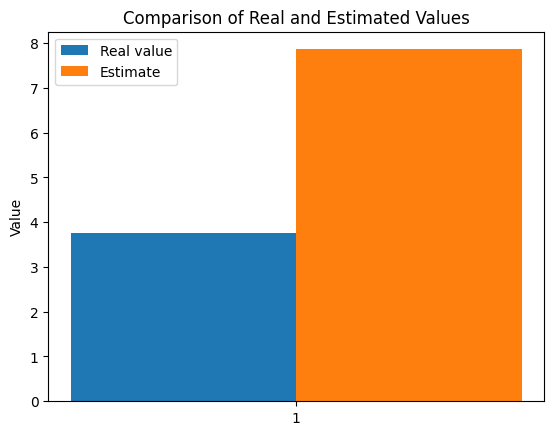

The function param_inverse took 253.653608 seconds.
The best estimate is given by: sigma_noise=0.1, number of data=30, sigma=4.0, rwmh_scaling=1.0
Sampling chain 1/2


Running chain, α = 0.21: 100%|██████████| 3000/3000 [02:11<00:00, 22.77it/s]


Sampling chain 2/2


Running chain, α = 0.26: 100%|██████████| 3000/3000 [02:10<00:00, 23.04it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [13.959]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  13.959  0.143   13.82   14.206      0.012    0.009     118.0     128.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [10.209]



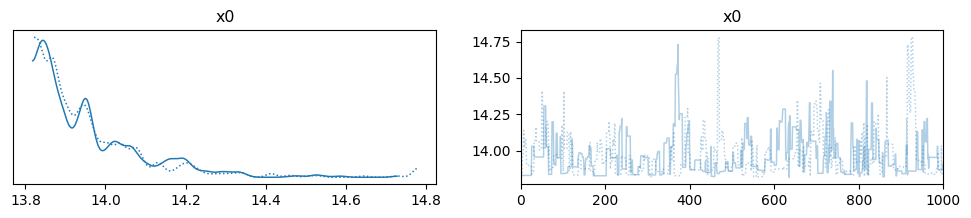

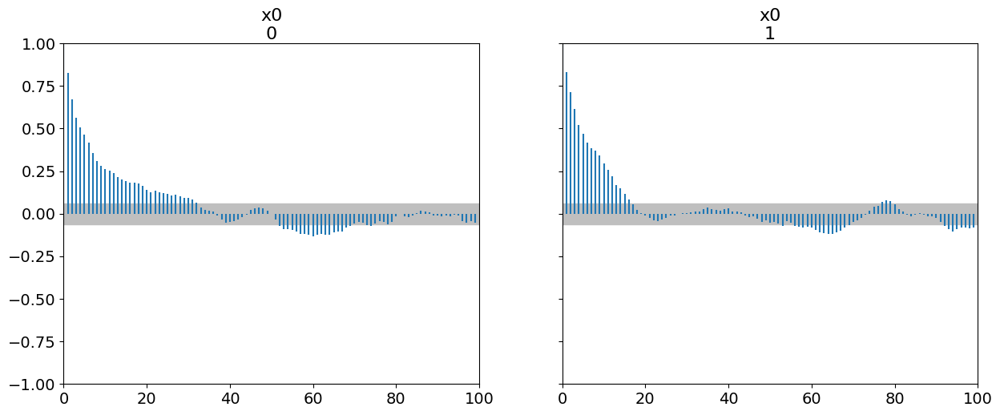

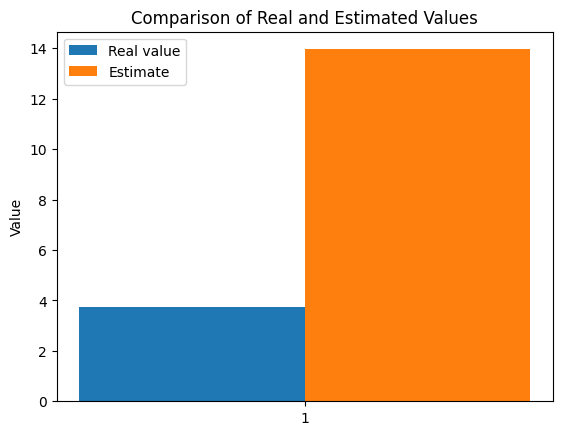

The function param_inverse took 262.761644 seconds.
Sampling chain 1/2


Running chain, α = 0.24: 100%|██████████| 3000/3000 [02:10<00:00, 22.93it/s]


Sampling chain 2/2


Running chain, α = 0.27: 100%|██████████| 3000/3000 [02:10<00:00, 23.03it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [13.996]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  13.996  0.166  13.817   14.273      0.016    0.011     125.0     175.0   

    r_hat  
x0    1.0  
Autocorrelation...
The difference between estimated values [10.246]



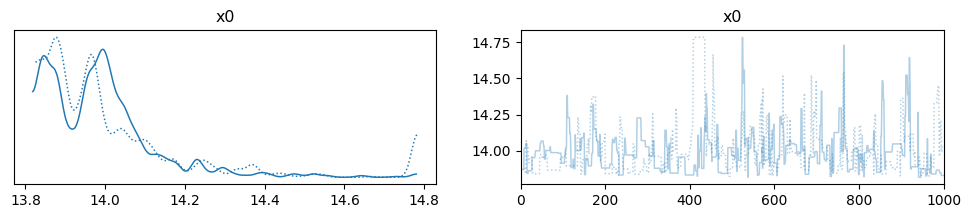

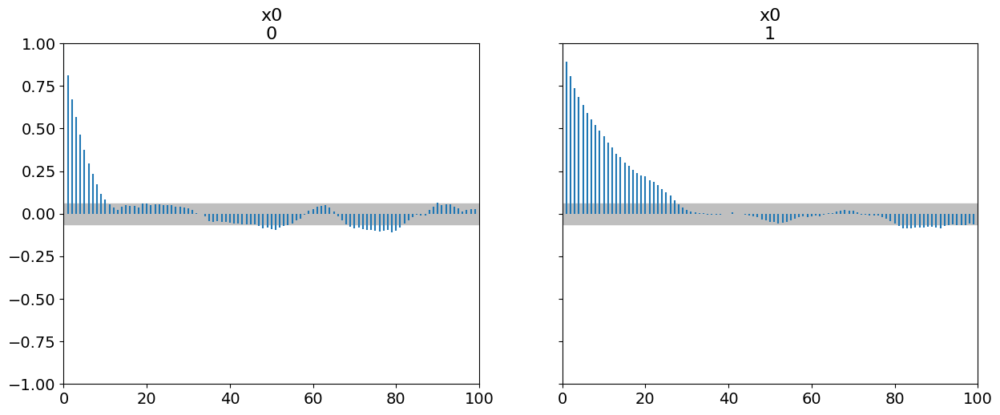

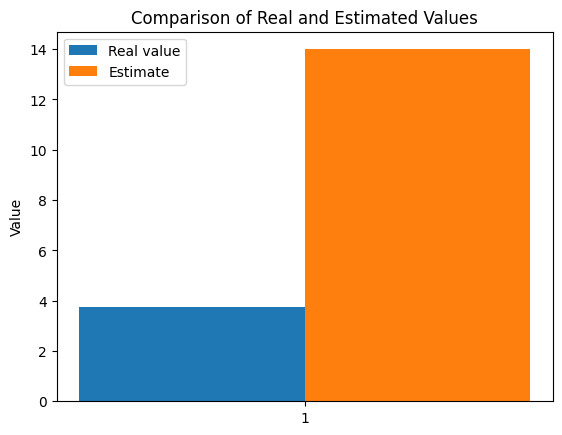

The function param_inverse took 261.773967 seconds.
Sampling chain 1/2


Running chain, α = 0.19: 100%|██████████| 3000/3000 [02:10<00:00, 22.97it/s]


Sampling chain 2/2


Running chain, α = 0.32: 100%|██████████| 3000/3000 [02:11<00:00, 22.89it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [13.967]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  13.967  0.188  13.817   14.274       0.02    0.014      90.0      40.0   

    r_hat  
x0   1.02  
Autocorrelation...
The difference between estimated values [10.217]



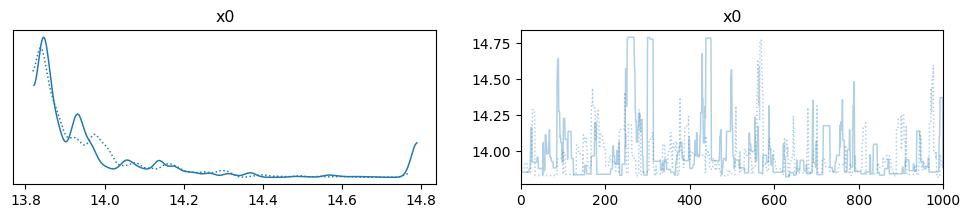

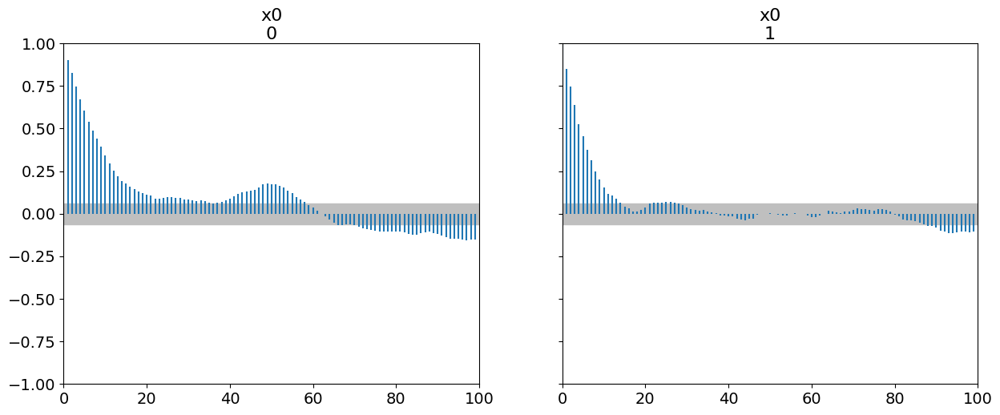

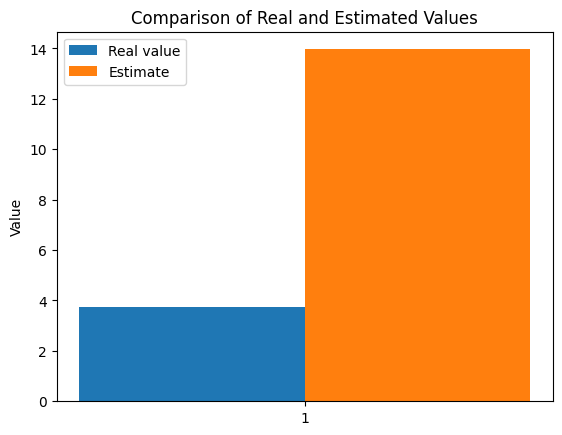

The function param_inverse took 262.452198 seconds.
Sampling chain 1/2


Running chain, α = 0.21: 100%|██████████| 3000/3000 [02:11<00:00, 22.83it/s]


Sampling chain 2/2


Running chain, α = 0.23: 100%|██████████| 3000/3000 [02:11<00:00, 22.87it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [14.784]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  14.784  0.003  14.778   14.791        0.0      0.0     196.0     131.0   

    r_hat  
x0   1.02  
Autocorrelation...
The difference between estimated values [11.034]



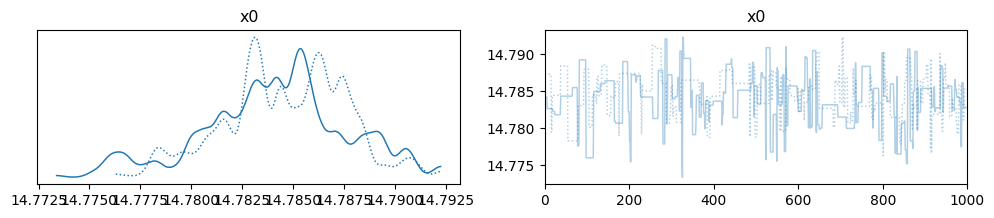

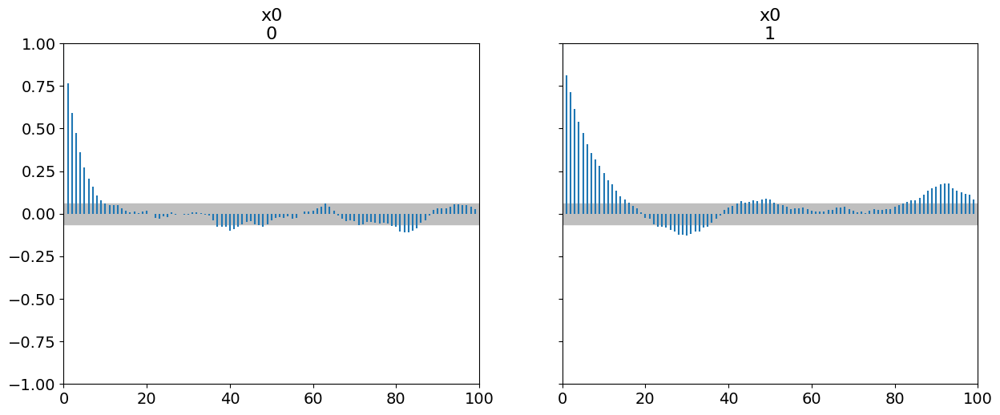

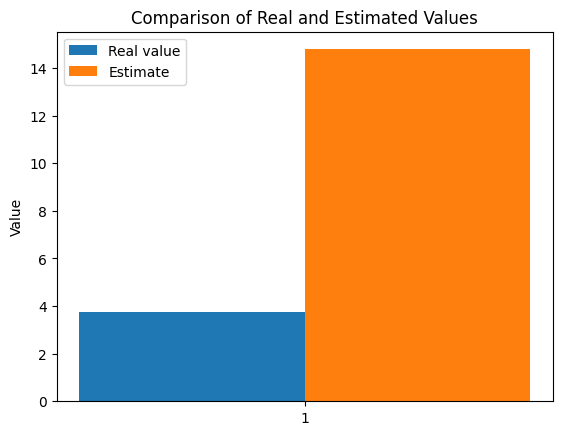

The function param_inverse took 268.508444 seconds.
Sampling chain 1/2


Running chain, α = 0.22: 100%|██████████| 3000/3000 [02:10<00:00, 22.95it/s]


Sampling chain 2/2


Running chain, α = 0.21: 100%|██████████| 3000/3000 [02:10<00:00, 22.92it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [14.784]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  14.784  0.003  14.779    14.79        0.0      0.0     245.0     245.0   

    r_hat  
x0    1.0  
Autocorrelation...
The difference between estimated values [11.034]



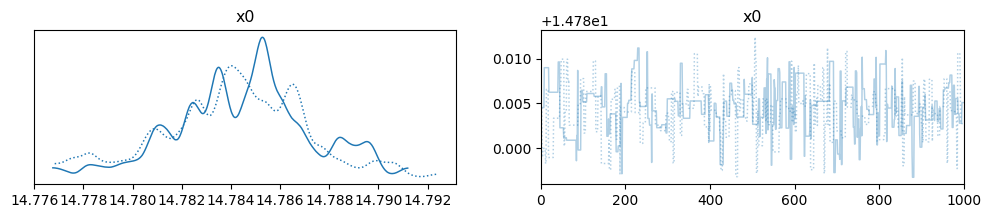

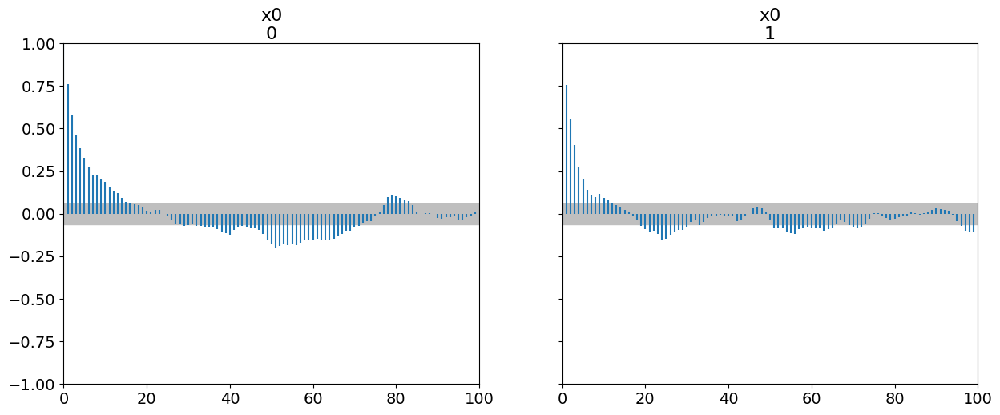

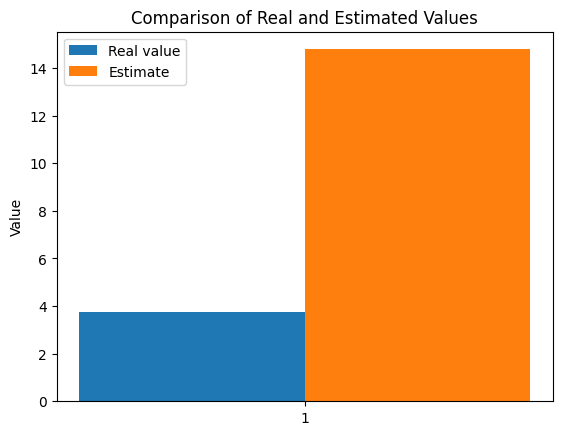

The function param_inverse took 267.474462 seconds.
Sampling chain 1/2


Running chain, α = 0.18: 100%|██████████| 3000/3000 [02:11<00:00, 22.87it/s]


Sampling chain 2/2


Running chain, α = 0.15: 100%|██████████| 3000/3000 [02:11<00:00, 22.88it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [14.784]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  14.784  0.003  14.779    14.79        0.0      0.0     193.0     189.0   

    r_hat  
x0   1.02  
Autocorrelation...
The difference between estimated values [11.034]



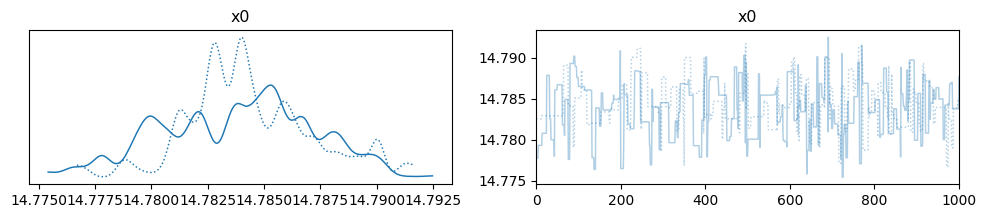

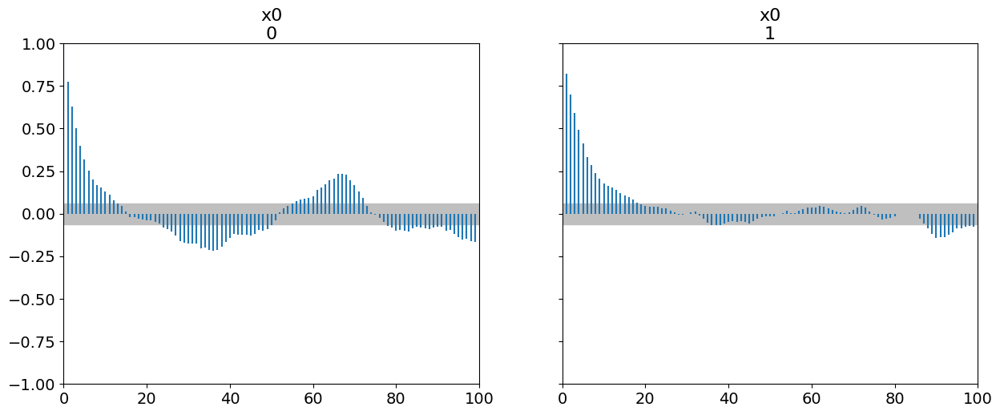

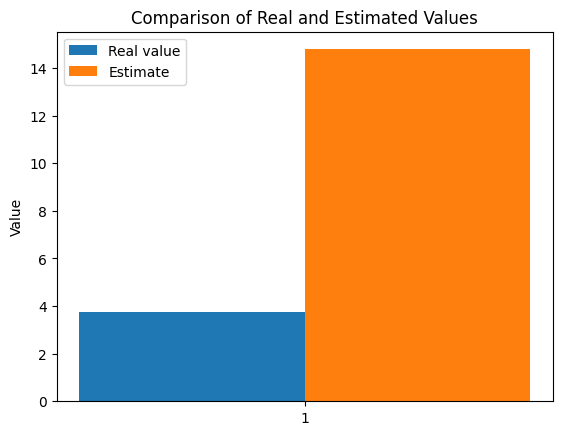

The function param_inverse took 263.127869 seconds.
Sampling chain 1/2


Running chain, α = 0.24: 100%|██████████| 3000/3000 [02:03<00:00, 24.29it/s]


Sampling chain 2/2


Running chain, α = 0.27: 100%|██████████| 3000/3000 [02:03<00:00, 24.21it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [13.646]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  13.646  0.152  13.482   13.938      0.011    0.007     193.0     116.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [9.896]



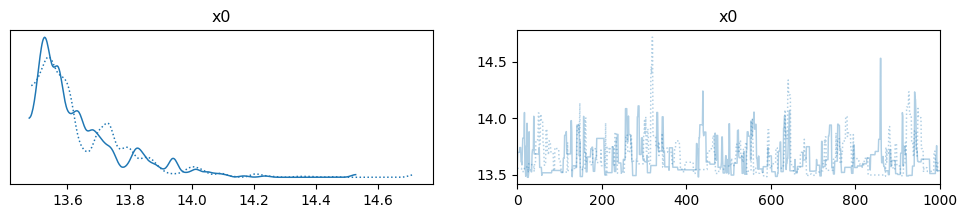

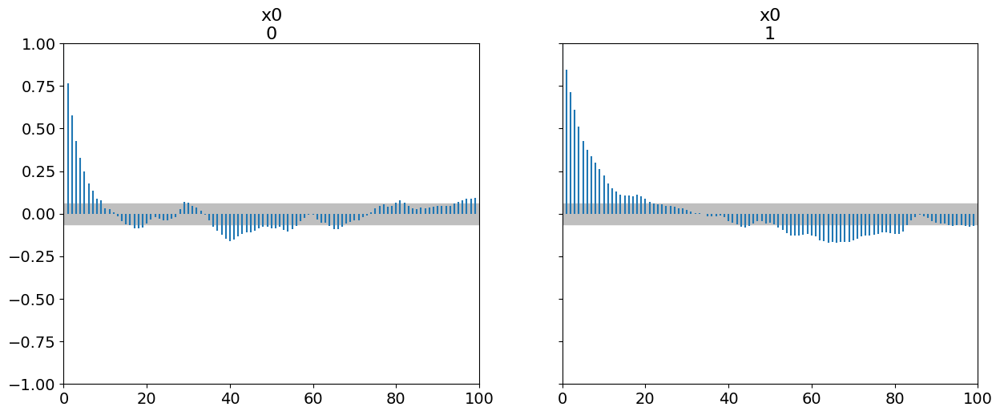

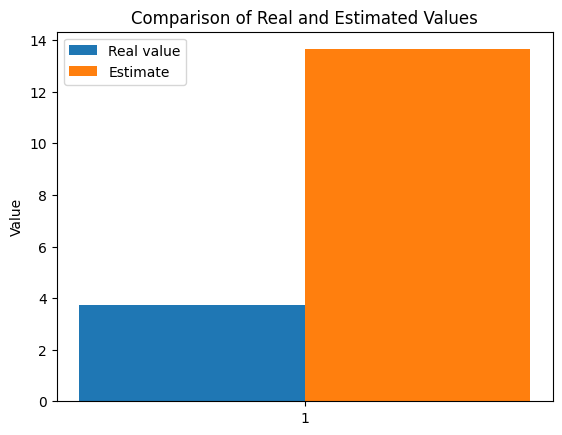

The function param_inverse took 248.195190 seconds.
Sampling chain 1/2


Running chain, α = 0.34: 100%|██████████| 3000/3000 [02:04<00:00, 24.10it/s]


Sampling chain 2/2


Running chain, α = 0.23: 100%|██████████| 3000/3000 [02:04<00:00, 24.08it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [13.657]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  13.657  0.183  13.481   13.935      0.014     0.01     137.0     252.0   

    r_hat  
x0   1.04  
Autocorrelation...
The difference between estimated values [9.907]



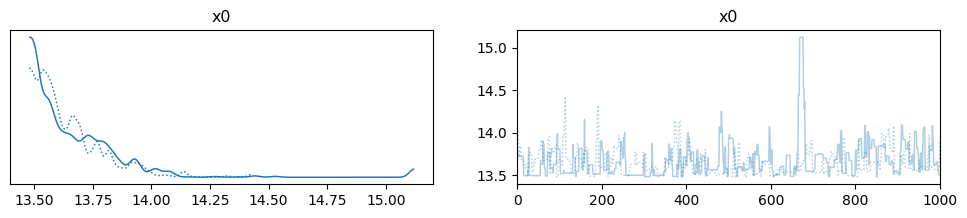

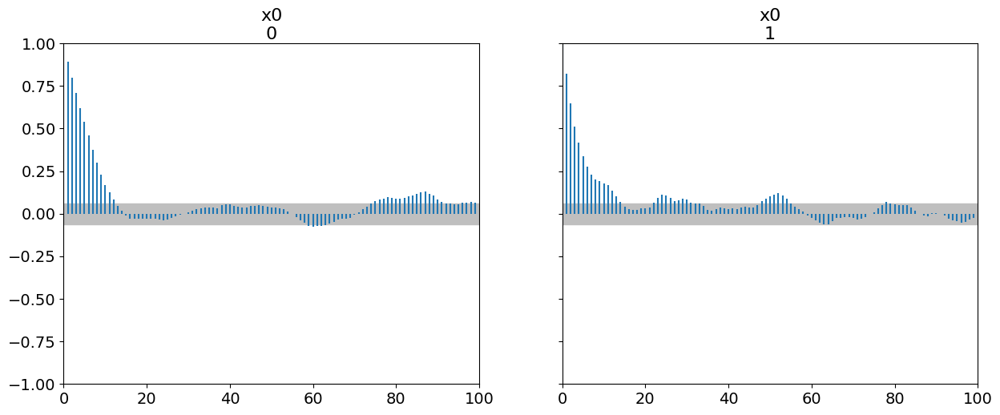

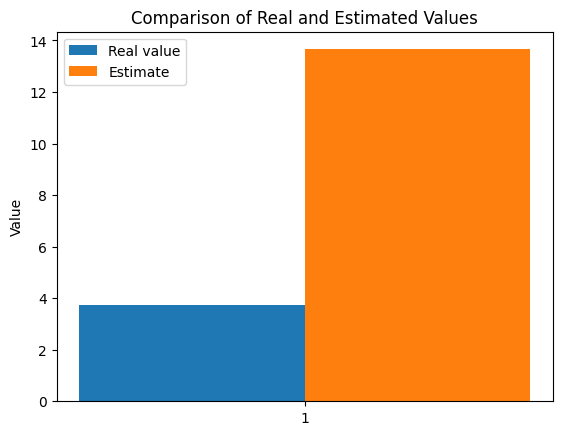

The function param_inverse took 249.944494 seconds.
Sampling chain 1/2


Running chain, α = 0.34: 100%|██████████| 3000/3000 [02:03<00:00, 24.23it/s]


Sampling chain 2/2


Running chain, α = 0.12: 100%|██████████| 3000/3000 [02:04<00:00, 24.13it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [13.628]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  13.628  0.142  13.478   13.907      0.011    0.008     177.0     189.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [9.878]



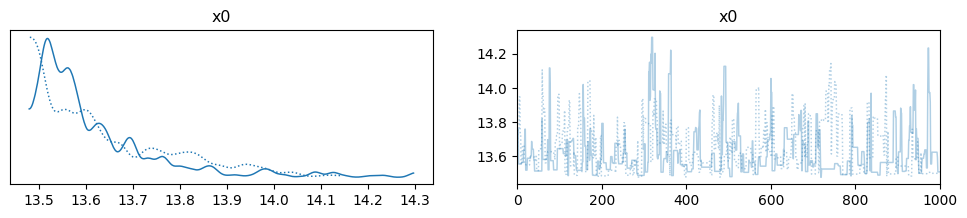

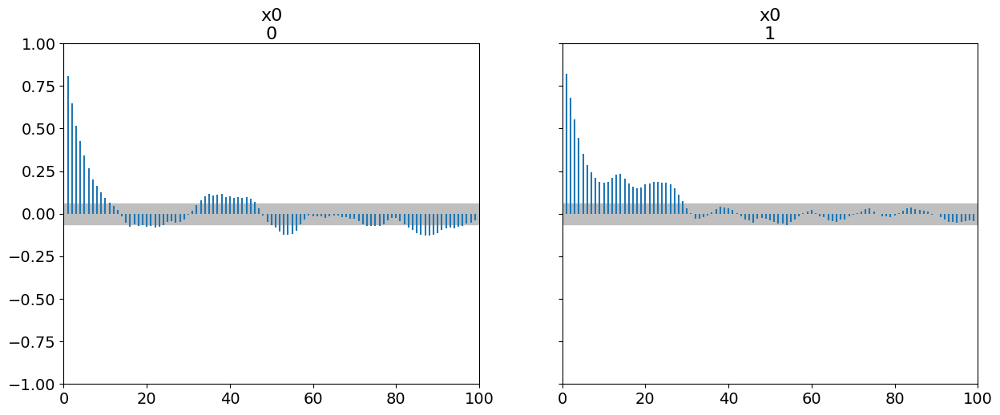

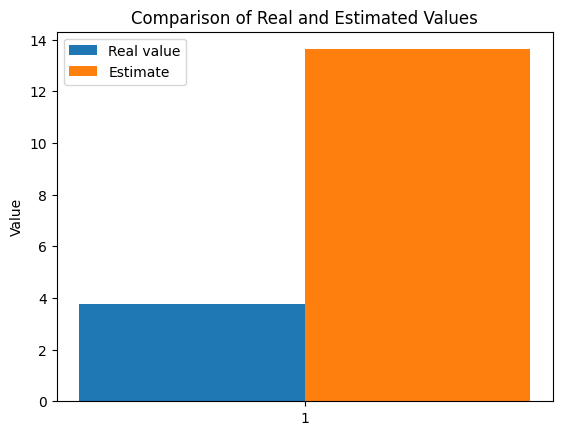

The function param_inverse took 248.895408 seconds.
Sampling chain 1/2


Running chain, α = 0.12: 100%|██████████| 3000/3000 [02:04<00:00, 24.14it/s]


Sampling chain 2/2


Running chain, α = 0.14: 100%|██████████| 3000/3000 [02:04<00:00, 24.16it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [15.124]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  15.124  0.003  15.118   15.131        0.0      0.0     199.0     190.0   

    r_hat  
x0   1.02  
Autocorrelation...
The difference between estimated values [11.374]



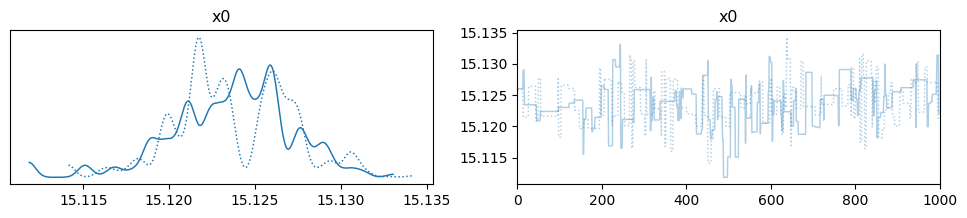

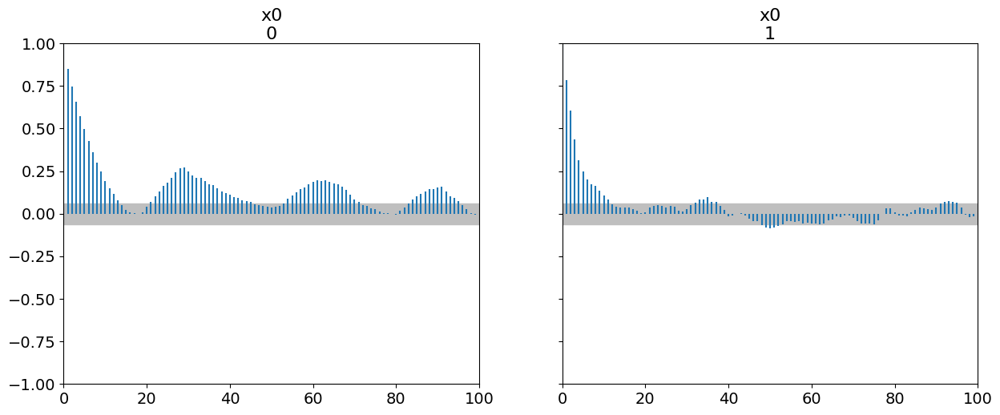

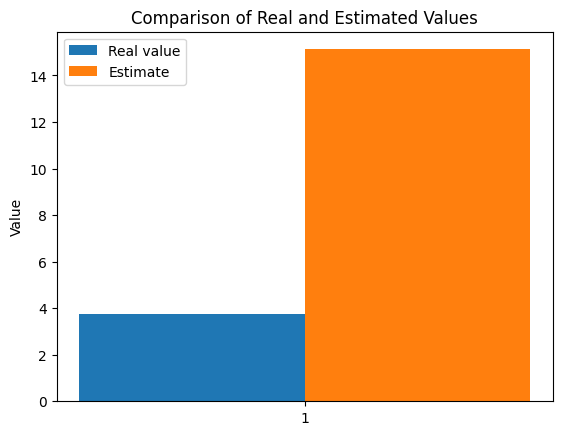

The function param_inverse took 256.001369 seconds.
Sampling chain 1/2


Running chain, α = 0.05: 100%|██████████| 3000/3000 [02:04<00:00, 24.15it/s]


Sampling chain 2/2


Running chain, α = 0.23: 100%|██████████| 3000/3000 [02:04<00:00, 24.04it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [15.123]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  15.123  0.003  15.117   15.127        0.0      0.0      58.0      69.0   

    r_hat  
x0   1.07  
Autocorrelation...
The difference between estimated values [11.373]



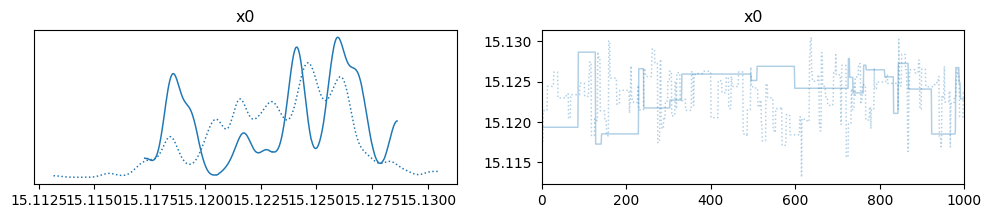

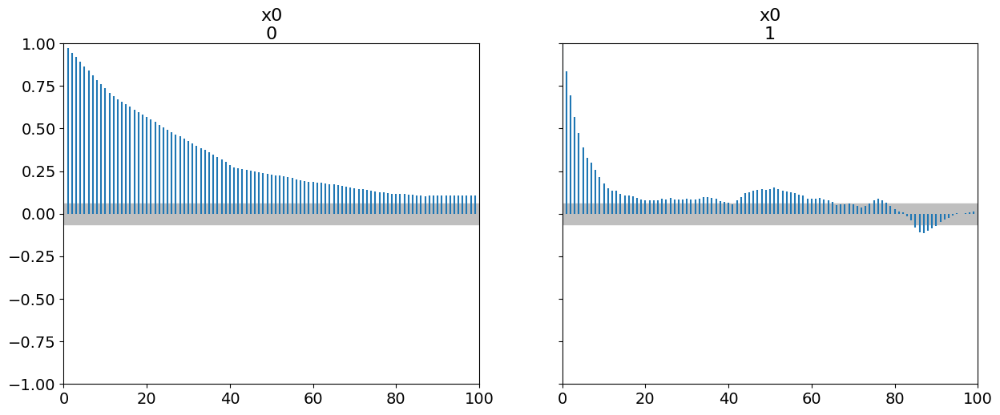

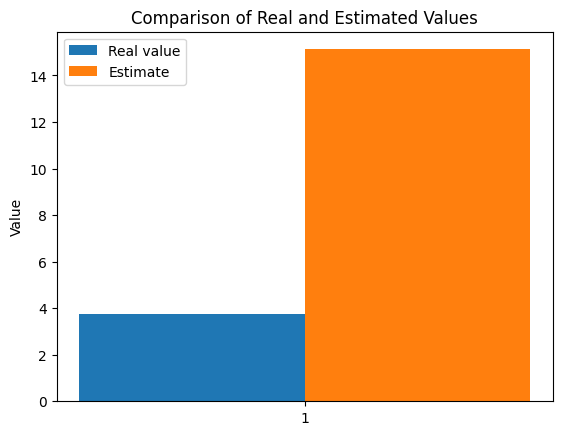

The function param_inverse took 249.997467 seconds.
Sampling chain 1/2


Running chain, α = 0.34: 100%|██████████| 3000/3000 [02:04<00:00, 24.18it/s]


Sampling chain 2/2


Running chain, α = 0.18: 100%|██████████| 3000/3000 [02:04<00:00, 24.14it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [15.124]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  15.124  0.003  15.118   15.129        0.0      0.0     218.0     276.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [11.374]



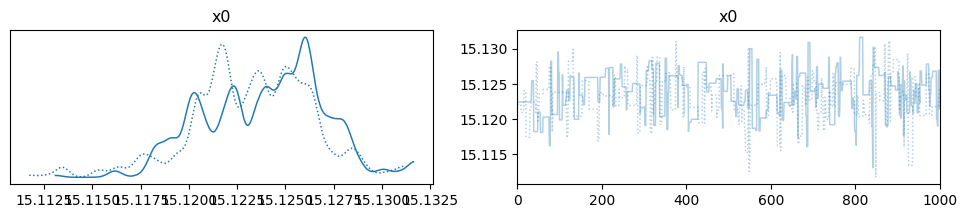

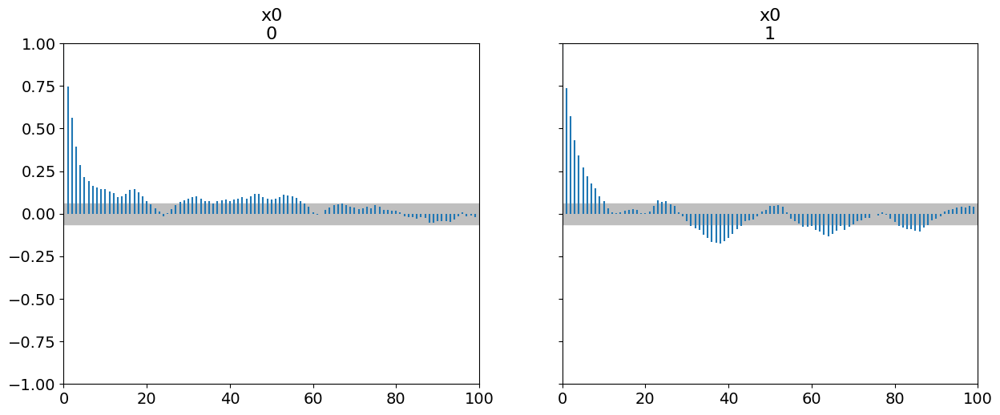

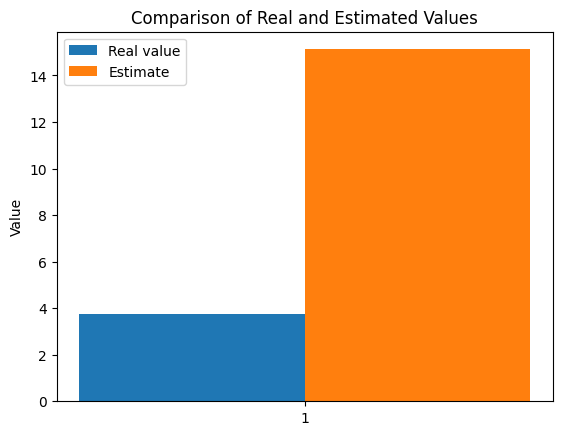

The function param_inverse took 249.136540 seconds.
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 3000/3000 [02:11<00:00, 22.83it/s]


Sampling chain 2/2


Running chain, α = 0.22: 100%|██████████| 3000/3000 [02:10<00:00, 22.91it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [13.953]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  13.953  0.142   13.82   14.197      0.009    0.006     237.0     121.0   

    r_hat  
x0   1.02  
Autocorrelation...
The difference between estimated values [10.203]



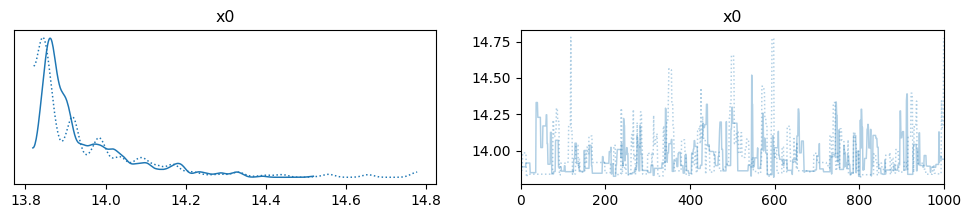

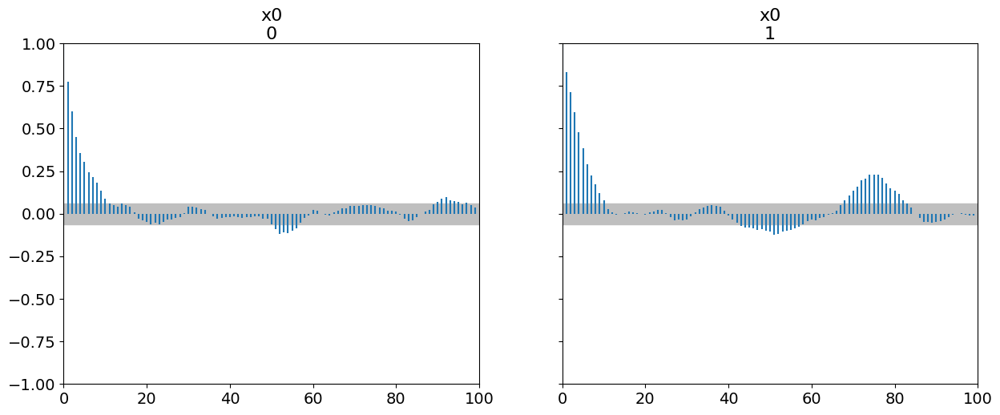

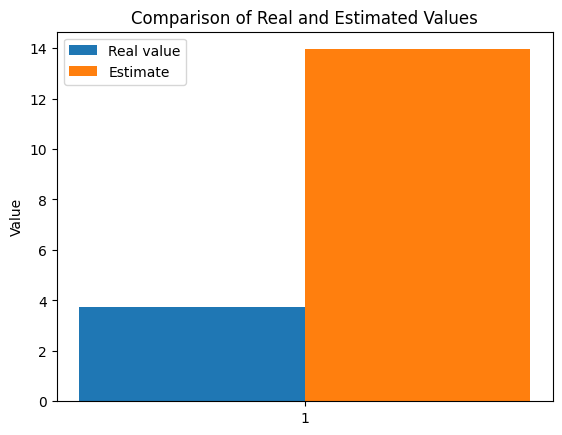

The function param_inverse took 263.227025 seconds.
Sampling chain 1/2


Running chain, α = 0.32: 100%|██████████| 3000/3000 [02:11<00:00, 22.83it/s]


Sampling chain 2/2


Running chain, α = 0.31: 100%|██████████| 3000/3000 [02:11<00:00, 22.81it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [13.963]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  13.963  0.148   13.82   14.223       0.01    0.007     184.0     170.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [10.213]



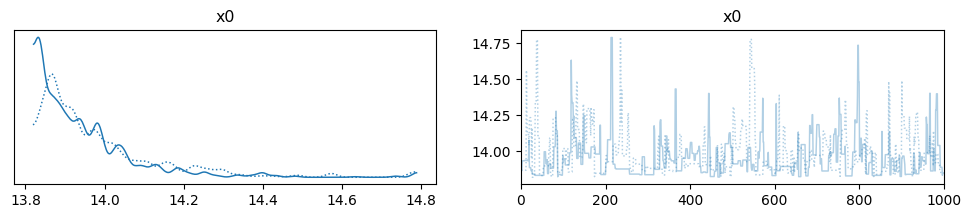

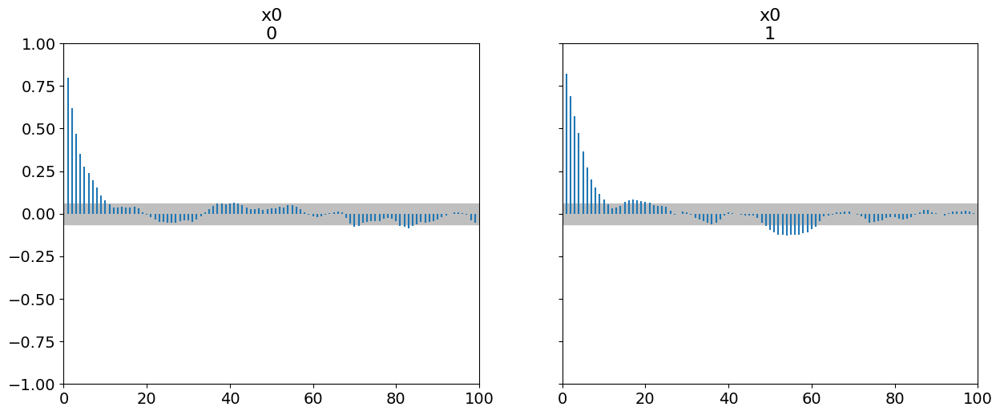

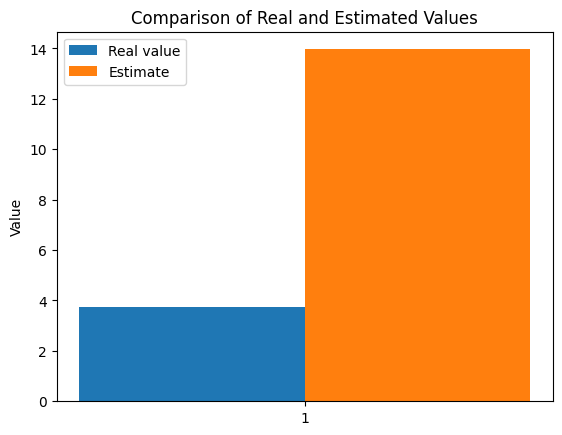

The function param_inverse took 270.503992 seconds.
Sampling chain 1/2


Running chain, α = 0.26: 100%|██████████| 3000/3000 [02:12<00:00, 22.64it/s]


Sampling chain 2/2


Running chain, α = 0.29: 100%|██████████| 3000/3000 [02:11<00:00, 22.87it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [14.007]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  14.007  0.187  13.825   14.316      0.015    0.011     145.0     222.0   

    r_hat  
x0   1.02  
Autocorrelation...
The difference between estimated values [10.257]



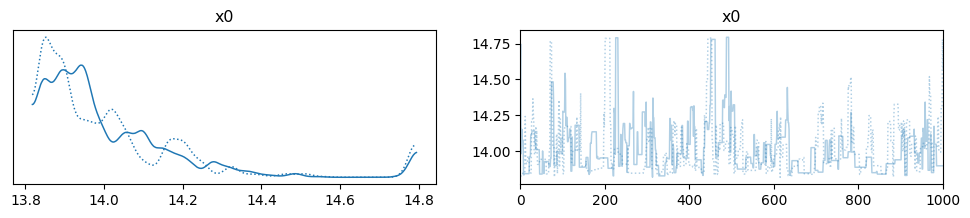

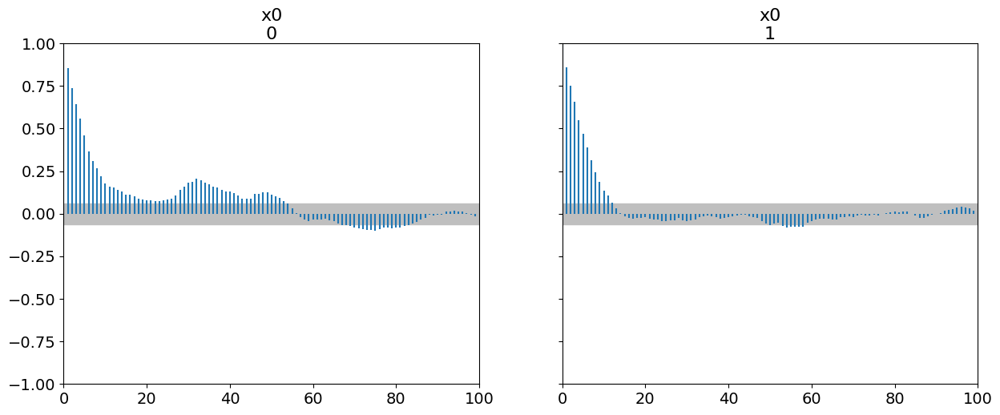

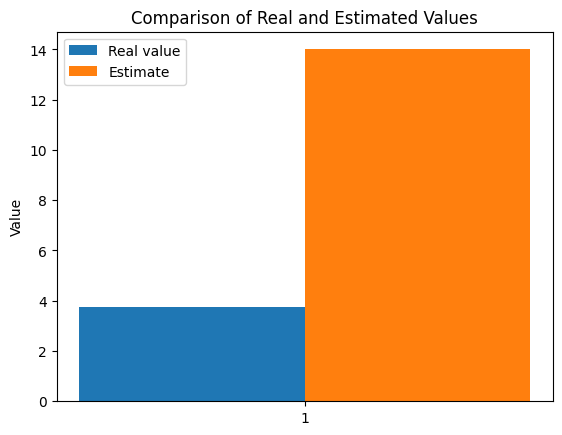

The function param_inverse took 264.362086 seconds.
Sampling chain 1/2


Running chain, α = 0.26: 100%|██████████| 3000/3000 [02:11<00:00, 22.81it/s]


Sampling chain 2/2


Running chain, α = 0.10: 100%|██████████| 3000/3000 [02:11<00:00, 22.78it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [14.785]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  14.785  0.003  14.779    14.79        0.0      0.0     181.0     209.0   

    r_hat  
x0   1.03  
Autocorrelation...
The difference between estimated values [11.035]



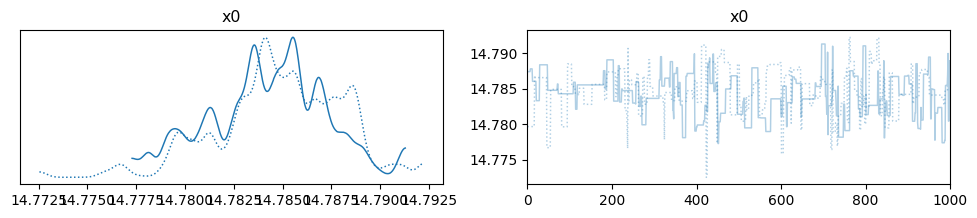

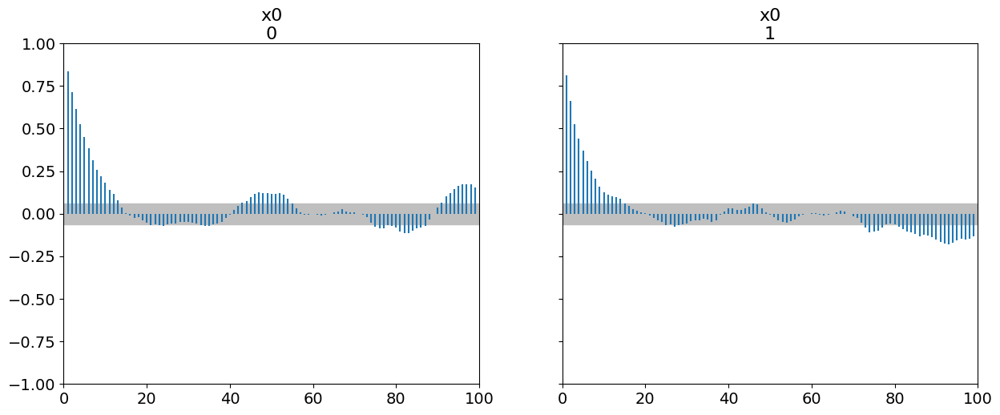

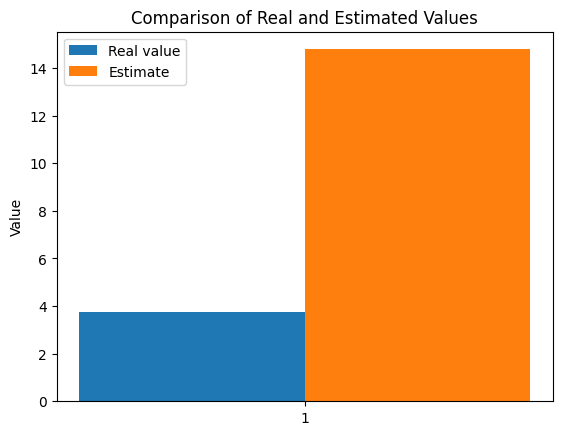

The function param_inverse took 270.236583 seconds.
Sampling chain 1/2


Running chain, α = 0.24: 100%|██████████| 3000/3000 [02:11<00:00, 22.75it/s]


Sampling chain 2/2


Running chain, α = 0.23: 100%|██████████| 3000/3000 [02:11<00:00, 22.79it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [14.784]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  14.784  0.003  14.778   14.789        0.0      0.0     290.0     255.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [11.034]



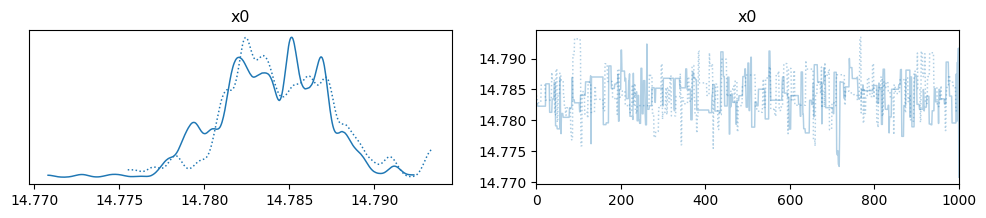

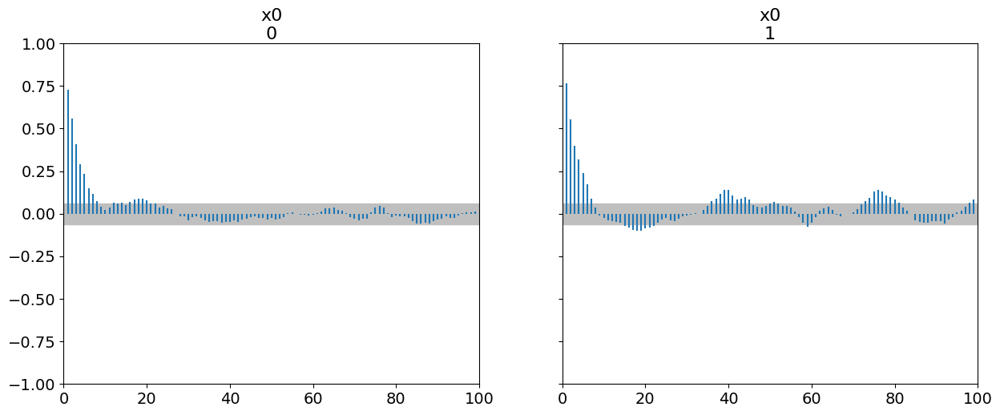

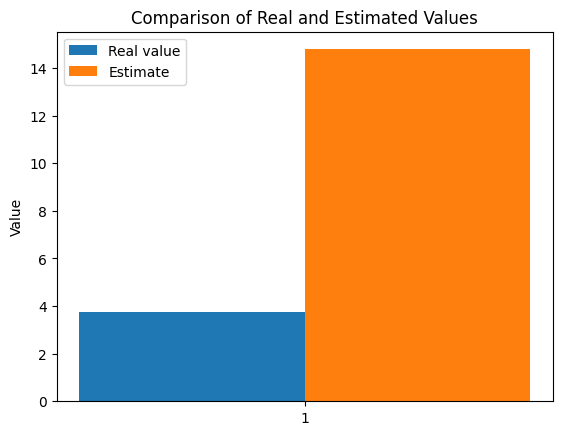

The function param_inverse took 264.408403 seconds.
Sampling chain 1/2


Running chain, α = 0.18: 100%|██████████| 3000/3000 [02:11<00:00, 22.78it/s]


Sampling chain 2/2


Running chain, α = 0.19: 100%|██████████| 3000/3000 [02:12<00:00, 22.70it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [14.784]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  14.784  0.003  14.779    14.79        0.0      0.0     177.0     172.0   

    r_hat  
x0   1.03  
Autocorrelation...
The difference between estimated values [11.034]



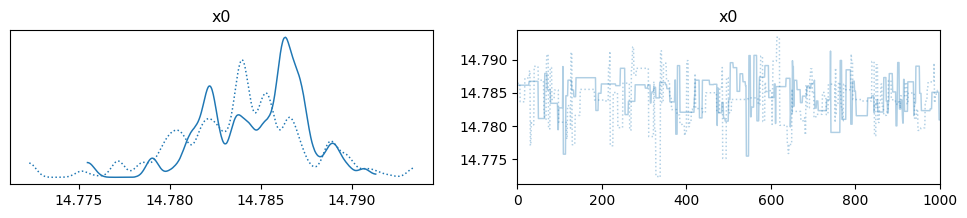

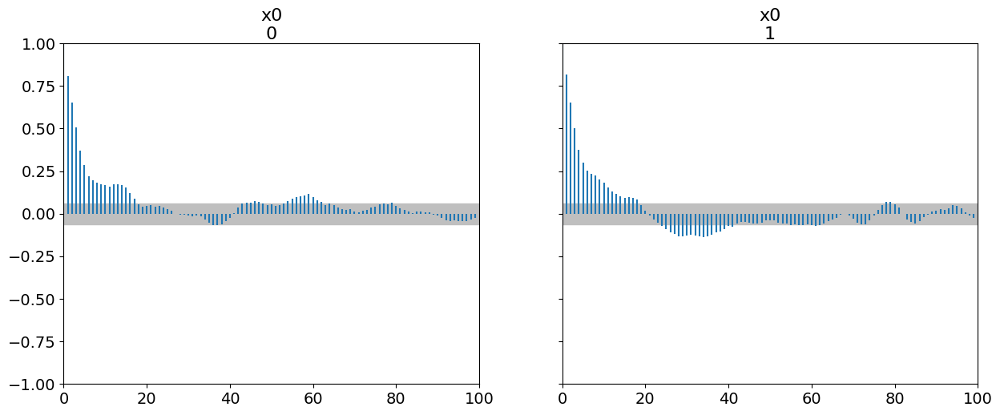

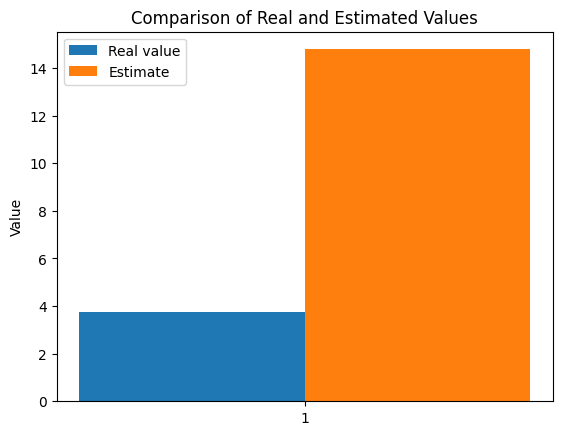

The function param_inverse took 264.513161 seconds.
Sampling chain 1/2


Running chain, α = 0.19: 100%|██████████| 3000/3000 [02:04<00:00, 24.12it/s]


Sampling chain 2/2


Running chain, α = 0.14: 100%|██████████| 3000/3000 [02:03<00:00, 24.27it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.076]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.076  6.578   0.259   13.876      4.632    3.918       3.0     109.0   

    r_hat  
x0   1.83  
Autocorrelation...
The difference between estimated values [3.326]



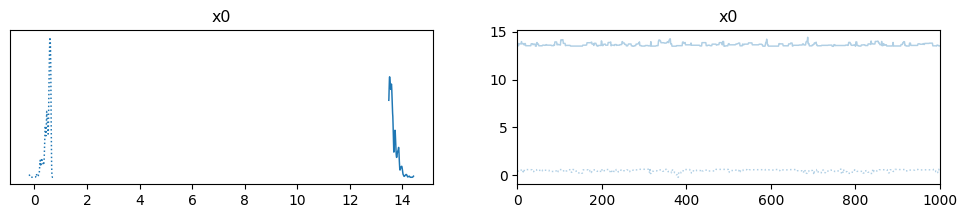

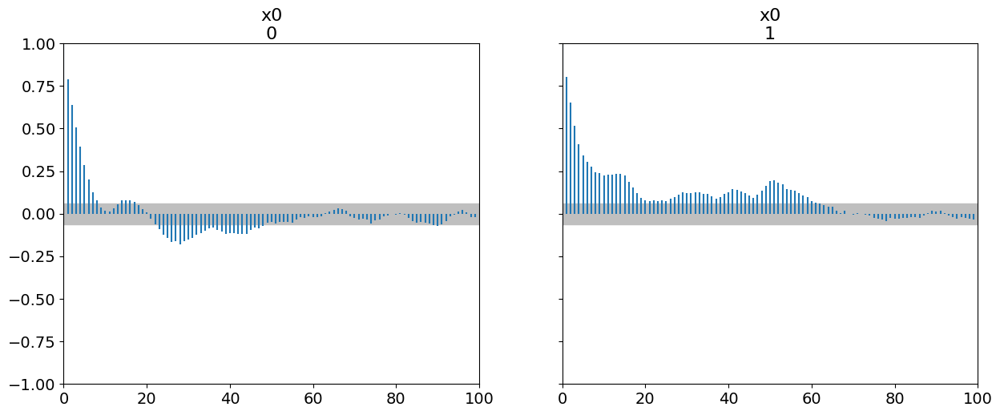

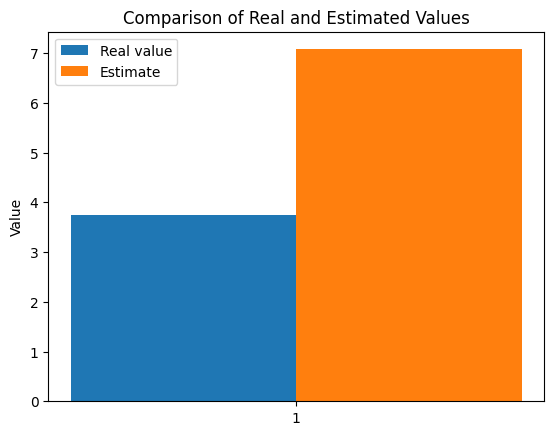

The function param_inverse took 248.785061 seconds.
Sampling chain 1/2


Running chain, α = 0.34: 100%|██████████| 3000/3000 [02:01<00:00, 24.79it/s]


Sampling chain 2/2


Running chain, α = 0.28: 100%|██████████| 3000/3000 [02:03<00:00, 24.23it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [13.616]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  13.616  0.129  13.482    13.84      0.008    0.006     177.0     141.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [9.866]



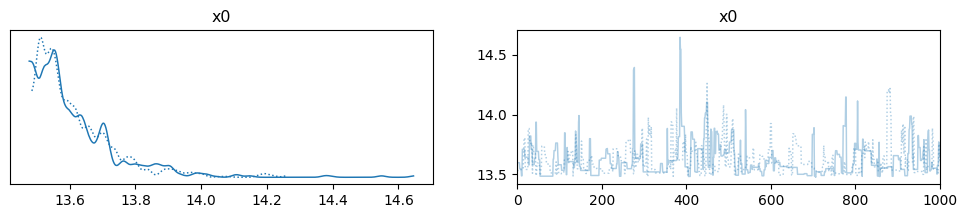

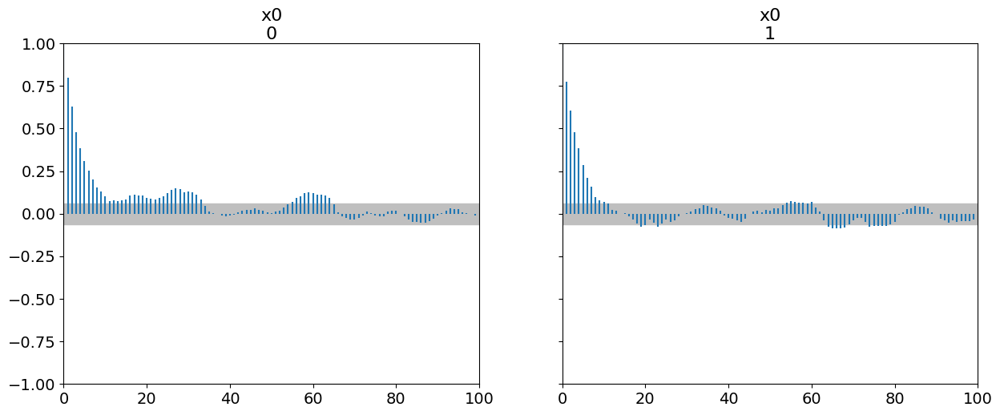

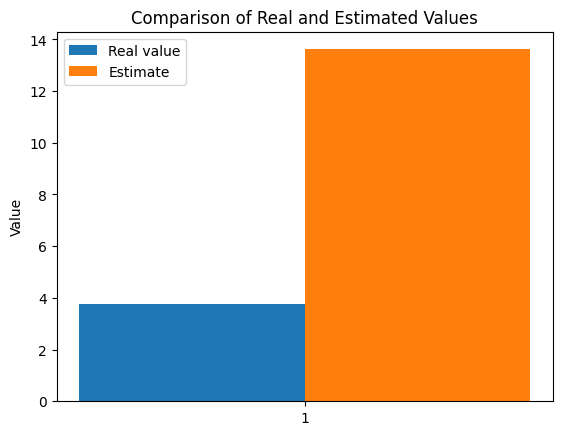

The function param_inverse took 245.626583 seconds.
Sampling chain 1/2


Running chain, α = 0.30: 100%|██████████| 3000/3000 [02:04<00:00, 24.01it/s]


Sampling chain 2/2


Running chain, α = 0.15: 100%|██████████| 3000/3000 [02:04<00:00, 24.04it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [13.634]
      mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  13.634  0.15  13.484   13.913      0.012    0.008     136.0     260.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [9.884]



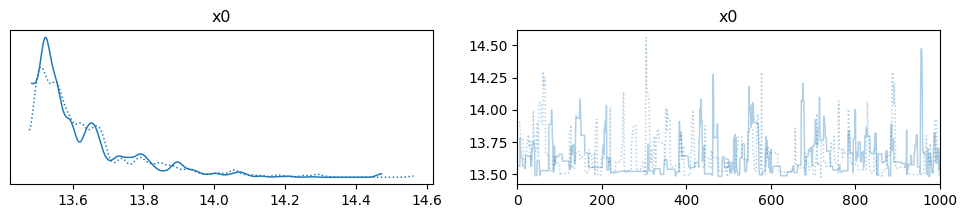

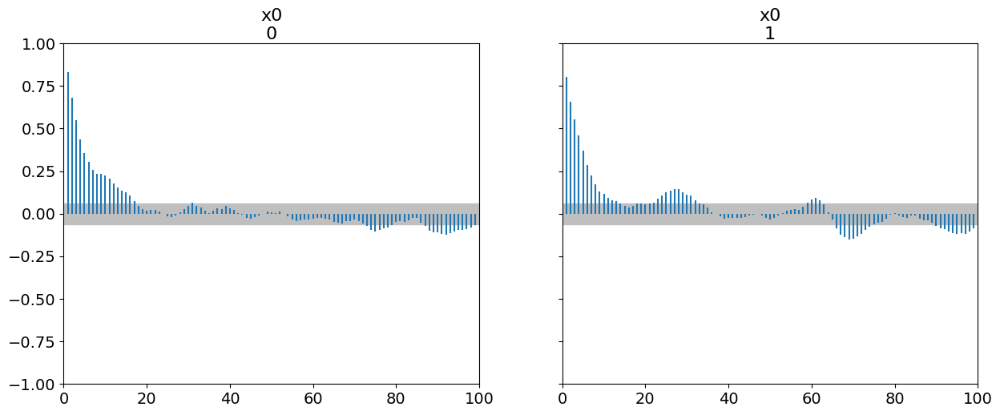

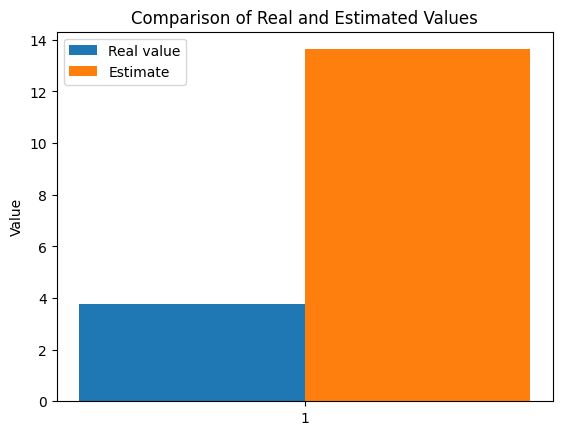

The function param_inverse took 250.710426 seconds.
Sampling chain 1/2


Running chain, α = 0.19: 100%|██████████| 3000/3000 [02:05<00:00, 23.98it/s]


Sampling chain 2/2


Running chain, α = 0.14: 100%|██████████| 3000/3000 [02:04<00:00, 24.03it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [15.123]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  15.123  0.003  15.117   15.128        0.0      0.0     216.0     213.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [11.373]



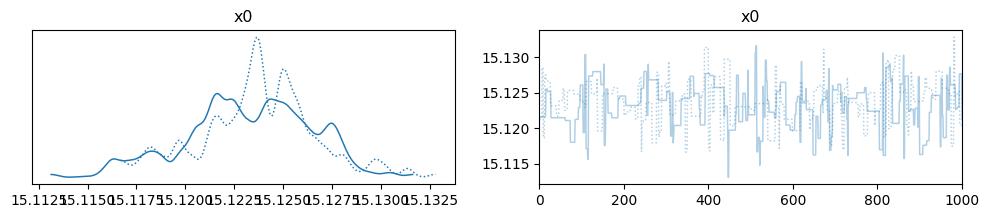

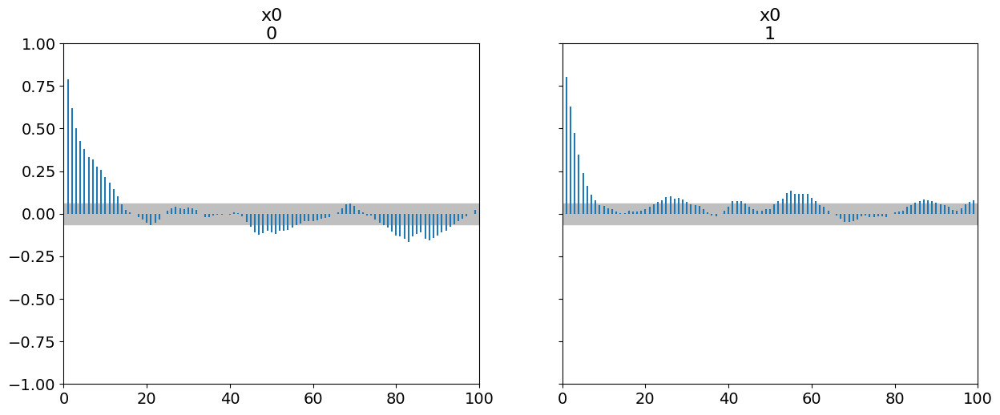

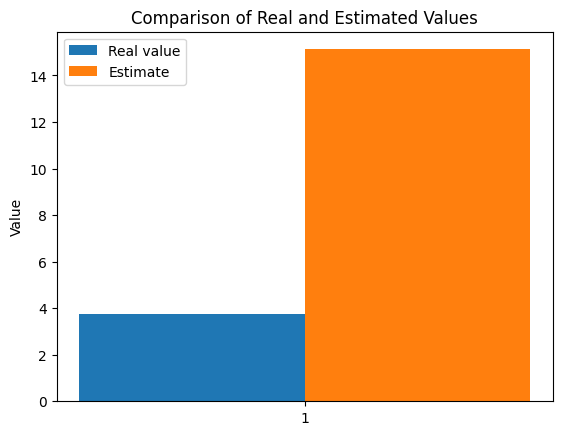

The function param_inverse took 250.820938 seconds.
Sampling chain 1/2


Running chain, α = 0.02: 100%|██████████| 3000/3000 [02:04<00:00, 24.03it/s]


Sampling chain 2/2


Running chain, α = 0.16: 100%|██████████| 3000/3000 [02:05<00:00, 24.00it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [15.123]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  15.123  0.003  15.116   15.128        0.0      0.0     118.0      75.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [11.373]



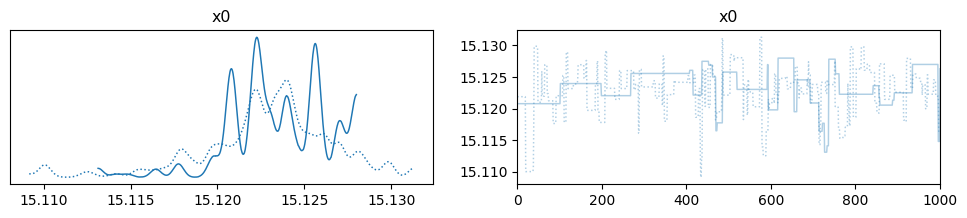

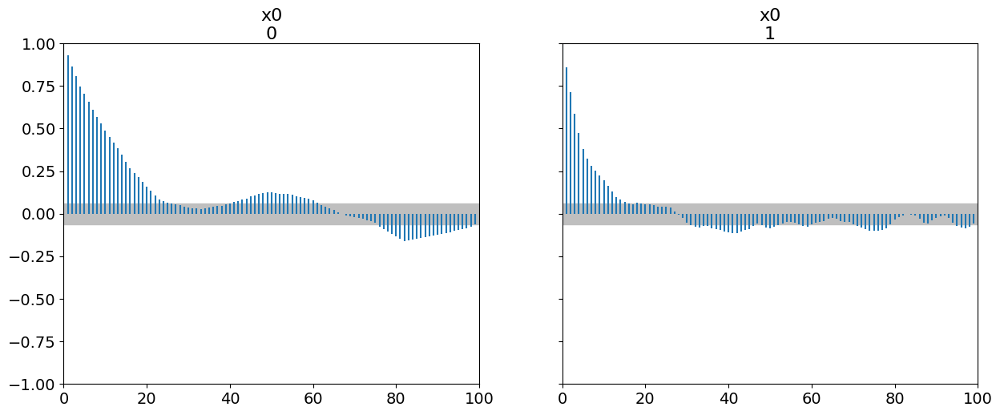

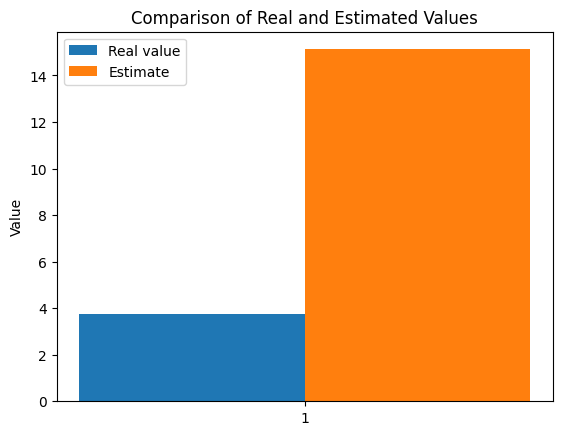

The function param_inverse took 250.625802 seconds.
Sampling chain 1/2


Running chain, α = 0.20: 100%|██████████| 3000/3000 [02:05<00:00, 23.91it/s]


Sampling chain 2/2


Running chain, α = 0.25: 100%|██████████| 3000/3000 [02:04<00:00, 24.05it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [14.393]
      mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  14.393  0.739  13.511   15.128      0.516    0.435       3.0     106.0   

    r_hat  
x0   1.84  
Autocorrelation...
The difference between estimated values [10.643]



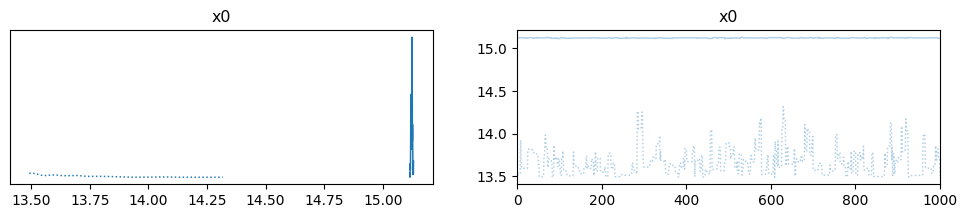

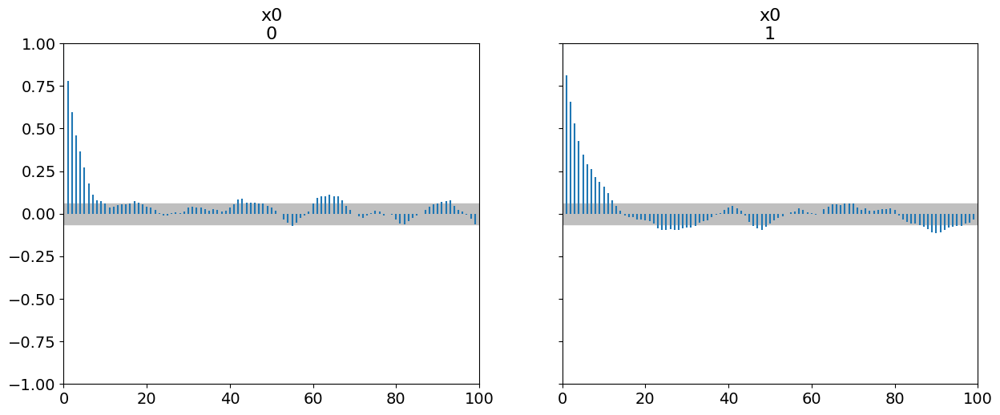

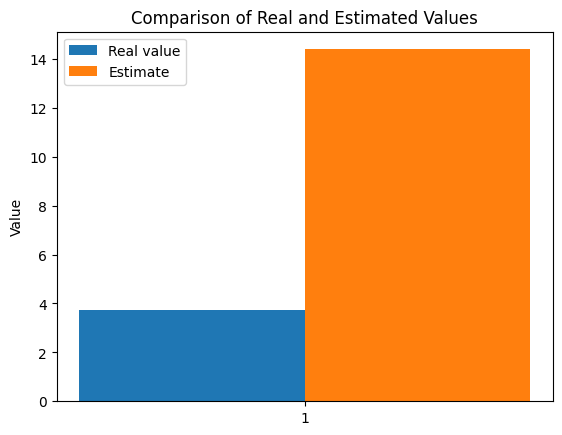

The function param_inverse took 257.464968 seconds.
The best estimate is given by: sigma_noise=0.1, number of data=30, sigma=4.0, rwmh_scaling=2.0
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 3000/3000 [04:11<00:00, 11.91it/s]


Sampling chain 2/2


Running chain, α = 0.24: 100%|██████████| 3000/3000 [04:12<00:00, 11.89it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.326]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.326  0.275   2.836    3.821      0.016    0.011     298.0     272.0   

    r_hat  
x0   1.02  
Autocorrelation...
The difference between estimated values [0.424]



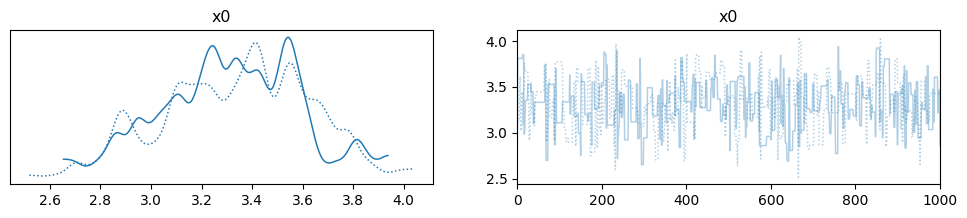

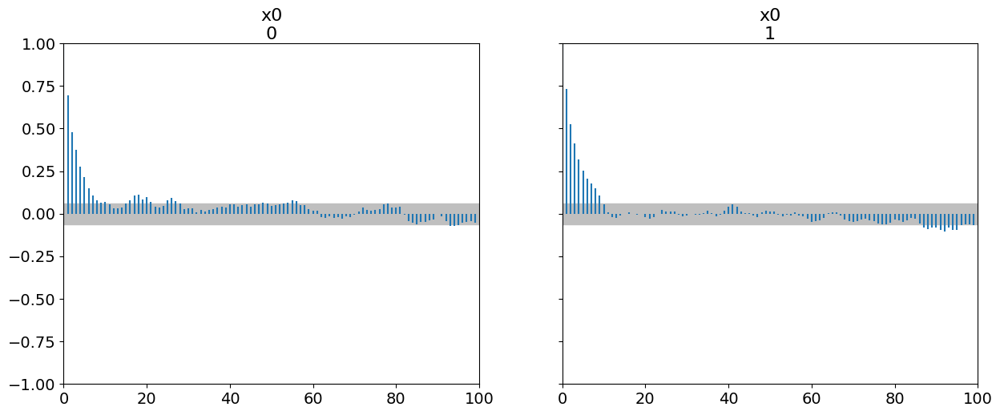

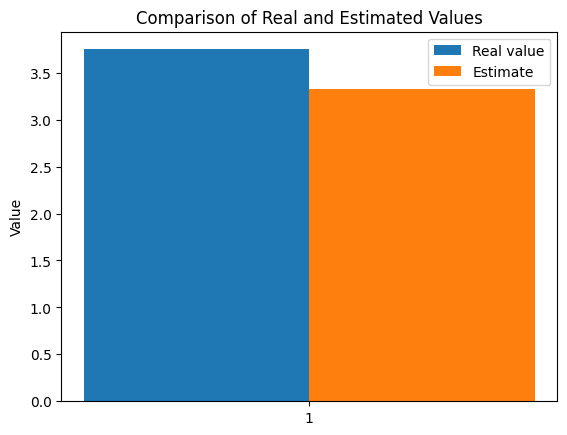

The function param_inverse took 505.666924 seconds.
Sampling chain 1/2


Running chain, α = 0.28: 100%|██████████| 3000/3000 [04:12<00:00, 11.90it/s]


Sampling chain 2/2


Running chain, α = 0.16: 100%|██████████| 3000/3000 [04:12<00:00, 11.88it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.322]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.322  0.284   2.793    3.777      0.018    0.013     253.0     197.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [0.428]



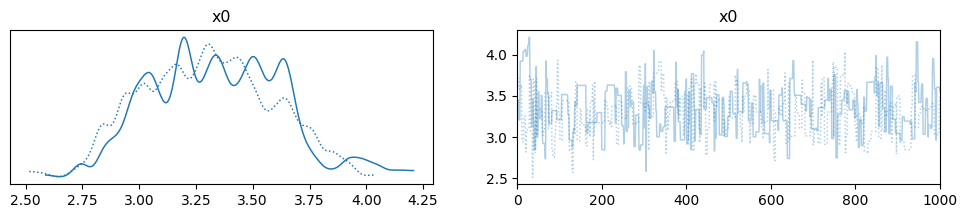

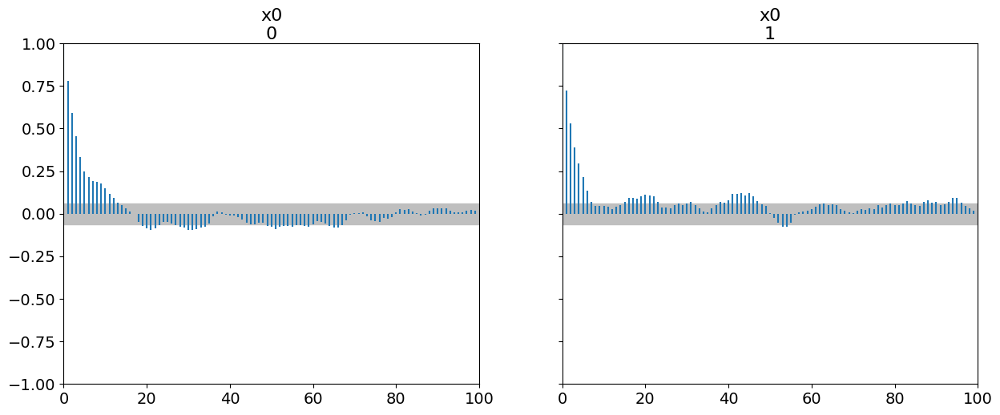

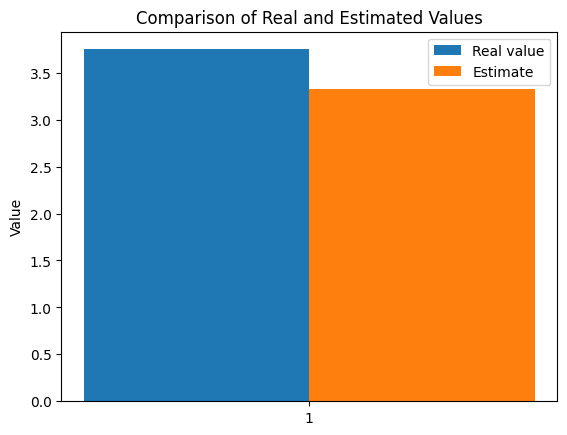

The function param_inverse took 505.855203 seconds.
Sampling chain 1/2


Running chain, α = 0.23: 100%|██████████| 3000/3000 [04:13<00:00, 11.83it/s]


Sampling chain 2/2


Running chain, α = 0.22: 100%|██████████| 3000/3000 [04:12<00:00, 11.89it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.318]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.318  0.261   2.798    3.801      0.015     0.01     325.0     340.0   

    r_hat  
x0    1.0  
Autocorrelation...
The difference between estimated values [0.432]



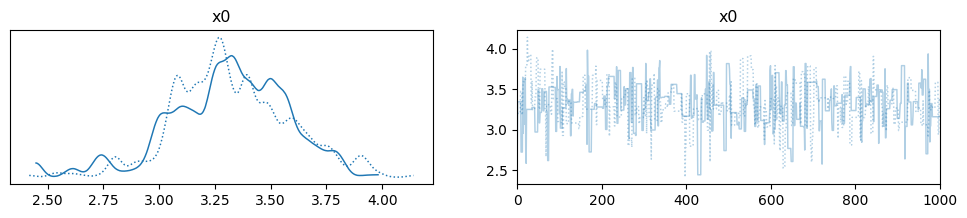

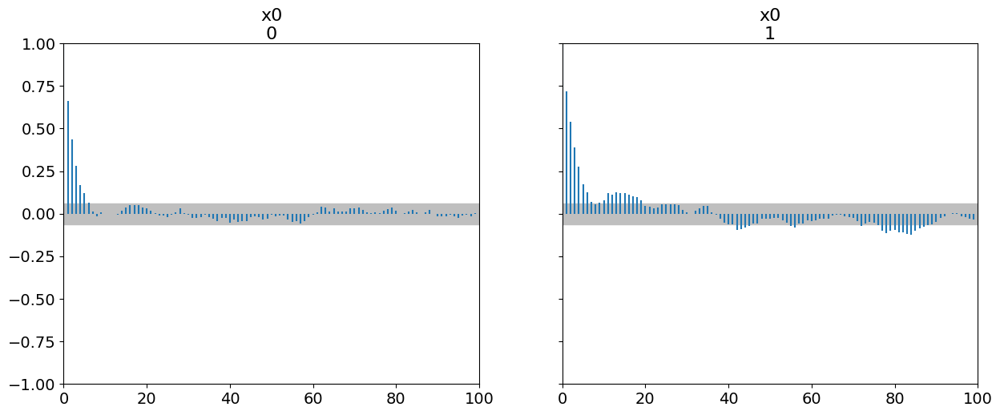

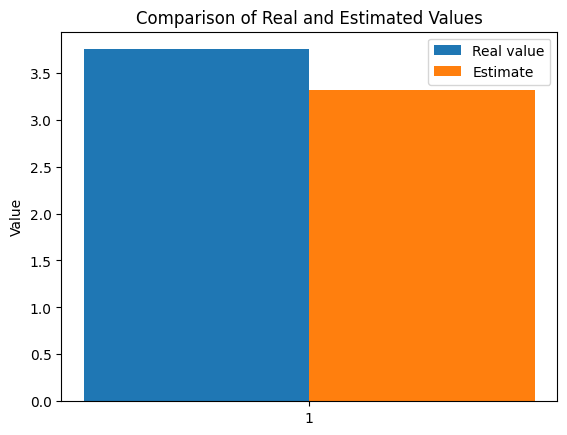

The function param_inverse took 507.211136 seconds.
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 3000/3000 [04:12<00:00, 11.87it/s]


Sampling chain 2/2


Running chain, α = 0.18: 100%|██████████| 3000/3000 [04:12<00:00, 11.86it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.09]
    mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.09  0.145    2.78     3.32      0.009    0.007     231.0     237.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [0.66]



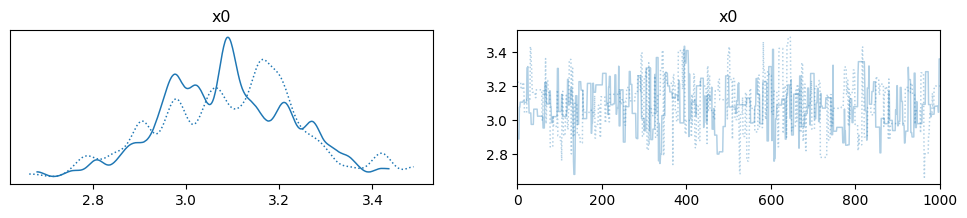

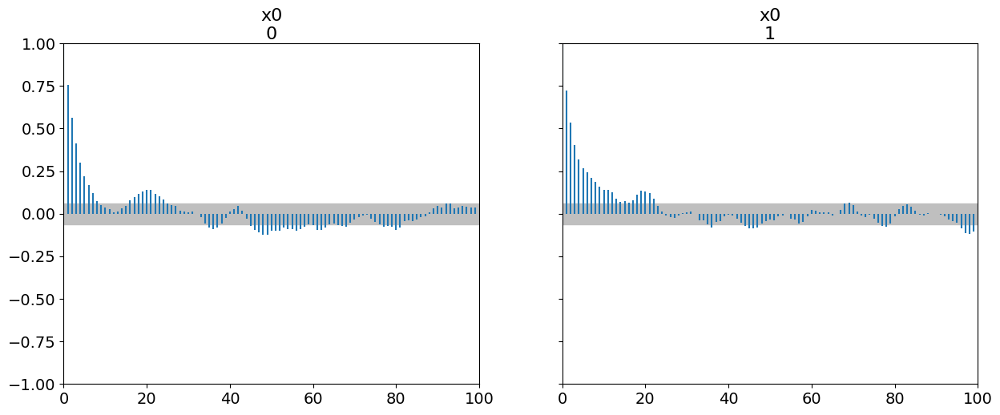

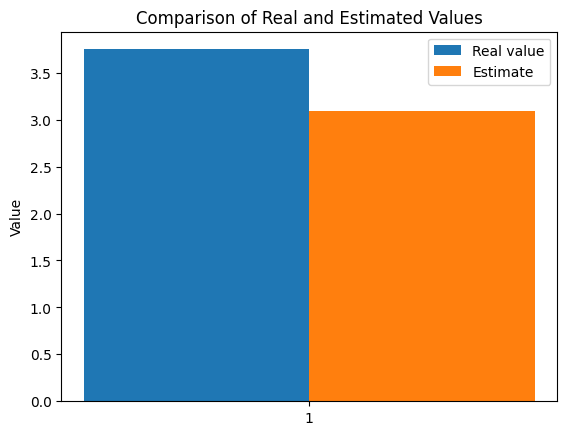

The function param_inverse took 514.788528 seconds.
Sampling chain 1/2


Running chain, α = 0.29: 100%|██████████| 3000/3000 [04:17<00:00, 11.63it/s]


Sampling chain 2/2


Running chain, α = 0.27: 100%|██████████| 3000/3000 [04:15<00:00, 11.74it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.099]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.099  0.141   2.855    3.359      0.008    0.006     321.0     318.0   

    r_hat  
x0    1.0  
Autocorrelation...
The difference between estimated values [0.651]



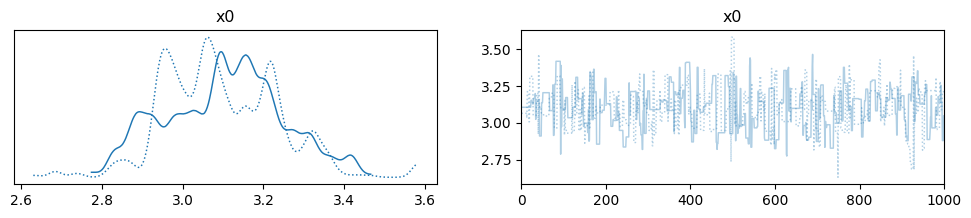

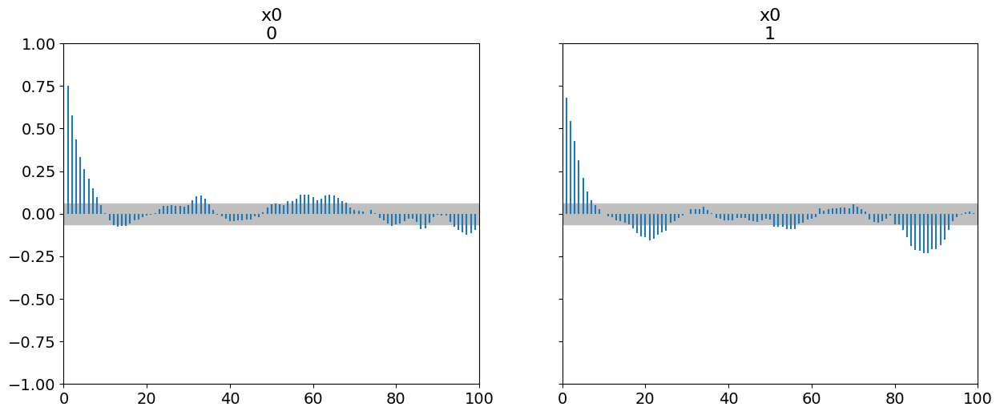

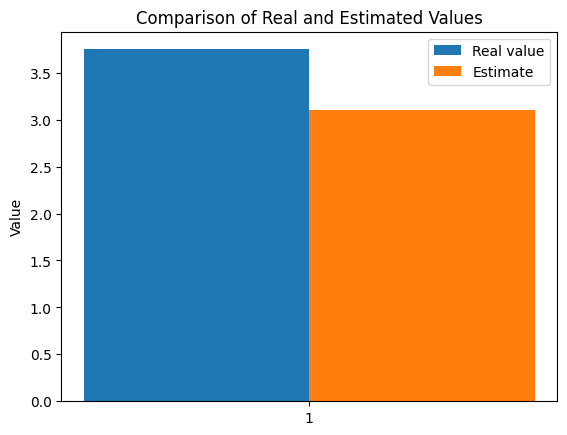

The function param_inverse took 514.716852 seconds.
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 3000/3000 [04:13<00:00, 11.85it/s]


Sampling chain 2/2


Running chain, α = 0.23: 100%|██████████| 3000/3000 [04:13<00:00, 11.82it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.096]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.096  0.135   2.886    3.386      0.007    0.005     363.0     235.0   

    r_hat  
x0   1.02  
Autocorrelation...
The difference between estimated values [0.654]



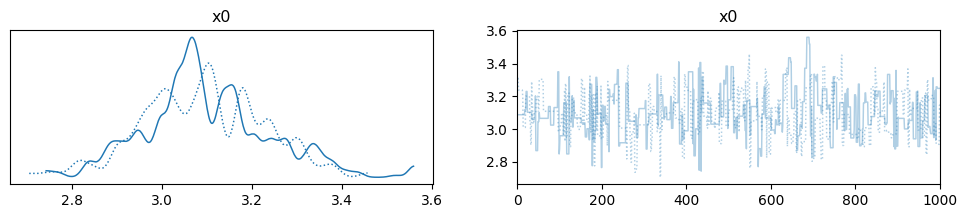

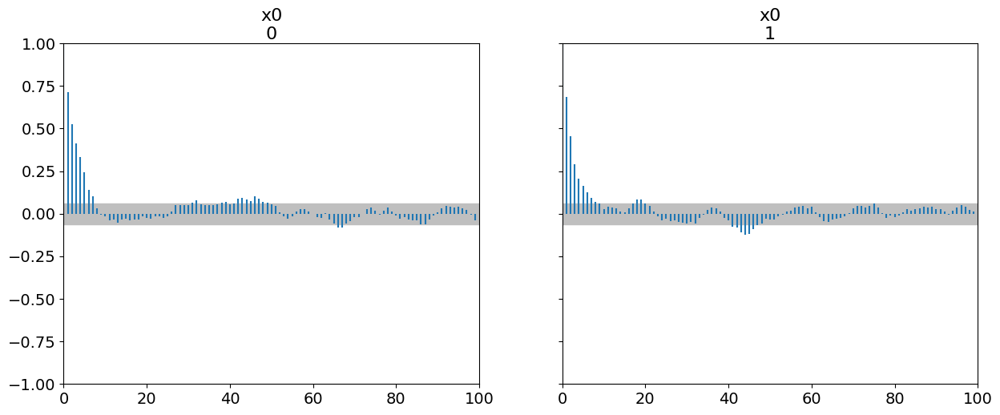

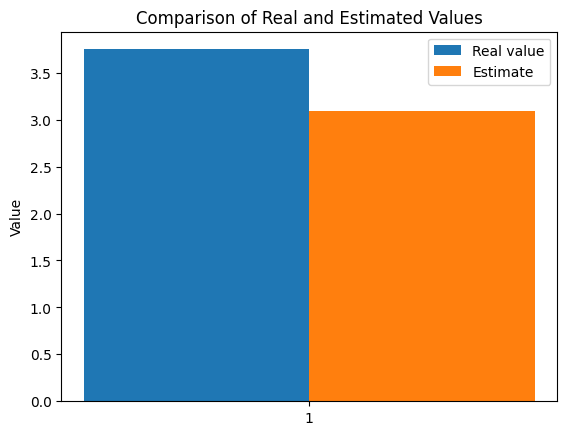

The function param_inverse took 521.076916 seconds.
Sampling chain 1/2


Running chain, α = 0.28: 100%|██████████| 3000/3000 [04:00<00:00, 12.47it/s]


Sampling chain 2/2


Running chain, α = 0.31: 100%|██████████| 3000/3000 [04:00<00:00, 12.47it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.318]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.318  0.322   2.703    3.868      0.019    0.014     284.0     367.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [0.432]



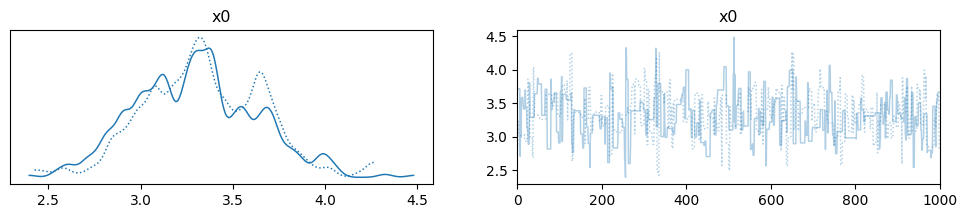

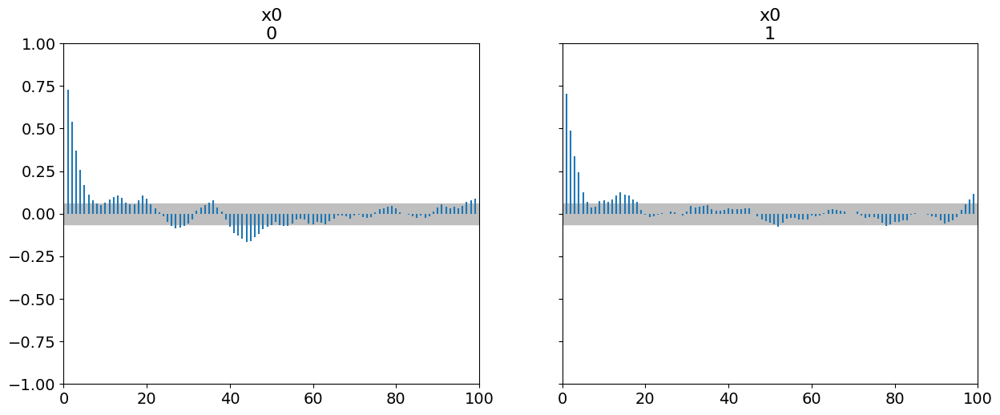

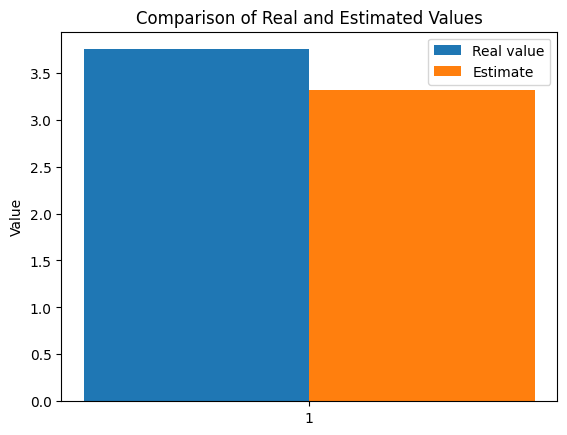

The function param_inverse took 490.164028 seconds.
Sampling chain 1/2


Running chain, α = 0.25: 100%|██████████| 3000/3000 [04:00<00:00, 12.48it/s]


Sampling chain 2/2


Running chain, α = 0.19: 100%|██████████| 3000/3000 [04:01<00:00, 12.41it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.321]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.321  0.329   2.697    3.925      0.018    0.013     332.0     267.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [0.429]



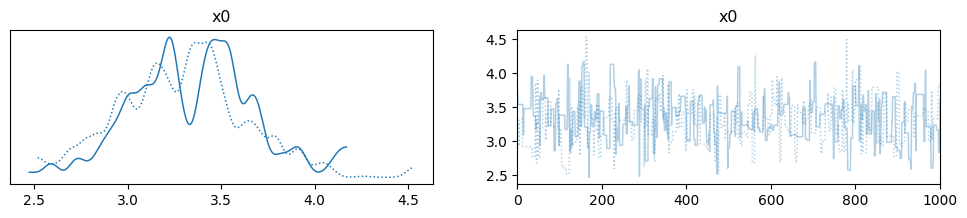

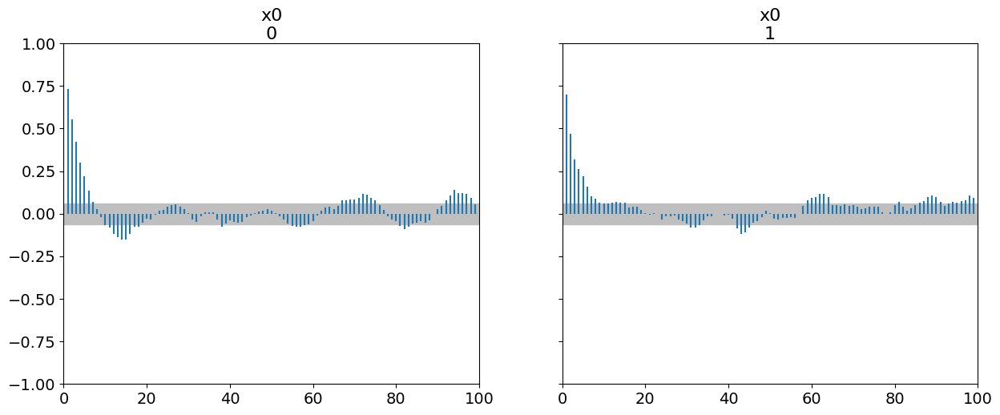

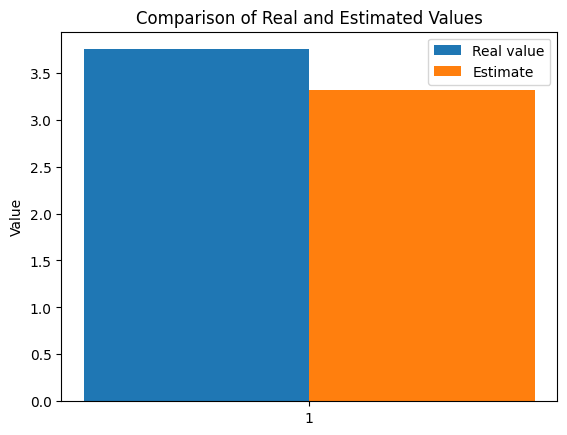

The function param_inverse took 483.676939 seconds.
Sampling chain 1/2


Running chain, α = 0.28: 100%|██████████| 3000/3000 [04:00<00:00, 12.45it/s]


Sampling chain 2/2


Running chain, α = 0.21: 100%|██████████| 3000/3000 [04:01<00:00, 12.42it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.358]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.358  0.323   2.822    3.982       0.02    0.014     271.0     207.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [0.392]



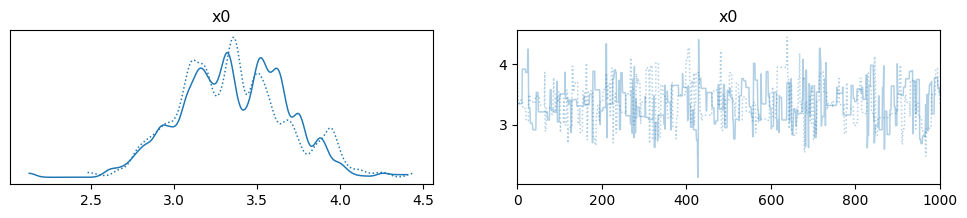

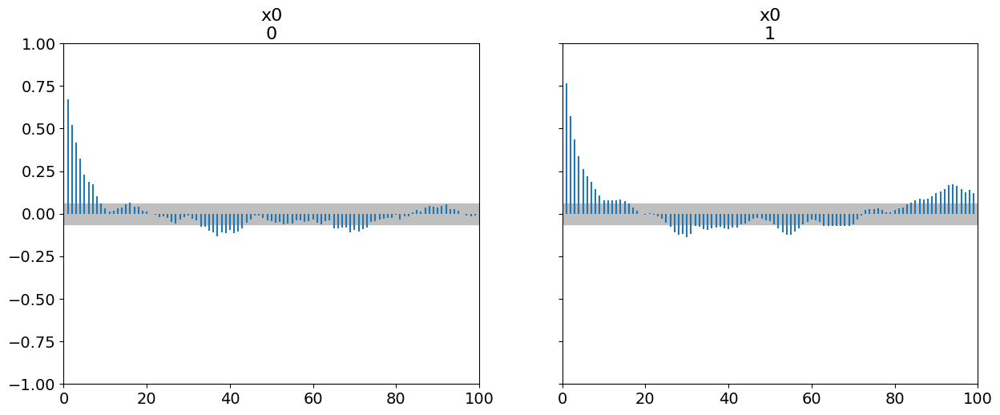

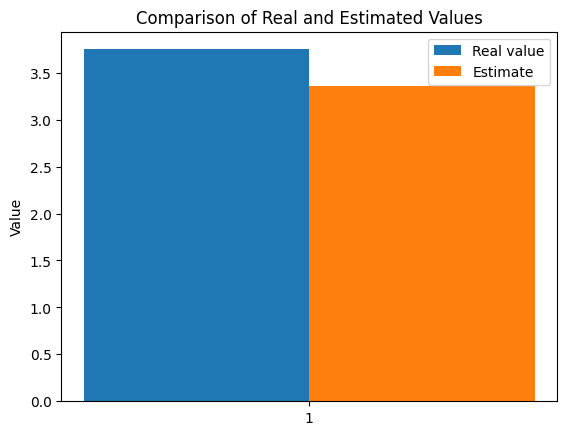

The function param_inverse took 490.760543 seconds.
Sampling chain 1/2


Running chain, α = 0.17: 100%|██████████| 3000/3000 [04:03<00:00, 12.34it/s]


Sampling chain 2/2


Running chain, α = 0.21: 100%|██████████| 3000/3000 [04:01<00:00, 12.41it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.977]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.977  0.175   2.636    3.274       0.01    0.007     301.0     342.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [0.773]



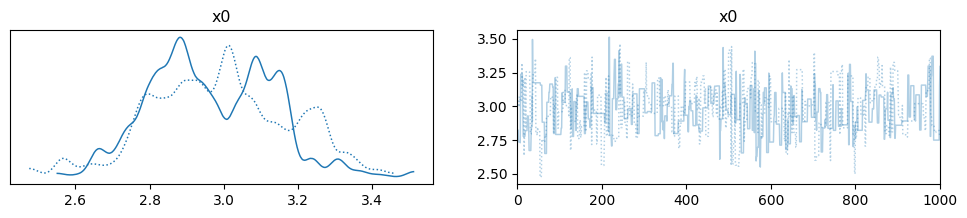

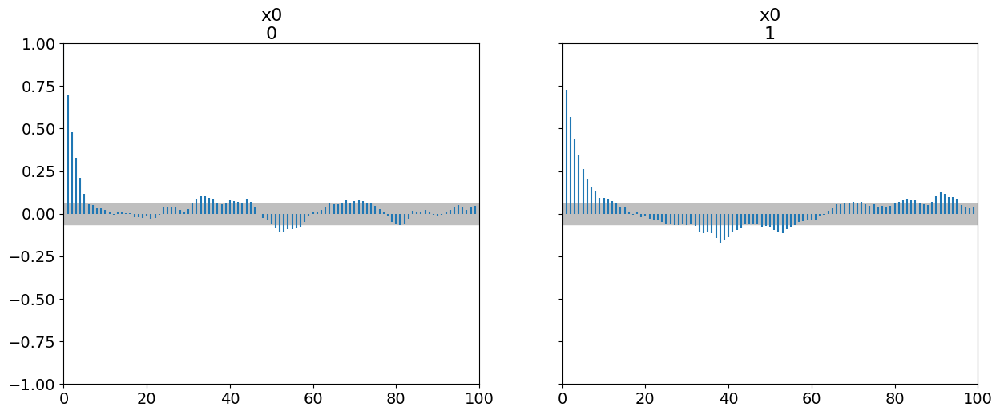

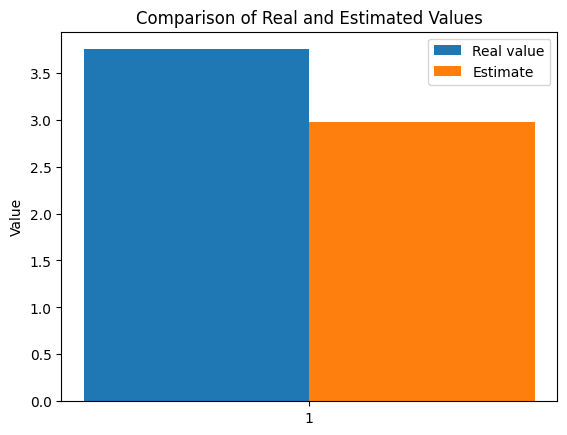

The function param_inverse took 494.013705 seconds.
Sampling chain 1/2


Running chain, α = 0.13: 100%|██████████| 3000/3000 [04:01<00:00, 12.40it/s]


Sampling chain 2/2


Running chain, α = 0.22: 100%|██████████| 3000/3000 [04:05<00:00, 12.20it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [2.988]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  2.988  0.165   2.664    3.292       0.01    0.007     256.0     330.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [0.762]



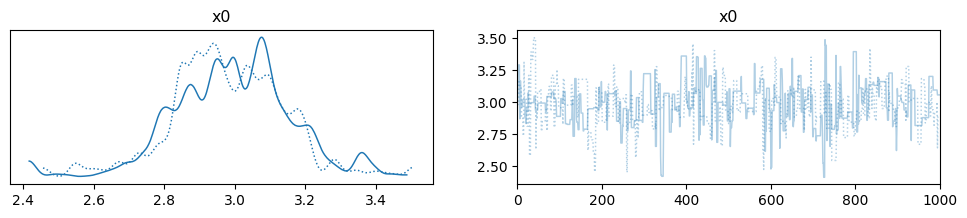

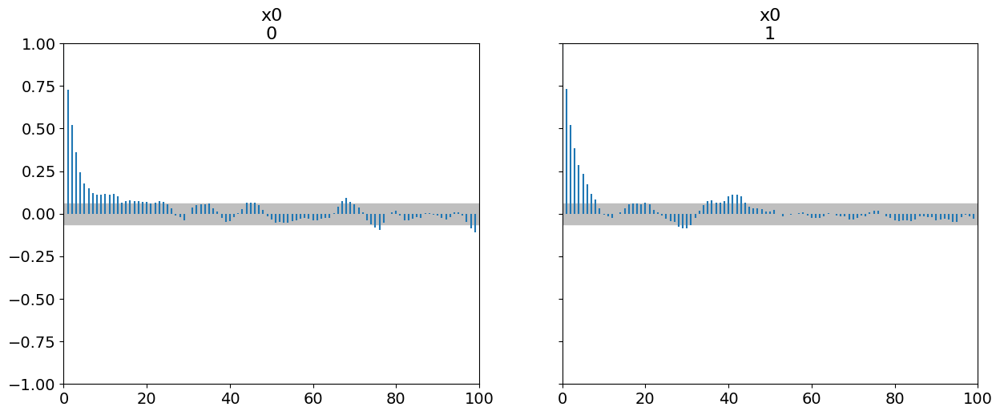

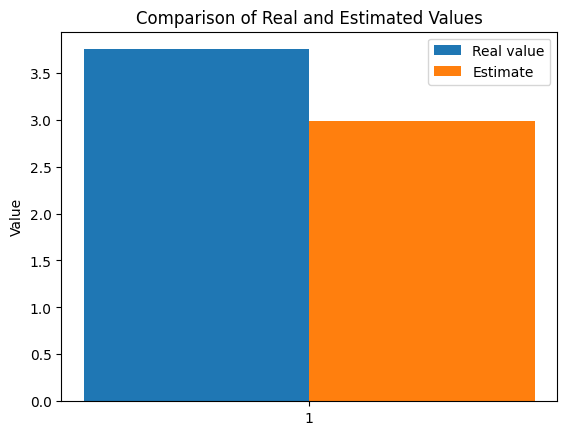

The function param_inverse took 496.168043 seconds.
Sampling chain 1/2


Running chain, α = 0.22: 100%|██████████| 3000/3000 [04:06<00:00, 12.18it/s]


Sampling chain 2/2


Running chain, α = 0.29: 100%|██████████| 3000/3000 [04:05<00:00, 12.24it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.014]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.014  0.179    2.72    3.375       0.01    0.007     317.0     391.0   

    r_hat  
x0    1.0  
Autocorrelation...
The difference between estimated values [0.736]



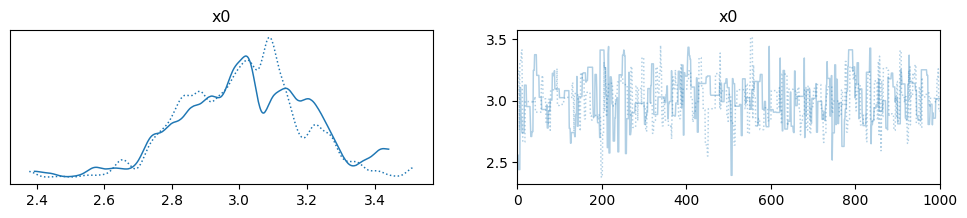

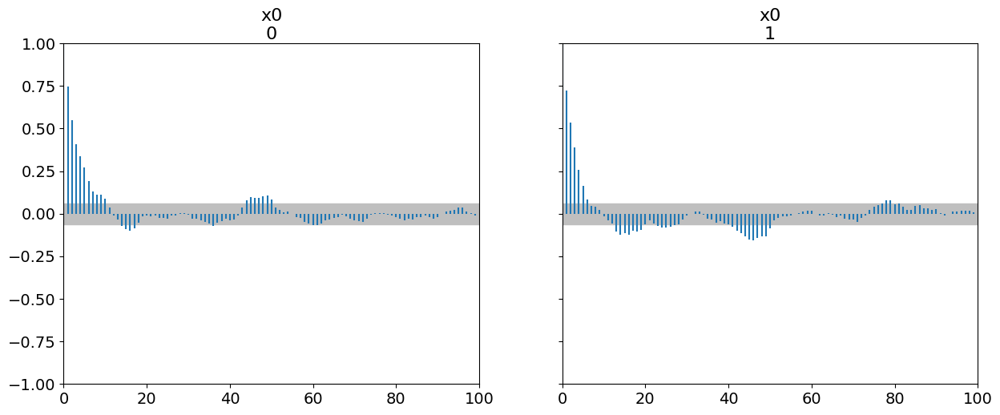

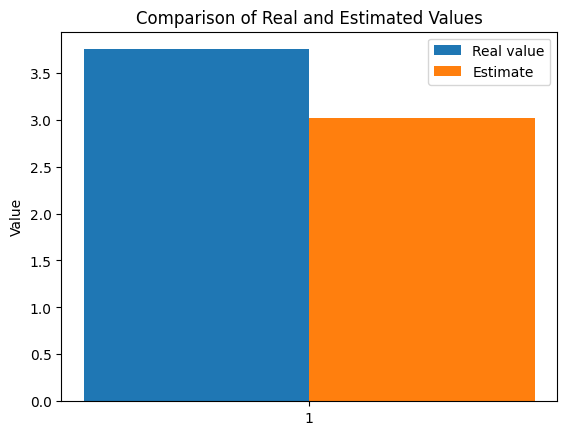

The function param_inverse took 492.653733 seconds.
Sampling chain 1/2


Running chain, α = 0.26: 100%|██████████| 3000/3000 [04:19<00:00, 11.54it/s]


Sampling chain 2/2


Running chain, α = 0.28: 100%|██████████| 3000/3000 [04:18<00:00, 11.60it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.295]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.295  0.288   2.814    3.866      0.016    0.011     324.0     231.0   

    r_hat  
x0   1.01  
Autocorrelation...
The difference between estimated values [0.455]



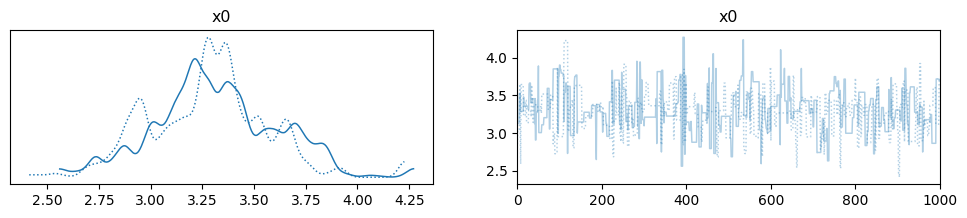

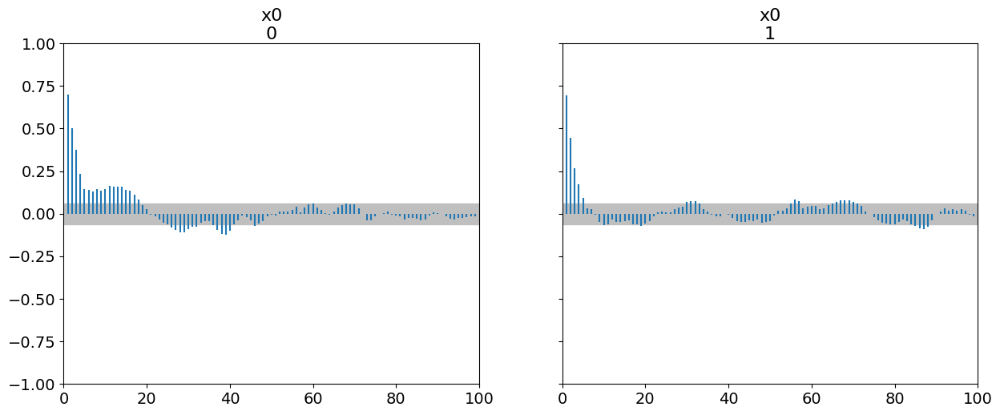

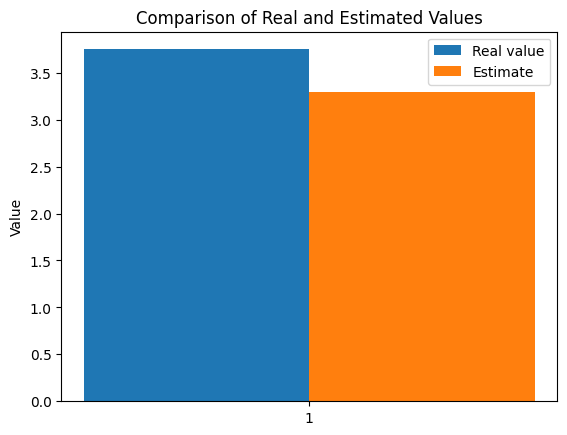

The function param_inverse took 532.183037 seconds.
Sampling chain 1/2


Running chain, α = 0.30: 100%|██████████| 3000/3000 [06:39<00:00,  7.51it/s]


Sampling chain 2/2


Running chain, α = 0.26: 100%|██████████| 3000/3000 [07:00<00:00,  7.14it/s]
c:\Users\Giacomo\miniconda3\Lib\site-packages\arviz\data\inference_data.py:157: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [3.31]
    mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  3.31  0.258   2.838    3.773      0.013    0.009     381.0     354.0   

    r_hat  
x0    1.0  
Autocorrelation...
The difference between estimated values [0.44]



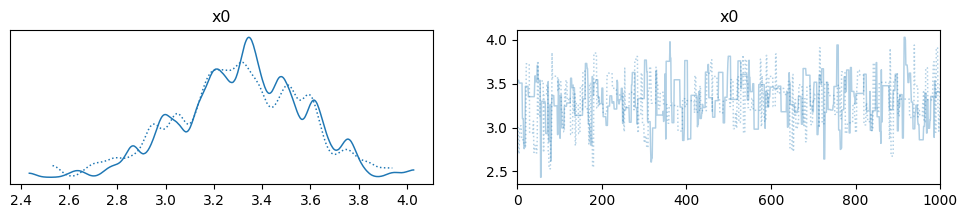

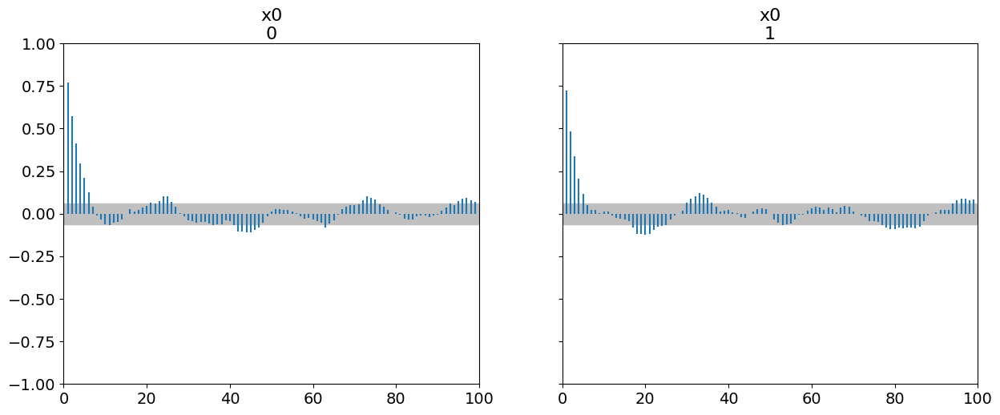

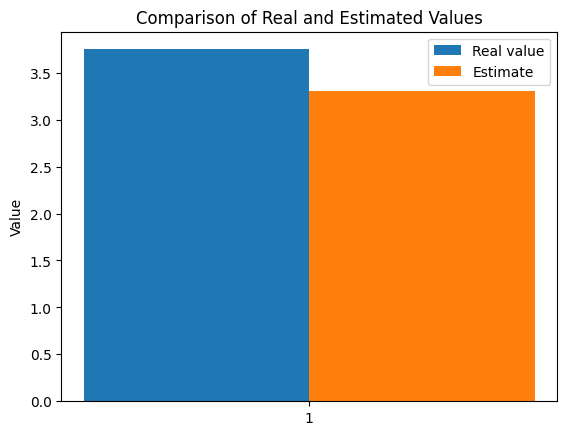

The function param_inverse took 821.937098 seconds.
Sampling chain 1/2


Running chain, α = 0.27: 100%|██████████| 3000/3000 [10:59<00:00,  4.55it/s]


Sampling chain 2/2


Running chain, α = 0.18:  24%|██▎       | 709/3000 [08:12<26:32,  1.44it/s]  


KeyboardInterrupt: 

In [7]:
mean_prior = np.array([7.])
cov_prior = np.diag([1.])

sigma_noise = [0.05,0.1]
n_data = [50,30]
parameters = np.array([3.75])
sigma = np.array([ 4.,2.])
rwmh_scaling = np.array([ 2.,0.5,1.])
rwmh_cov = np.eye(1)
rwmh_adaptive = True
iterations = 3000
burnin = 2000
n_chains = 2
algo = "MH"


# ricorda che i primi due non vanno bene in qualunque caso
estimateLF, errorLF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelLF,algo)
estimateHF, errorHF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelHF,algo)

estimateMF, errorMF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, final_model,algo)




In [ ]:
mean_prior = np.array([7.])
cov_prior = np.diag([1.])

sigma_noise = [0.05,0.1]
n_data = [50,30]
parameters = np.array([15.])
sigma = np.array([ 4.,2.])
rwmh_scaling = np.array([ 2.,0.5,1.])
rwmh_cov = np.eye(1)
rwmh_adaptive = True
iterations = 30
burnin = 20
n_chains = 2
algo = "MH"


# ricorda che i primi due non vanno bene in qualunque caso
estimateLF, errorLF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelLF,algo)
estimateHF, errorHF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelHF,algo)

estimateMF, errorMF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, final_model,algo)




[I 2024-08-02 23:52:27,557] A new study created in memory with name: no-name-ec3de525-31a3-4bbf-a46c-e03e42a78054


1/1 [==============================] - 0s 76ms/step


[I 2024-08-03 00:28:05,343] Trial 1 finished with value: 0.09016754981865086 and parameters: {'nodes': 33, 'l2weight': 0.0001704952095281121, 'lr': 0.004058309500187053, 'kernel_init': 'glorot_uniform', 'opt': 'Adamax'}. Best is trial 1 with value: 0.09016754981865086.


1/1 [==============================] - 0s 151ms/step


[I 2024-08-03 00:28:30,763] Trial 0 finished with value: 0.04409986036200318 and parameters: {'nodes': 4, 'l2weight': 0.002518321527372855, 'lr': 0.00017109891226336149, 'kernel_init': 'glorot_uniform', 'opt': 'Adam'}. Best is trial 0 with value: 0.04409986036200318.


1/1 [==============================] - 0s 84ms/step


[I 2024-08-03 00:28:49,758] Trial 2 finished with value: 0.027160092927804264 and parameters: {'nodes': 19, 'l2weight': 0.04316513946325754, 'lr': 0.00015913608450131904, 'kernel_init': 'glorot_uniform', 'opt': 'Adamax'}. Best is trial 2 with value: 0.027160092927804264.


1/1 [==============================] - 0s 52ms/step


[I 2024-08-03 00:28:55,137] Trial 3 finished with value: 0.001097626804716568 and parameters: {'nodes': 28, 'l2weight': 0.009286897230443712, 'lr': 0.002385562193065218, 'kernel_init': 'glorot_uniform', 'opt': 'Adam'}. Best is trial 3 with value: 0.001097626804716568.


1/1 [==============================] - 0s 34ms/step


[I 2024-08-03 00:39:19,886] Trial 4 finished with value: 0.4599389153137189 and parameters: {'nodes': 9, 'l2weight': 0.00011106070021031, 'lr': 0.0002497112206649614, 'kernel_init': 'uniform', 'opt': 'Adam'}. Best is trial 3 with value: 0.001097626804716568.


The function training took 37.612999 seconds.


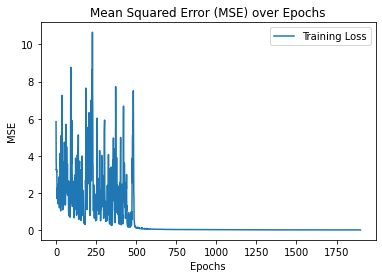

[I 2024-08-03 00:39:58,250] A new study created in memory with name: no-name-57815202-8e47-45d6-bb38-6f8625773144


1/1 [==============================] - 0s 58ms/step


[I 2024-08-03 01:12:12,272] Trial 2 finished with value: 0.15241791639647567 and parameters: {'nodes': 7, 'l2weight': 0.001924036762873382, 'lr': 0.001896724821867926, 'kernel_init': 'glorot_uniform', 'opt': 'Adamax'}. Best is trial 2 with value: 0.15241791639647567.


1/1 [==============================] - 0s 96ms/step


[I 2024-08-03 01:12:41,344] Trial 0 finished with value: 0.7745704933892167 and parameters: {'nodes': 35, 'l2weight': 0.00030384026409628005, 'lr': 0.06167429614010436, 'kernel_init': 'uniform', 'opt': 'Adam'}. Best is trial 2 with value: 0.15241791639647567.


1/1 [==============================] - 0s 77ms/step


[I 2024-08-03 01:12:45,137] Trial 1 finished with value: 0.6145626946340328 and parameters: {'nodes': 4, 'l2weight': 0.004265196994081049, 'lr': 0.08414880466241581, 'kernel_init': 'glorot_uniform', 'opt': 'Adam'}. Best is trial 2 with value: 0.15241791639647567.


1/1 [==============================] - 0s 86ms/step


[I 2024-08-03 01:12:48,908] Trial 3 finished with value: 0.3665896285183362 and parameters: {'nodes': 60, 'l2weight': 0.02001604271295891, 'lr': 0.00015604850251719362, 'kernel_init': 'glorot_uniform', 'opt': 'Adamax'}. Best is trial 2 with value: 0.15241791639647567.


1/1 [==============================] - 0s 32ms/step


[I 2024-08-03 01:21:03,333] Trial 4 finished with value: 0.2748817901113084 and parameters: {'nodes': 17, 'l2weight': 0.002804553064149816, 'lr': 0.028734970238830548, 'kernel_init': 'uniform', 'opt': 'Adam'}. Best is trial 2 with value: 0.15241791639647567.


The function training took 75.823004 seconds.


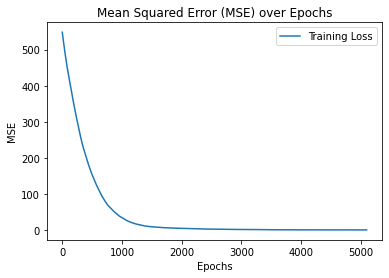

Test MSE: 1.9186557030526659
R^2: 0.9954682702759766


Text(0.5, 1.0, 'High fidelity model')

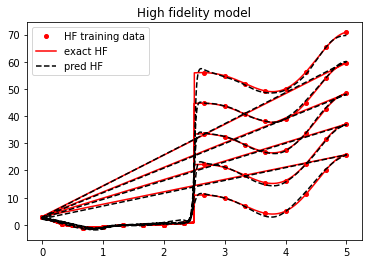

In [4]:
### 2 steps NEURAL NETWORK ###
# collection of parameters
# bestLF_params = {
#     'lr': 0.0255, 
#     'kernel_init': 'glorot_uniform', 
#     'opt': 'Adam'
# }
bestLF_params ={'nodes': 9, 'l2weight': 0.00011106070021031, 'lr': 0.0002497112206649614, 'kernel_init': 'uniform', 'opt': 'Adam'}



# best_params = {
#     'kernel_init': 'uniform', 
#     'l2weight': 0.00010018625799978436, 
#     'lr': 0.07093837044166487, 
#     'nodes': 74.0, 
#     'opt': 'Adamax'
# }
best_params= {'nodes': 17, 'l2weight': 0.002804553064149816, 'lr': 0.028734970238830548, 'kernel_init': 'uniform', 'opt': 'Adam'
params = [bestLF_params, best_params]

N = [data["NepoLF"], data["NepoHF"]]
n = [data["Nlf"], data["Nhf"]]

# names of the networks 
names = ['LF', 'HF']

# collection of the parameters
definition_2steps = {
    "network_type": "2step",
    "names": names,
    "params": params,
    "data_train": [data["xlf"], data["xhf"]],
    "output_train": [data["Ylf"], data["Yhf"]],
    "N": N,
    "n": n,
    "train": True,
    "do_HPO": True,
    "verbose": False
}

# creation of 2 steps model 
final_model = NetworkFactory.build_network(**definition_2steps)

if final_model == -1:
    raise ValueError("Failed to build the network. Check the network type and parameters.")

y_test=final_model.prediction(data["datatest"])

(mse_MF,R_MF)=final_model.performance(data["datatest"],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]))

    #(mse_MF,R_MF)=final_model.performance(data["x_test"].reshape(-1,1),data["high_fid"](data["x_test"]))

### PLOT of predicted models ###
#LF single-fidelity



plt.figure()
plt.plot(data["xhf"][:,0],data["Yhf"],'ro', label = 'HF training data', markersize = 4)
plt.plot(data["datatest"][:,0],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]),'r', label = 'exact HF') 
plt.plot(data["datatest"][:,0],y_test,'k--', label = 'pred HF')
plt.legend()
plt.title('High fidelity model')


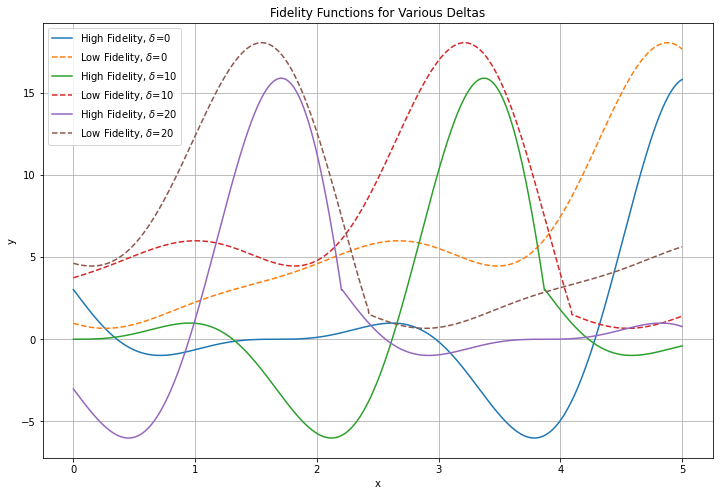

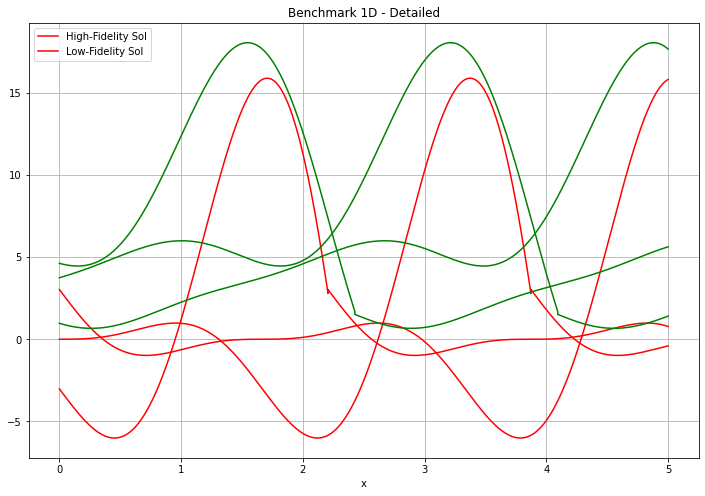

In [5]:
example = "Basic"
fidelity_func = FidelityFunctionModified(example)
fidelity_func.plot_functions()
fidelity_func.plot_detailed_functions()

In [6]:
data=fidelity_func.get_parameters(example)

[I 2024-08-03 01:22:41,290] A new study created in memory with name: no-name-1a2a713b-de75-4f21-9195-6e9f7e49bc47


1/1 [==============================] - 0s 63ms/step


[I 2024-08-03 03:02:35,527] Trial 2 finished with value: 1.085542018733205 and parameters: {'nodes': 7, 'l2weight': 0.004500352769557396, 'lr': 0.06251248411859454, 'kernel_init': 'uniform', 'opt': 'Adamax'}. Best is trial 2 with value: 1.085542018733205.


1/1 [==============================] - 0s 122ms/step


[I 2024-08-03 03:02:40,635] Trial 3 finished with value: 0.4710291953265708 and parameters: {'nodes': 39, 'l2weight': 0.07517261560734735, 'lr': 0.0001231666656055428, 'kernel_init': 'uniform', 'opt': 'Adamax'}. Best is trial 3 with value: 0.4710291953265708.


1/1 [==============================] - 0s 105ms/step


[I 2024-08-03 03:03:04,722] Trial 1 finished with value: 0.018642652306284337 and parameters: {'nodes': 6, 'l2weight': 0.001318588732580659, 'lr': 0.023867897972653648, 'kernel_init': 'glorot_uniform', 'opt': 'Adamax'}. Best is trial 1 with value: 0.018642652306284337.


1/1 [==============================] - 0s 81ms/step


[I 2024-08-03 03:03:21,971] Trial 0 finished with value: 0.0012879157946207704 and parameters: {'nodes': 54, 'l2weight': 0.030773766497747698, 'lr': 0.0014422588274122846, 'kernel_init': 'glorot_uniform', 'opt': 'Adamax'}. Best is trial 0 with value: 0.0012879157946207704.


1/1 [==============================] - 0s 34ms/step


[I 2024-08-03 03:48:23,371] Trial 4 finished with value: 0.08684911256644862 and parameters: {'nodes': 10, 'l2weight': 0.00019473698057304807, 'lr': 0.00015647727706636386, 'kernel_init': 'uniform', 'opt': 'Adam'}. Best is trial 0 with value: 0.0012879157946207704.


The function training took 30.325992 seconds.


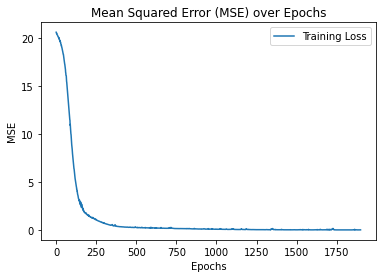

[I 2024-08-03 03:48:54,336] A new study created in memory with name: no-name-31c92a41-6e12-44f2-b083-cfd06ef29a02


1/1 [==============================] - 0s 81ms/step


[I 2024-08-03 04:29:22,902] Trial 3 finished with value: 0.15320081398135088 and parameters: {'nodes': 10, 'l2weight': 0.010786050607250566, 'lr': 0.00304695143261953, 'kernel_init': 'uniform', 'opt': 'Adam'}. Best is trial 3 with value: 0.15320081398135088.


1/1 [==============================] - 0s 91ms/step


[I 2024-08-03 04:30:12,654] Trial 1 finished with value: 0.1509320634719502 and parameters: {'nodes': 7, 'l2weight': 0.001139805561543909, 'lr': 0.003976686768817926, 'kernel_init': 'uniform', 'opt': 'Adam'}. Best is trial 1 with value: 0.1509320634719502.


1/1 [==============================] - 0s 57ms/step


[I 2024-08-03 04:30:39,624] Trial 2 finished with value: 0.003989583748182361 and parameters: {'nodes': 33, 'l2weight': 0.0001776273201719757, 'lr': 0.019039457396939664, 'kernel_init': 'glorot_uniform', 'opt': 'Adamax'}. Best is trial 2 with value: 0.003989583748182361.


1/1 [==============================] - 0s 48ms/step


[I 2024-08-03 04:30:47,410] Trial 0 finished with value: 0.05198793533969862 and parameters: {'nodes': 49, 'l2weight': 0.002374245790763259, 'lr': 0.067982248877717, 'kernel_init': 'uniform', 'opt': 'Adam'}. Best is trial 2 with value: 0.003989583748182361.


1/1 [==============================] - 0s 36ms/step


[I 2024-08-03 04:41:08,662] Trial 4 finished with value: 1.96977013293317 and parameters: {'nodes': 31, 'l2weight': 0.007242083232671543, 'lr': 0.0003200520169107574, 'kernel_init': 'uniform', 'opt': 'Adam'}. Best is trial 2 with value: 0.003989583748182361.


The function training took 22.620000 seconds.


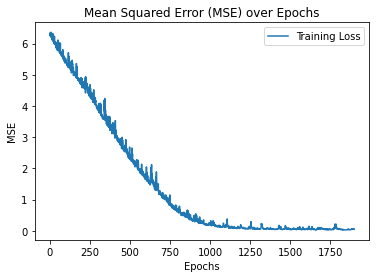

Test MSE: 0.030092436572035773
R^2: 0.9989764041086939


Text(0.5, 1.0, 'High fidelity model')

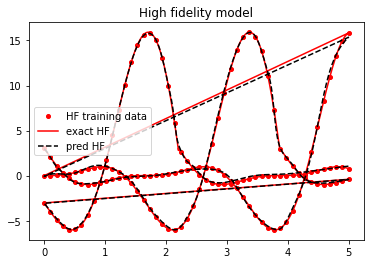

In [7]:
### 2 steps NEURAL NETWORK ###
# collection of parameters
# bestLF_params = {
#     'lr': 0.0255, 
#     'kernel_init': 'glorot_uniform', 
#     'opt': 'Adam'
# }
bestLF_params ={'nodes': 10, 'l2weight': 0.00019473698057304807, 'lr': 0.00015647727706636386, 'kernel_init': 'uniform', 'opt': 'Adam'}
# best_params = {
#     'kernel_init': 'uniform', 
#     'l2weight': 0.00010018625799978436, 
#     'lr': 0.07093837044166487, 
#     'nodes': 74.0, 
#     'opt': 'Adamax'
# }
best_params= {'nodes': 31, 'l2weight': 0.007242083232671543, 'lr': 0.0003200520169107574, 'kernel_init': 'uniform', 'opt': 'Adam'}

params = [bestLF_params, best_params]

N = [data["NepoLF"], data["NepoHF"]]
n = [data["Nlf"], data["Nhf"]]

# names of the networks 
names = ['LF', 'HF']

# collection of the parameters
definition_2steps = {
    "network_type": "2step",
    "names": names,
    "params": params,
    "data_train": [data["xlf"], data["xhf"]],
    "output_train": [data["Ylf"], data["Yhf"]],
    "N": N,
    "n": n,
    "train": True,
    "do_HPO": True,
    "verbose": False
}

# creation of 2 steps model 
final_model = NetworkFactory.build_network(**definition_2steps)

if final_model == -1:
    raise ValueError("Failed to build the network. Check the network type and parameters.")

y_test=final_model.prediction(data["datatest"])

(mse_MF,R_MF)=final_model.performance(data["datatest"],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]))

    #(mse_MF,R_MF)=final_model.performance(data["x_test"].reshape(-1,1),data["high_fid"](data["x_test"]))

### PLOT of predicted models ###
#LF single-fidelity



plt.figure()
plt.plot(data["xhf"][:,0],data["Yhf"],'ro', label = 'HF training data', markersize = 4)
plt.plot(data["datatest"][:,0],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]),'r', label = 'exact HF') 
plt.plot(data["datatest"][:,0],y_test,'k--', label = 'pred HF')
plt.legend()
plt.title('High fidelity model')


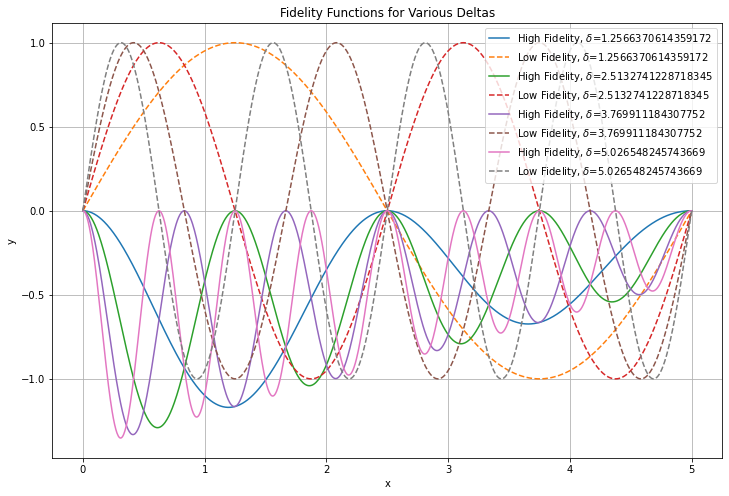

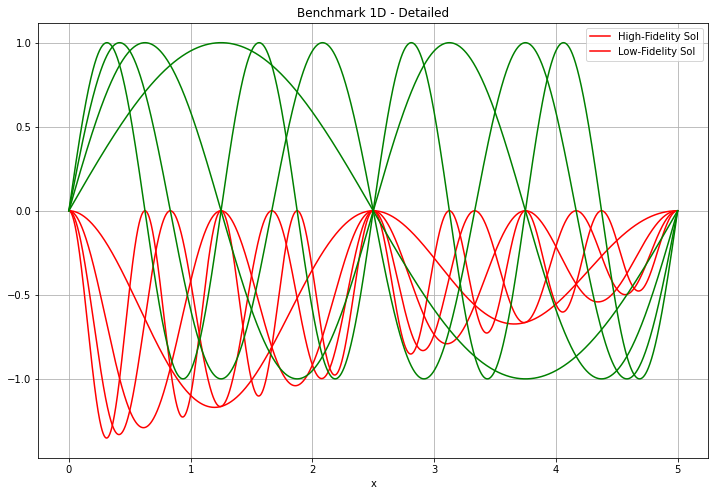

In [8]:
example = "Oscillatory"
fidelity_func = FidelityFunctionModified(example)
fidelity_func.plot_functions()
fidelity_func.plot_detailed_functions()

In [9]:
data=fidelity_func.get_parameters(example)

[I 2024-08-03 04:41:47,291] A new study created in memory with name: no-name-7f51e380-0e8d-4d2d-b1dd-866654579ca5


1/1 [==============================] - 0s 170ms/step


[I 2024-08-03 05:25:07,787] Trial 2 finished with value: 0.49478798315647526 and parameters: {'nodes': 29, 'l2weight': 0.020542936041207282, 'lr': 0.05010154941599651, 'kernel_init': 'uniform', 'opt': 'Adam'}. Best is trial 2 with value: 0.49478798315647526.


1/1 [==============================] - 0s 192ms/step


[I 2024-08-03 05:25:52,859] Trial 3 finished with value: 0.03133951879846454 and parameters: {'nodes': 11, 'l2weight': 0.0003839991495597001, 'lr': 0.06230624448486636, 'kernel_init': 'glorot_uniform', 'opt': 'Adamax'}. Best is trial 3 with value: 0.03133951879846454.


1/1 [==============================] - 0s 176ms/step


[I 2024-08-03 05:25:59,787] Trial 0 finished with value: 0.003340250961273954 and parameters: {'nodes': 4, 'l2weight': 0.0018628223334566359, 'lr': 0.0004625962742681507, 'kernel_init': 'glorot_uniform', 'opt': 'Adamax'}. Best is trial 0 with value: 0.003340250961273954.


1/1 [==============================] - 0s 42ms/step


[I 2024-08-03 05:26:03,730] Trial 1 finished with value: 0.018219618500379443 and parameters: {'nodes': 21, 'l2weight': 0.0006429204046677787, 'lr': 0.00017445329032019354, 'kernel_init': 'glorot_uniform', 'opt': 'Adamax'}. Best is trial 0 with value: 0.003340250961273954.


1/1 [==============================] - 0s 37ms/step


[I 2024-08-03 05:41:38,536] Trial 4 finished with value: 0.0057389998251422695 and parameters: {'nodes': 9, 'l2weight': 0.0028791712270532536, 'lr': 0.03272222741165945, 'kernel_init': 'glorot_uniform', 'opt': 'Adamax'}. Best is trial 0 with value: 0.003340250961273954.


The function training took 18.950997 seconds.


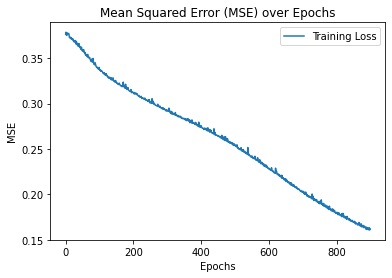

[I 2024-08-03 05:41:58,231] A new study created in memory with name: no-name-0002f757-9b7f-480b-a4fd-31fd05a217a7


1/1 [==============================] - 0s 55ms/step


[I 2024-08-03 06:00:41,656] Trial 1 finished with value: 0.10126324009073047 and parameters: {'nodes': 8, 'l2weight': 0.041341478281025495, 'lr': 0.00820242510774668, 'kernel_init': 'glorot_uniform', 'opt': 'Adam'}. Best is trial 1 with value: 0.10126324009073047.


1/1 [==============================] - 0s 145ms/step


[I 2024-08-03 06:00:57,535] Trial 2 finished with value: 0.10153762315392838 and parameters: {'nodes': 35, 'l2weight': 0.007759107970855846, 'lr': 0.07963898480739033, 'kernel_init': 'glorot_uniform', 'opt': 'Adamax'}. Best is trial 1 with value: 0.10126324009073047.


1/1 [==============================] - 1s 1s/step


[I 2024-08-03 06:01:00,354] Trial 3 finished with value: 0.10723784820080429 and parameters: {'nodes': 12, 'l2weight': 0.001929657496092574, 'lr': 0.0016866677037994243, 'kernel_init': 'uniform', 'opt': 'Adamax'}. Best is trial 1 with value: 0.10126324009073047.


1/1 [==============================] - 0s 124ms/step


[I 2024-08-03 06:01:07,519] Trial 0 finished with value: 0.10038831726402614 and parameters: {'nodes': 45, 'l2weight': 0.00012061176063047335, 'lr': 0.009097455848111679, 'kernel_init': 'uniform', 'opt': 'Adamax'}. Best is trial 0 with value: 0.10038831726402614.


1/1 [==============================] - 0s 35ms/step


[I 2024-08-03 06:05:52,231] Trial 4 finished with value: 0.15802969953565374 and parameters: {'nodes': 12, 'l2weight': 0.0006073613192241591, 'lr': 0.007337133872102517, 'kernel_init': 'glorot_uniform', 'opt': 'Adamax'}. Best is trial 0 with value: 0.10038831726402614.


The function training took 39.893993 seconds.


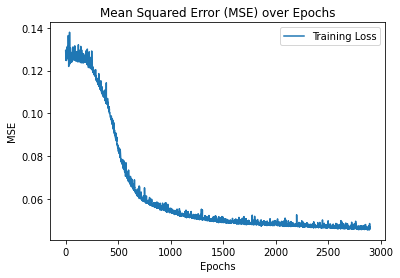

Test MSE: 0.052316382346494786
R^2: 0.6084628201343516


Text(0.5, 1.0, 'High fidelity model')

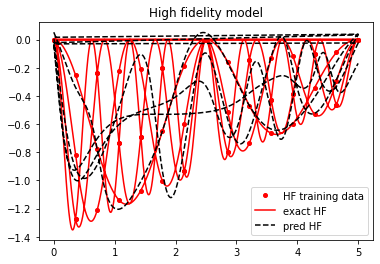

In [10]:
### 2 steps NEURAL NETWORK ###
# collection of parameters
bestLF_params = {
    'lr': 0.0255, 
    'kernel_init': 'glorot_uniform', 
    'opt': 'Adam'
}

best_params = {
    'kernel_init': 'uniform', 
    'l2weight': 0.00010018625799978436, 
    'lr': 0.07093837044166487, 
    'nodes': 74.0, 
    'opt': 'Adamax'
}

params = [bestLF_params, best_params]

N = [data["NepoLF"], data["NepoHF"]]
n = [data["Nlf"], data["Nhf"]]

# names of the networks 
names = ['LF', 'HF']

# collection of the parameters
definition_2steps = {
    "network_type": "2step",
    "names": names,
    "params": params,
    "data_train": [data["xlf"], data["xhf"]],
    "output_train": [data["Ylf"], data["Yhf"]],
    "N": N,
    "n": n,
    "train": True,
    "do_HPO": True,
    "verbose": False
}

# creation of 2 steps model 
final_model = NetworkFactory.build_network(**definition_2steps)

if final_model == -1:
    raise ValueError("Failed to build the network. Check the network type and parameters.")

y_test=final_model.prediction(data["datatest"])

(mse_MF,R_MF)=final_model.performance(data["datatest"],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]))

    #(mse_MF,R_MF)=final_model.performance(data["x_test"].reshape(-1,1),data["high_fid"](data["x_test"]))

### PLOT of predicted models ###
#LF single-fidelity



plt.figure()
plt.plot(data["xhf"][:,0],data["Yhf"],'ro', label = 'HF training data', markersize = 4)
plt.plot(data["datatest"][:,0],data["modified_highfid"](data["datatest"][:,0],data["datatest"][:,1]),'r', label = 'exact HF') 
plt.plot(data["datatest"][:,0],y_test,'k--', label = 'pred HF')
plt.legend()
plt.title('High fidelity model')


# Prediction of a parameter 2 step nn

Sampling chain 1/2


Running chain, α = 0.47: 100%|██████████| 30/30 [00:02<00:00, 10.90it/s]


Sampling chain 2/2


Running chain, α = 0.50: 100%|██████████| 30/30 [00:03<00:00,  8.35it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\utils.py:187: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


Estimated values are [6.985]
     mean    sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  6.985  0.59   6.174    7.779      0.225    0.166       7.0      22.0   

    r_hat  
x0   1.93  


c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\utils.py:187: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


Autocorrelation...
The difference between estimated values [8.015]



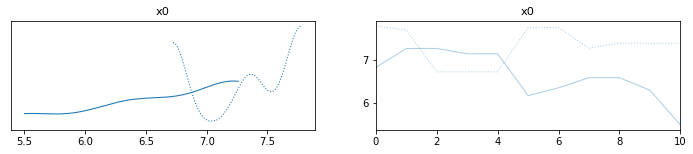

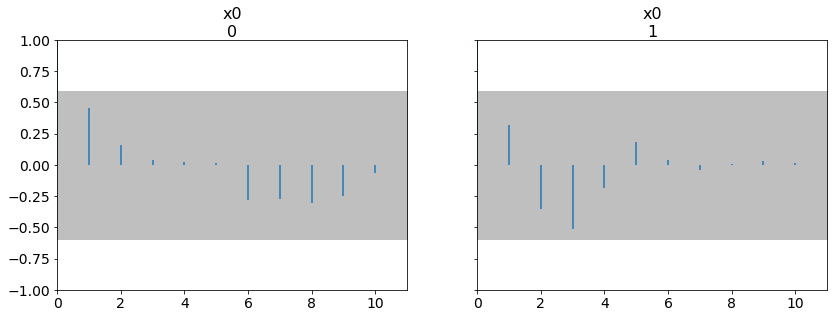

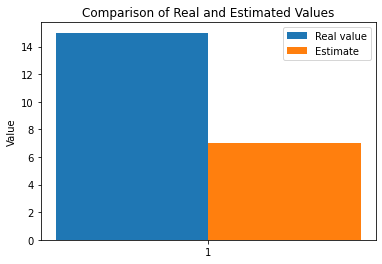

The function param_inverse took 8.630336 seconds.
Sampling chain 1/2


Running chain, α = 0.83: 100%|██████████| 30/30 [00:03<00:00,  9.98it/s]


Sampling chain 2/2


Running chain, α = 0.90: 100%|██████████| 30/30 [00:02<00:00, 11.77it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.919]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.919  1.146   6.043    9.455      0.484    0.364       6.0       7.0   

    r_hat  
x0   2.58  
Autocorrelation...
The difference between estimated values [7.081]



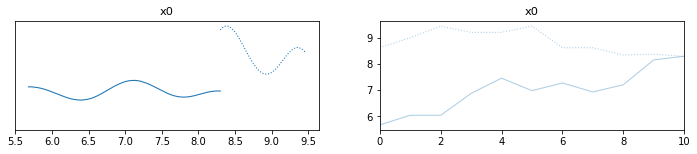

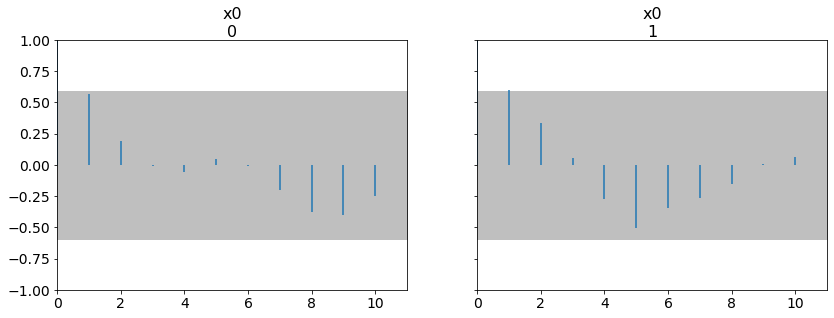

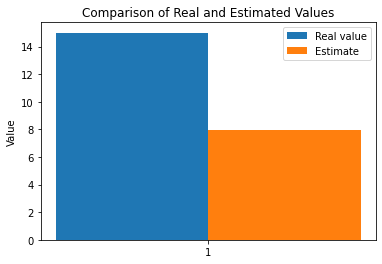

The function param_inverse took 7.314465 seconds.
Sampling chain 1/2


Running chain, α = 0.77: 100%|██████████| 30/30 [00:02<00:00, 11.76it/s]


Sampling chain 2/2


Running chain, α = 0.87: 100%|██████████| 30/30 [00:03<00:00,  9.97it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [6.212]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  6.212  1.079   4.735    8.297      0.304    0.231      17.0      10.0   

    r_hat  
x0   1.13  
Autocorrelation...
The difference between estimated values [8.788]



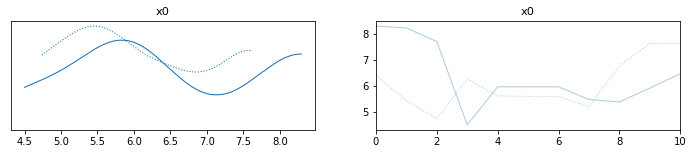

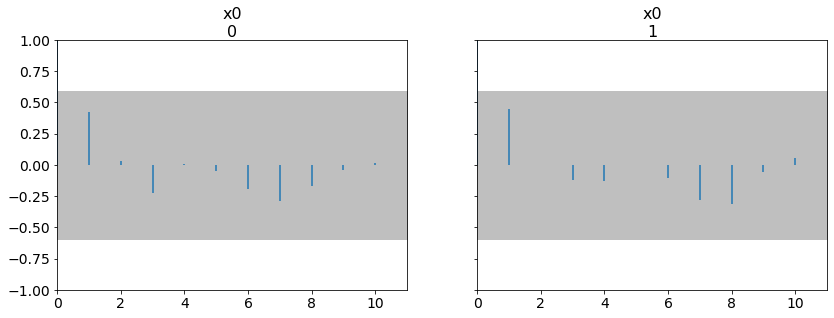

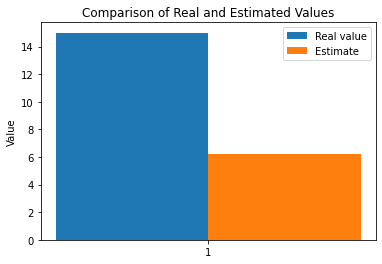

The function param_inverse took 6.874479 seconds.
Sampling chain 1/2


Running chain, α = 0.50: 100%|██████████| 30/30 [00:02<00:00, 11.99it/s]


Sampling chain 2/2


Running chain, α = 0.47: 100%|██████████| 30/30 [00:03<00:00,  9.84it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [6.754]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  6.754  0.856   5.382    7.817      0.301    0.221      10.0       6.0   

    r_hat  
x0    1.7  
Autocorrelation...
The difference between estimated values [8.246]



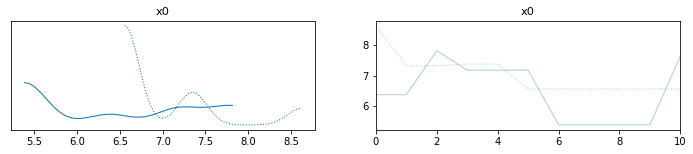

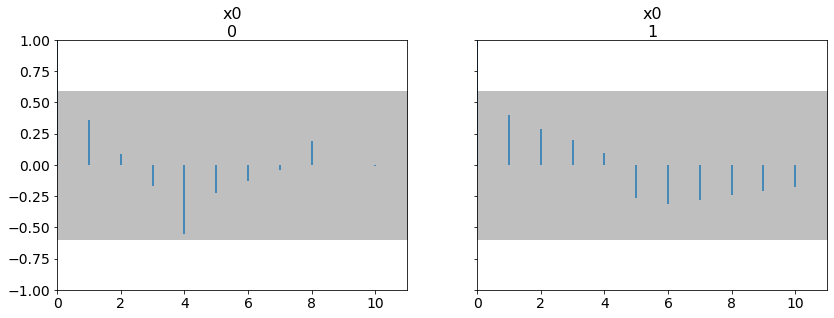

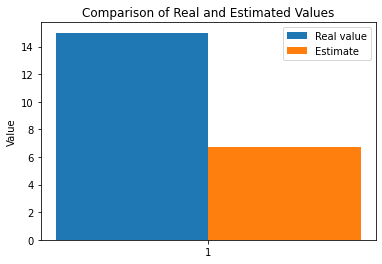

The function param_inverse took 9.631190 seconds.
Sampling chain 1/2


Running chain, α = 0.87: 100%|██████████| 30/30 [00:02<00:00, 10.99it/s]


Sampling chain 2/2


Running chain, α = 0.87: 100%|██████████| 30/30 [00:03<00:00,  9.99it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [5.513]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  5.513  1.466   3.602    7.477      0.641    0.481       6.0      14.0   

    r_hat  
x0   3.12  
Autocorrelation...
The difference between estimated values [9.487]



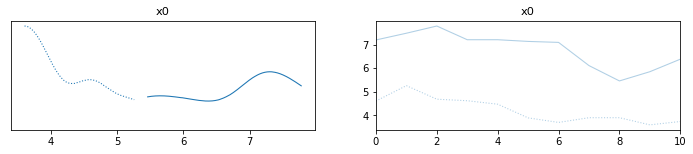

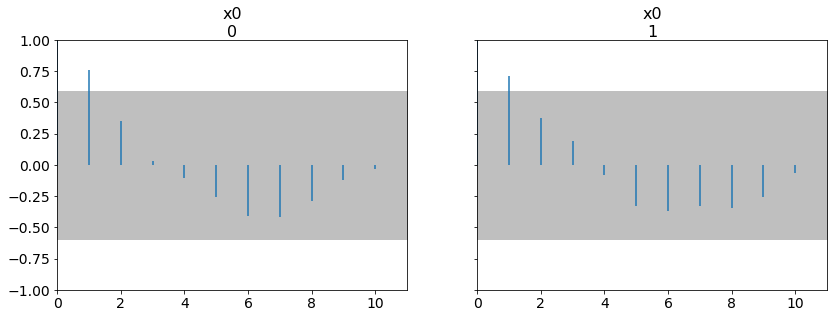

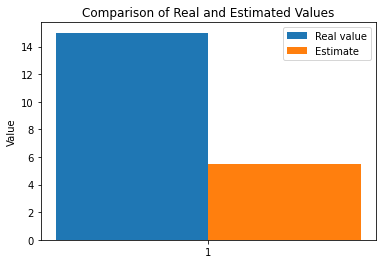

The function param_inverse took 7.106282 seconds.
Sampling chain 1/2


Running chain, α = 0.73: 100%|██████████| 30/30 [00:06<00:00,  4.83it/s]


Sampling chain 2/2


Running chain, α = 0.73: 100%|██████████| 30/30 [00:03<00:00,  8.96it/s]
c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\data\inference_data.py:146: UserWarning: qoi group is not defined in the InferenceData scheme
  warnings.warn(


Estimated values are [7.564]
     mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  ess_tail  \
x0  7.564  0.453   6.943    8.283      0.104    0.076      25.0      15.0   

    r_hat  
x0   1.28  
Autocorrelation...
The difference between estimated values [7.436]



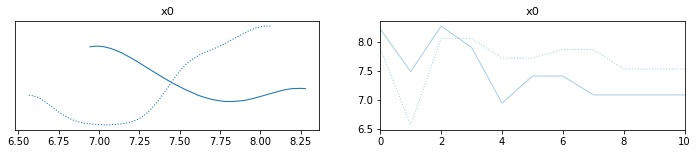

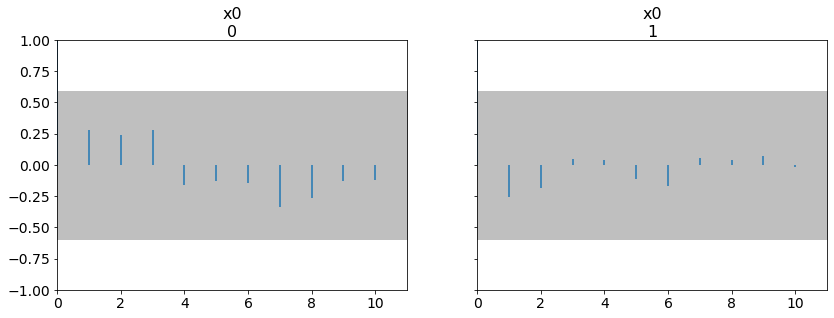

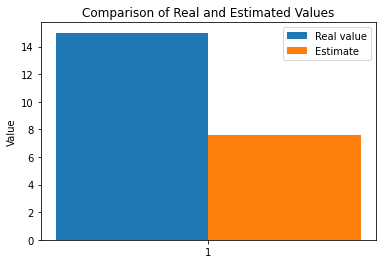

The function param_inverse took 12.169764 seconds.
Sampling chain 1/2


Running chain, α = 1.00:   0%|          | 0/30 [00:00<?, ?it/s]


KeyboardInterrupt: 

In [5]:
mean_prior = np.array([7.])
cov_prior = np.diag([1.])

sigma_noise = [0.05,0.1]
n_data = [50,30]
parameters = np.array([15.])
sigma = np.array([ 4.,2.])
rwmh_scaling = np.array([ 2.,0.5,1.])
rwmh_cov = np.eye(1)
rwmh_adaptive = True
iterations = 30
burnin = 20
n_chains = 2
algo = "MH"


# ricorda che i primi due non vanno bene in qualunque caso
estimateLF, errorLF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelLF,algo)
estimateHF, errorHF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, modelHF,algo)

estimateMF, errorMF= run_simulation(data["xhf"], mean_prior, cov_prior, data["Yhf"], sigma_noise, n_data, parameters, sigma, rwmh_scaling, rwmh_cov, rwmh_adaptive, iterations, burnin, n_chains, final_model,algo)




In [ ]:

# Define inputs
mean_prior = np.array([7.])
cov_prior = np.diag([1.])
y_obs = data["Yhf"]
sd_noise = 0.1
N = 3000
burn_in = 2000
number_chains = 2
algo = "MH"
x_real = np.array([15.])
proposal_sd = 0.3
adapt = True
n_data = [30, 50]


x_data=  np.linspace(0., 5., n_data[0]).reshape(-1, 1)  # Generate evaluation times

nearest_x, y_obs = process_data(data["xhf"], parameters, x_data, Yhf) 

estimates = final_model.inverse_cuqi(
    mean_prior=mean_prior,
    x_real=x_real,
    y_obs=y_obs,
    N=N,
    burn_in=burn_in,
    cov_prior=cov_prior,
    sd_noise=sd_noise,  
    adapt=adapt,
    scale=proposal_sd,
    proposal_sd=proposal_sd,
    number_chains=number_chains,
    algo=algo,
    x_data=x_data
)

NameError: name 'parameters' is not defined

In [ ]:
data["Yhf"].shape

(80,)

In [ ]:
mean_prior = np.array([7.])
cov_prior = np.diag([1.])
Yhf = np.array([10, 20, 30, 40, 50])
sigma_noise = [0.1, 0.05]
n_data = [30, 50]
parameters = np.array([15.])
sigma = np.array([2., 4.])
rwmh_scaling = np.array([0.5, 1., 2.])
rwmh_cov = np.eye(1)
rwmh_adaptive = True
iterations = 3000
burnin = 2000
n_chains = 2
algo = "MH"

In [ ]:
# Define inputs
mean_prior = np.array([7.])
cov_prior = np.diag([1.])
Yhf = data["Yhf"]
sd_noise = [0.1,0.05]
N = 30
burn_in = 20
number_chains = 2
algo = "MH"
x_real = np.array([15.])
proposal_sd = [4.,2.]
adapt = True
n_data = [50,30]



module_directory = os.path.abspath(os.path.join('..', 'utils'))

# Add the 'utils' directory containing Structure2.py to the PYTHONPATH
os.environ['PYTHONPATH'] = module_directory
sys.path.append(module_directory)


x_data=  np.linspace(0., 5., n_data[0]).reshape(-1, 1)  # Generate evaluation times
nearest_x, y_obs = process_data(data["xhf"], x_real, x_data, Yhf) 

# estimates = final_model.inverse_cuqi(
#     mean_prior=mean_prior,
#     x_real=x_real,
#     y_obs=y_obs,
#     N=N,
#     burn_in=burn_in,
#     cov_prior=cov_prior,
#     sd_noise=sd_noise,  
#     adapt=adapt,
#     scale=proposal_sd,
#     proposal_sd=proposal_sd,
#     number_chains=number_chains,
#     algo=algo,
#     x_data=x_data
# )

best_estimate,best_error=run_simulation_cuqi(data,
    mean_prior,
    x_real,
    N,
    burn_in,
    cov_prior,
    sd_noise,  
    adapt,
    
    proposal_sd,
    number_chains,
    algo,
    x_data,
    n_data,
    modelLF,
    parallel=True
) 



Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dense_3
......vars
.........0
.........1
...layers\dense_4
......vars
.........0
.........1
...layers\input_layer
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........13
.........14
.........15
.........16
.........17
.........18
.........19
.........2
.........20
.........21
.........22
.........23
.........24
.........25
.........26
.........27
.........28
.........29
.........3
.........30
.........4
.........5
.........6
.........7
.........8
.........9
...vars
Keras model archive saving:
File Name                                             Modified             Size
config.json                      

KeyboardInterrupt: 

Sample 30 / 30

Average acceptance rate: 0.7 MCMC scale: 1 

Mean values: [9.46697594]
The function chain_creation took 8.107001304626465 seconds.
Sample 30 / 30

Average acceptance rate: 0.4 MCMC scale: 1 

Mean values: [6.91791986]
The function chain_creation took 5.119001388549805 seconds.


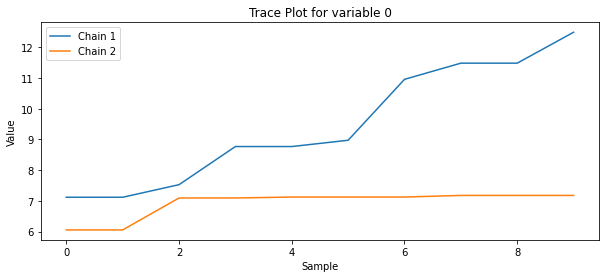

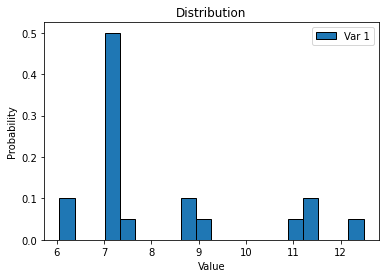

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 5.767741395488823


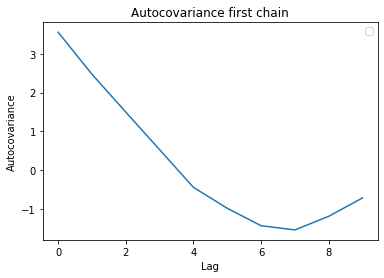

Error wrt true parameters: 6.8075521003662764
The difference between estimated values [6.8075521]



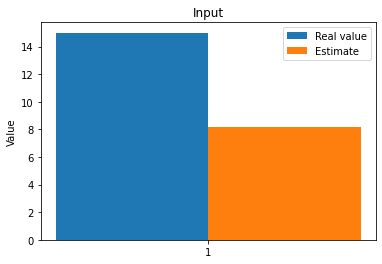

The function inverse_cuqi took 14.455999 seconds.
Sample 30 / 30

Average acceptance rate: 0.6 MCMC scale: 1 

Mean values: [13.09132152]
The function chain_creation took 6.135878801345825 seconds.
Sample 30 / 30

Average acceptance rate: 0.5 MCMC scale: 1 

Mean values: [8.80734119]
The function chain_creation took 5.1187872886657715 seconds.


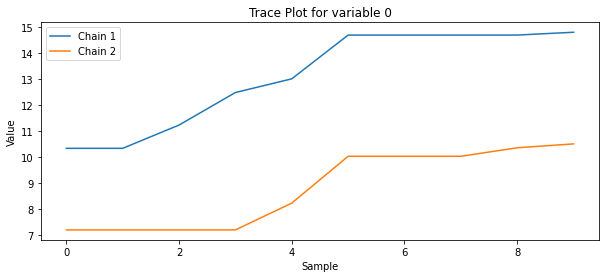

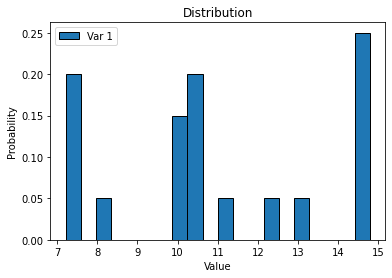

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 5.374828629043542


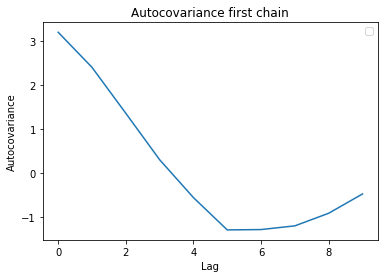

Error wrt true parameters: 4.050668646238297
The difference between estimated values [4.05066865]



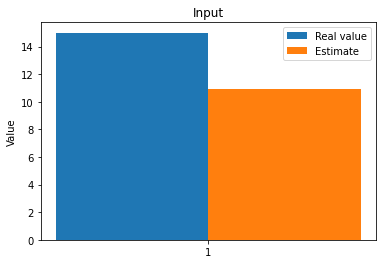

The function inverse_cuqi took 12.205624 seconds.
Sample 30 / 30

Average acceptance rate: 0.5 MCMC scale: 1 

Mean values: [7.32862381]
The function chain_creation took 5.215944290161133 seconds.
Sample 13 / 30

KeyboardInterrupt: 

In [ ]:
# Define inputs
mean_prior = np.array([7.])
cov_prior = np.diag([1.])
Yhf = data["Yhf"]
sd_noise = [0.1,0.05]
N = 30
burn_in = 20
number_chains = 2
algo = "MH"
x_real = np.array([15.])
proposal_sd = [4.,2.]
adapt = True
n_data = [50,30]


module_directory = os.path.abspath(os.path.join('..', 'utils'))

# Add the 'utils' directory containing Structure2.py to the PYTHONPATH
os.environ['PYTHONPATH'] = module_directory
sys.path.append(module_directory)


x_data=  np.linspace(0., 5., n_data[0]).reshape(-1, 1)  # Generate evaluation times
nearest_x, y_obs = process_data(data["xhf"], x_real, x_data, Yhf) 

# estimates = final_model.inverse_cuqi(
#     mean_prior=mean_prior,
#     x_real=x_real,
#     y_obs=y_obs,
#     N=N,
#     burn_in=burn_in,
#     cov_prior=cov_prior,
#     sd_noise=sd_noise,  
#     adapt=adapt,
#     scale=proposal_sd,
#     proposal_sd=proposal_sd,
#     number_chains=number_chains,
#     algo=algo,
#     x_data=x_data
# )

best_estimate,best_error=run_simulation_cuqi(data,
    mean_prior,
    x_real,
    N,
    burn_in,
    cov_prior,
    sd_noise,  
    adapt,
    
    proposal_sd,
    number_chains,
    algo,
    x_data,
    n_data,
    final_model,
    parallel=False
) 




Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dense_3
......vars
.........0
.........1
...layers\dense_4
......vars
.........0
.........1
...layers\input_layer
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........13
.........14
.........15
.........16
.........17
.........18
.........19
.........2
.........20
.........21
.........22
.........23
.........24
.........25
.........26
.........27
.........28
.........29
.........3
.........30
.........4
.........5
.........6
.........7
.........8
.........9
...vars
Keras model archive saving:
File Name                                             Modified             Size
config.json                     

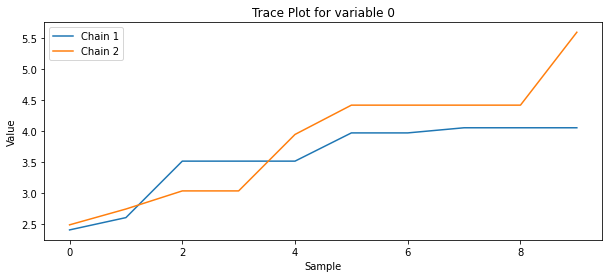

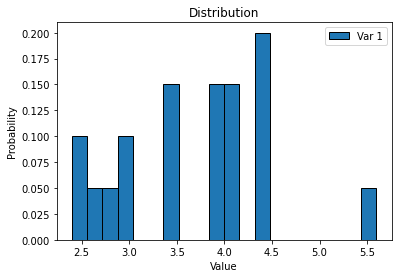

c:\Users\Giacomo\AppData\Local\Programs\Python\Python310\lib\site-packages\arviz\utils.py:187: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 5.841536931592086


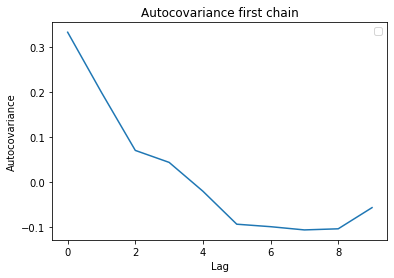

Error wrt true parameters: 11.293505947300309
The difference between estimated values [11.29350595]



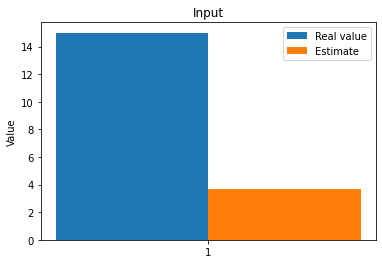

The function inverse_cuqi took 34.186663 seconds.

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dense_3
......vars
.........0
.........1
...layers\dense_4
......vars
.........0
.........1
...layers\input_layer
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........13
.........14
.........15
.........16
.........17
.........18
.........19
.........2
.........20
.........21
.........22
.........23
.........24
.........25
.........26
.........27
.........28
.........29
.........3
.........30
.........4
.........5
.........6
.........7
.........8
.........9
...vars
Keras model archive saving:
File Name                                             Modified

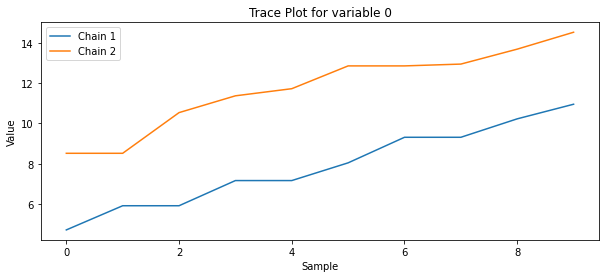

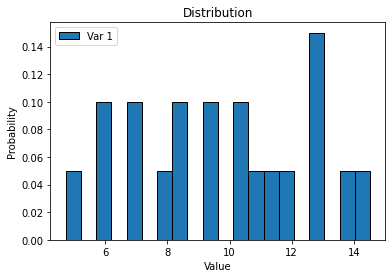

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 5.54637104510147


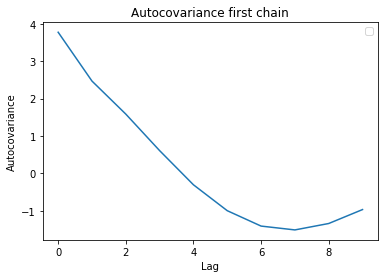

Error wrt true parameters: 5.184128999393209
The difference between estimated values [5.184129]



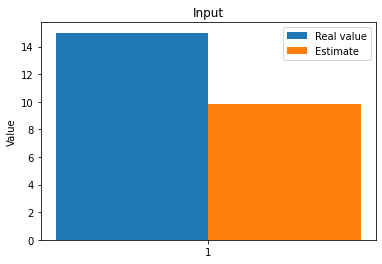

The function inverse_cuqi took 32.140169 seconds.

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dense_3
......vars
.........0
.........1
...layers\dense_4
......vars
.........0
.........1
...layers\input_layer
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........13
.........14
.........15
.........16
.........17
.........18
.........19
.........2
.........20
.........21
.........22
.........23
.........24
.........25
.........26
.........27
.........28
.........29
.........3
.........30
.........4
.........5
.........6
.........7
.........8
.........9
...vars
Keras model archive saving:
File Name                                             Modified

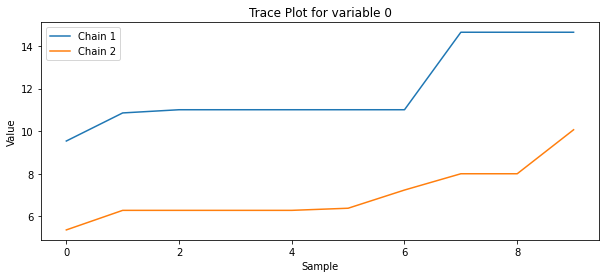

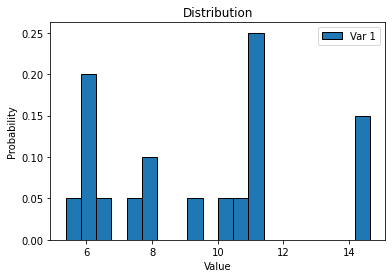

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 5.453868585396957


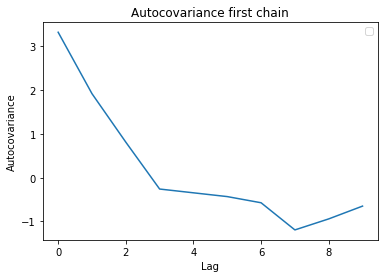

Error wrt true parameters: 5.5221667252106315
The difference between estimated values [5.52216673]



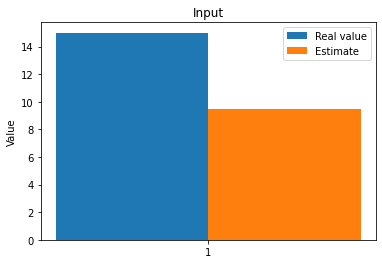

The function inverse_cuqi took 31.298657 seconds.

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dense_3
......vars
.........0
.........1
...layers\dense_4
......vars
.........0
.........1
...layers\input_layer
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........13
.........14
.........15
.........16
.........17
.........18
.........19
.........2
.........20
.........21
.........22
.........23
.........24
.........25
.........26
.........27
.........28
.........29
.........3
.........30
.........4
.........5
.........6
.........7
.........8
.........9
...vars
Keras model archive saving:
File Name                                             Modified

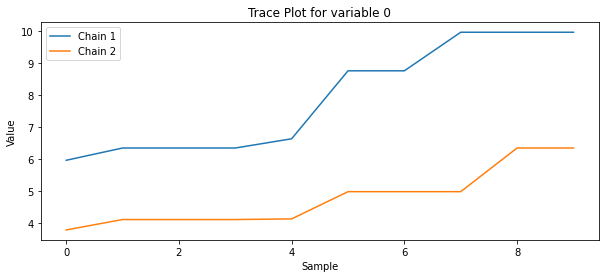

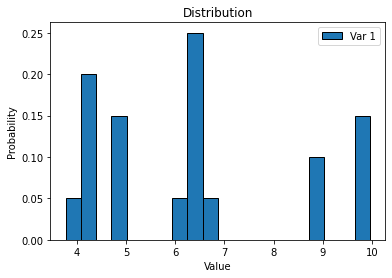

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 5.504975462690677


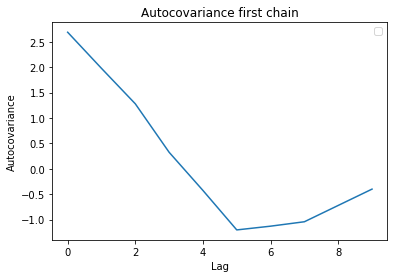

Error wrt true parameters: 8.66225140236596
The difference between estimated values [8.6622514]



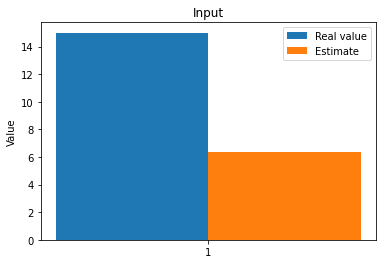

The function inverse_cuqi took 30.776066 seconds.

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dense_3
......vars
.........0
.........1
...layers\dense_4
......vars
.........0
.........1
...layers\input_layer
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........13
.........14
.........15
.........16
.........17
.........18
.........19
.........2
.........20
.........21
.........22
.........23
.........24
.........25
.........26
.........27
.........28
.........29
.........3
.........30
.........4
.........5
.........6
.........7
.........8
.........9
...vars
Keras model archive saving:
File Name                                             Modified

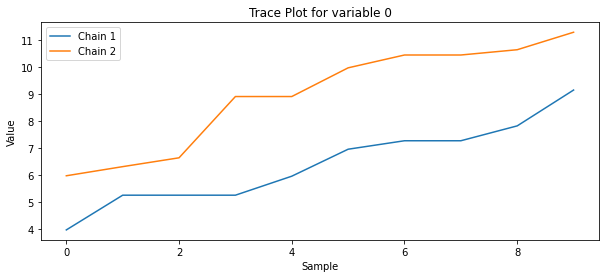

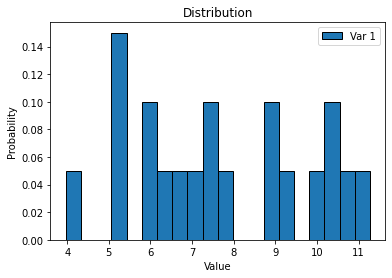

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 5.556507938669503


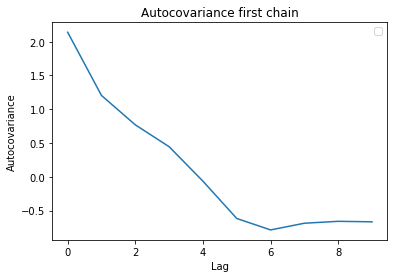

Error wrt true parameters: 7.32513551485845
The difference between estimated values [7.32513551]



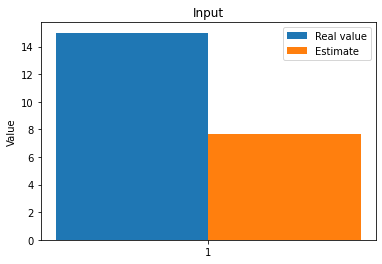

The function inverse_cuqi took 31.229533 seconds.

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dense_3
......vars
.........0
.........1
...layers\dense_4
......vars
.........0
.........1
...layers\input_layer
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........13
.........14
.........15
.........16
.........17
.........18
.........19
.........2
.........20
.........21
.........22
.........23
.........24
.........25
.........26
.........27
.........28
.........29
.........3
.........30
.........4
.........5
.........6
.........7
.........8
.........9
...vars
Keras model archive saving:
File Name                                             Modified

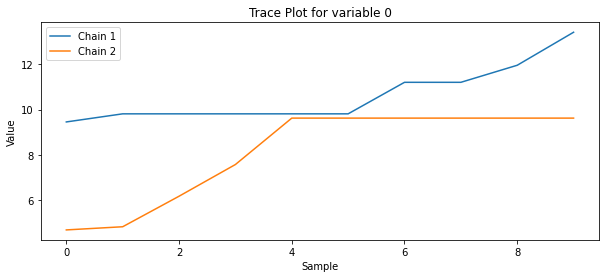

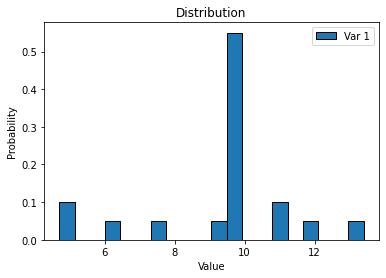

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 5.8772171724243245


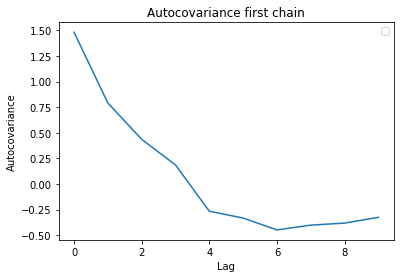

Error wrt true parameters: 5.632852837125576
The difference between estimated values [5.63285284]



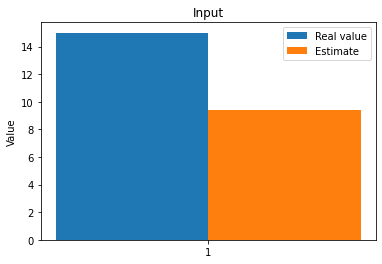

The function inverse_cuqi took 32.136897 seconds.

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dense_3
......vars
.........0
.........1
...layers\dense_4
......vars
.........0
.........1
...layers\input_layer
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........13
.........14
.........15
.........16
.........17
.........18
.........19
.........2
.........20
.........21
.........22
.........23
.........24
.........25
.........26
.........27
.........28
.........29
.........3
.........30
.........4
.........5
.........6
.........7
.........8
.........9
...vars
Keras model archive saving:
File Name                                             Modified

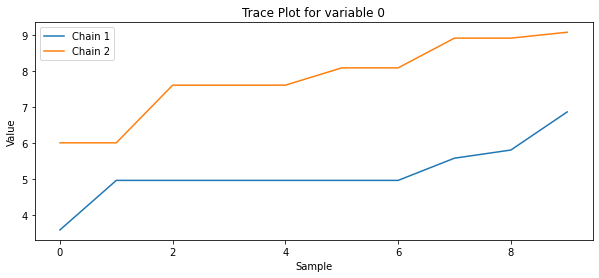

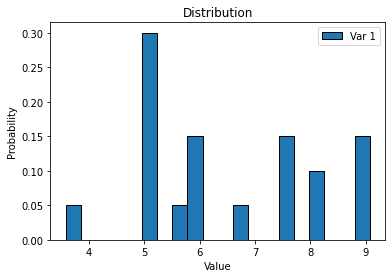

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 5.599617673795646


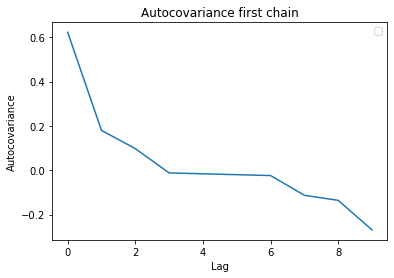

Error wrt true parameters: 8.528526917606285
The difference between estimated values [8.52852692]



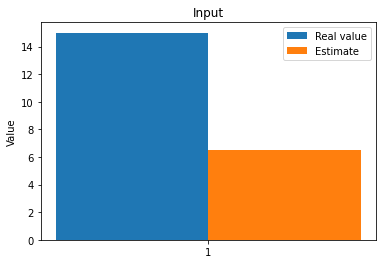

The function inverse_cuqi took 30.780438 seconds.

Keras weights file (<HDF5 file "variables.h5" (mode r+)>) saving:
...layers\dense
......vars
.........0
.........1
...layers\dense_1
......vars
.........0
.........1
...layers\dense_2
......vars
.........0
.........1
...layers\dense_3
......vars
.........0
.........1
...layers\dense_4
......vars
.........0
.........1
...layers\input_layer
......vars
...metrics\mean
......vars
.........0
.........1
...metrics\mean_metric_wrapper
......vars
.........0
.........1
...optimizer
......vars
.........0
.........1
.........10
.........11
.........12
.........13
.........14
.........15
.........16
.........17
.........18
.........19
.........2
.........20
.........21
.........22
.........23
.........24
.........25
.........26
.........27
.........28
.........29
.........3
.........30
.........4
.........5
.........6
.........7
.........8
.........9
...vars
Keras model archive saving:
File Name                                             Modified

KeyboardInterrupt: 

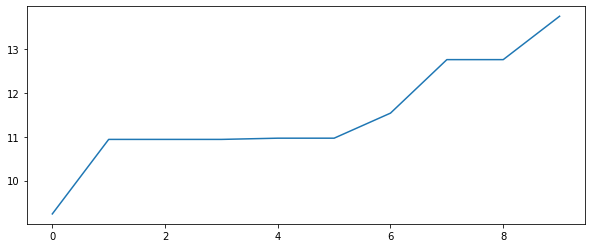

In [ ]:
# Define inputs
mean_prior = np.array([7.])
cov_prior = np.diag([1.])
Yhf = data["Yhf"]
sd_noise = [0.1,0.05]
N = 30
burn_in = 20
number_chains = 2
algo = "MH"
x_real = np.array([15.])
proposal_sd = [4.,2.]
adapt = True
n_data = [50,30]


module_directory = os.path.abspath(os.path.join('..', 'utils'))

# Add the 'utils' directory containing Structure2.py to the PYTHONPATH
os.environ['PYTHONPATH'] = module_directory
sys.path.append(module_directory)


x_data=  np.linspace(0., 5., n_data[0]).reshape(-1, 1)  # Generate evaluation times
nearest_x, y_obs = process_data(data["xhf"], x_real, x_data, Yhf) 

# estimates = final_model.inverse_cuqi(
#     mean_prior=mean_prior,
#     x_real=x_real,
#     y_obs=y_obs,
#     N=N,
#     burn_in=burn_in,
#     cov_prior=cov_prior,
#     sd_noise=sd_noise,  
#     adapt=adapt,
#     scale=proposal_sd,
#     proposal_sd=proposal_sd,
#     number_chains=number_chains,
#     algo=algo,
#     x_data=x_data
# )

best_estimate,best_error=run_simulation_cuqi(data,
    mean_prior,
    x_real,
    N,
    burn_in,
    cov_prior,
    sd_noise,  
    adapt,
    
    proposal_sd,
    number_chains,
    algo,
    x_data,
    n_data,
    final_model,
    parallel=True
) 



In [ ]:
        ray.shutdown()


Sample 3000 / 3000

Average acceptance rate: 0.31 MCMC scale: 0.6249622686431184 

Mean values = [14.8533291]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.299 MCMC scale: 0.6130123585872429 

Mean values = [14.85638325]
(2, 1, 1000)


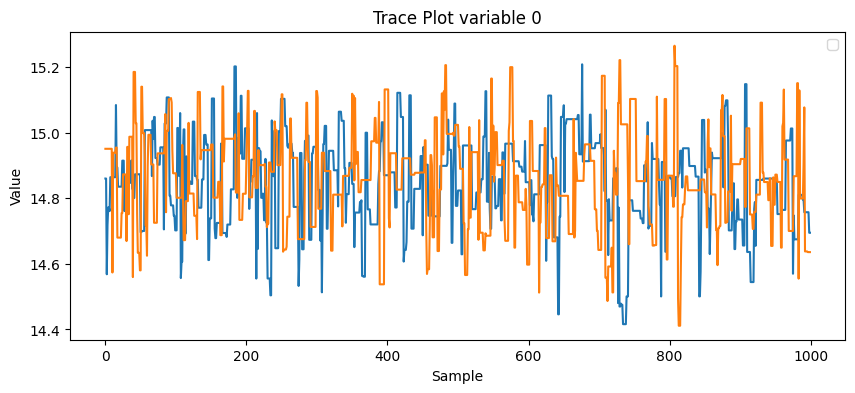

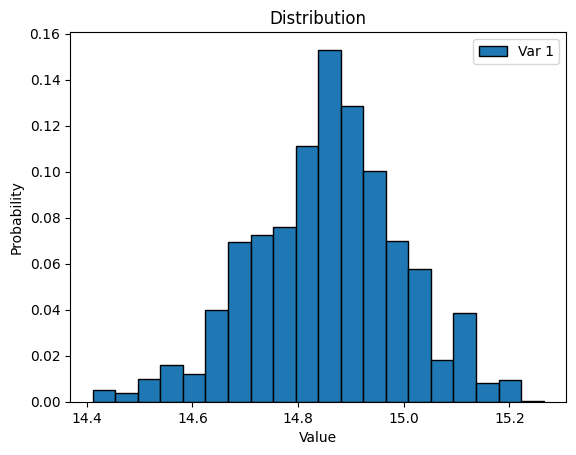

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 378.5746147278357


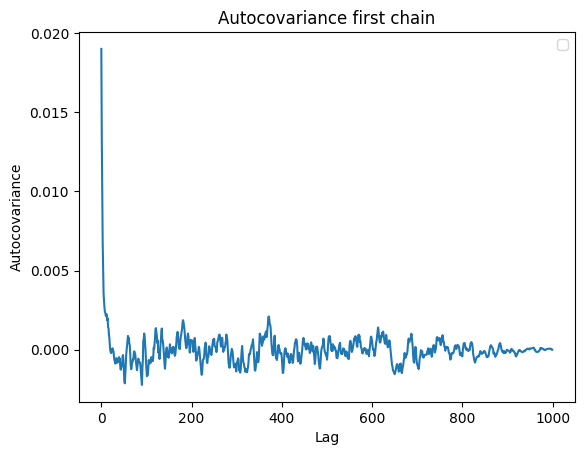

the difference between estimated values [0.14361675]



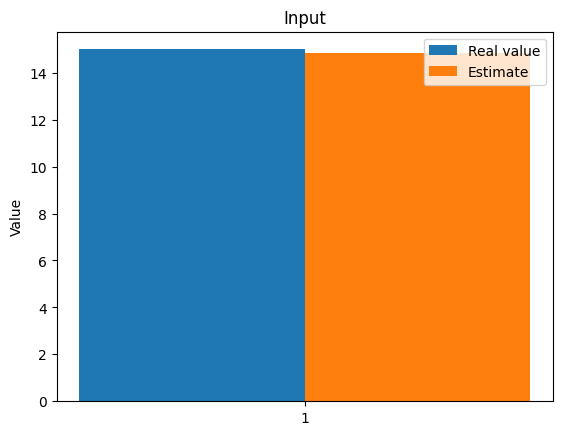

Sample 3000 / 3000

Average acceptance rate: 0.26 MCMC scale: 0.4367660225755193 

Mean values = [14.9228205]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.268 MCMC scale: 0.4541695530693019 

Mean values = [14.91729729]
(2, 1, 1000)


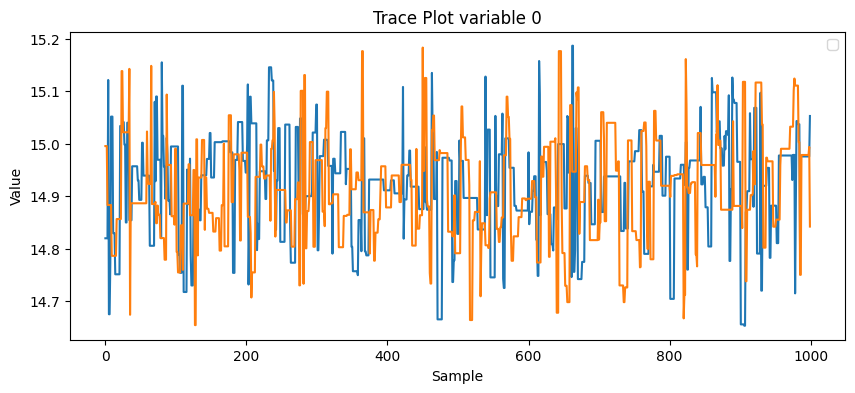

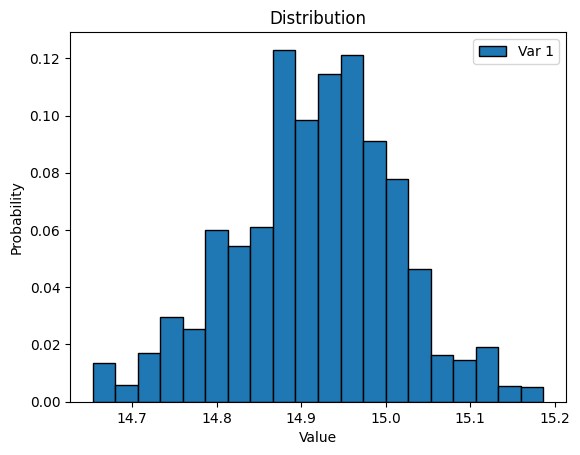

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 423.0425194756


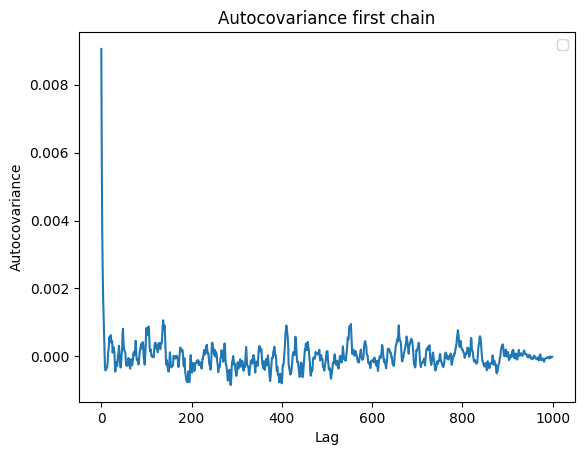

the difference between estimated values [0.08270271]



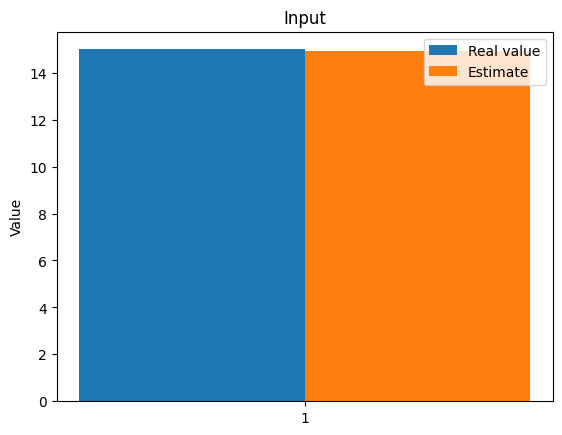

Sample 3000 / 3000

Average acceptance rate: 0.305 MCMC scale: 0.7763530803778186 

Mean values = [14.7505142]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.277 MCMC scale: 0.7344583613957313 

Mean values = [14.75779272]
(2, 1, 1000)


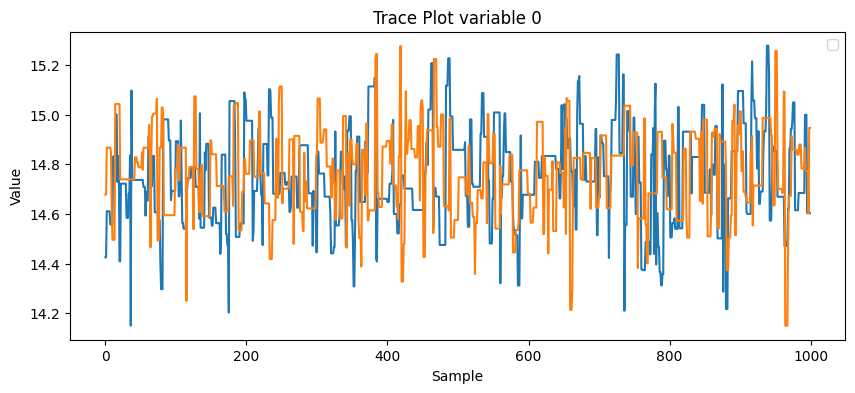

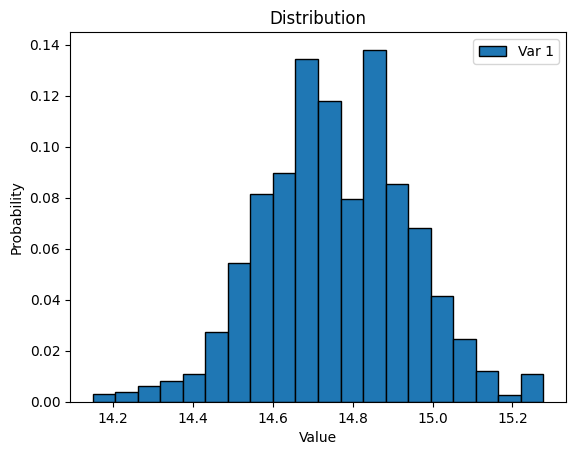

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 443.0052654580456


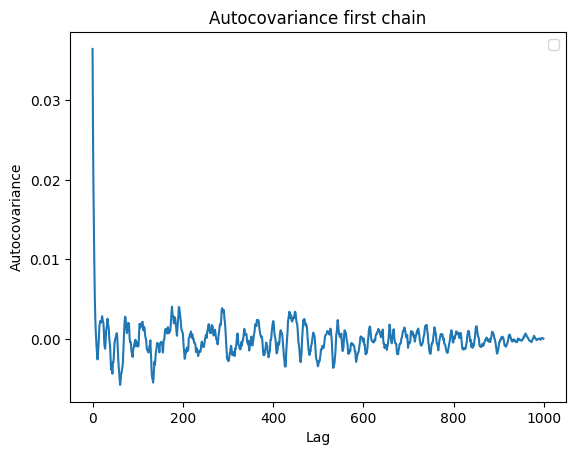

the difference between estimated values [0.24220728]



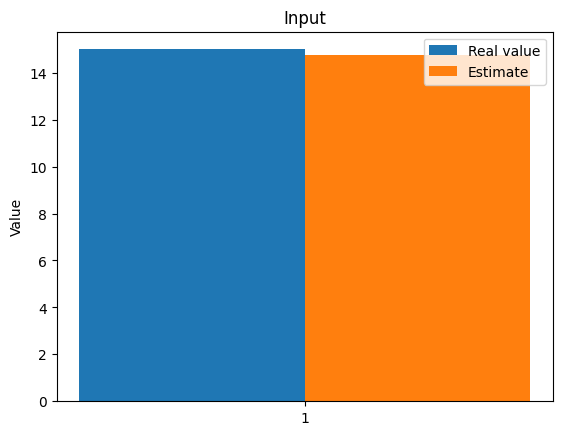

Sample 3000 / 3000

Average acceptance rate: 0.287 MCMC scale: 0.5578642808297212 

Mean values = [14.8650416]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.275 MCMC scale: 0.5949934253988892 

Mean values = [14.87005089]
(2, 1, 1000)


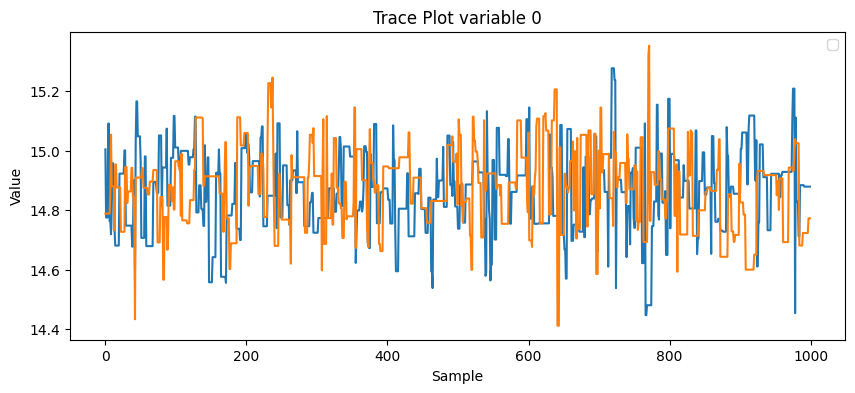

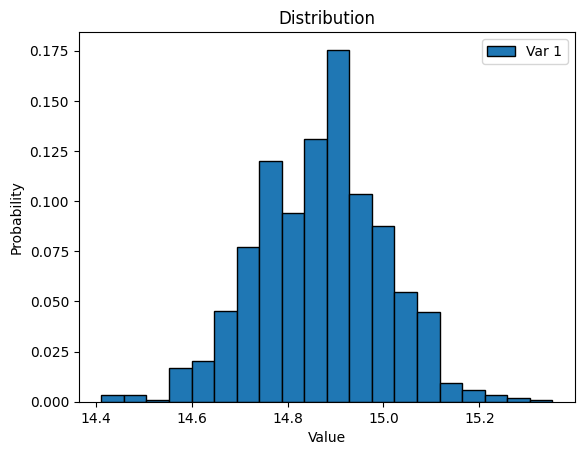

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 324.77619974295993


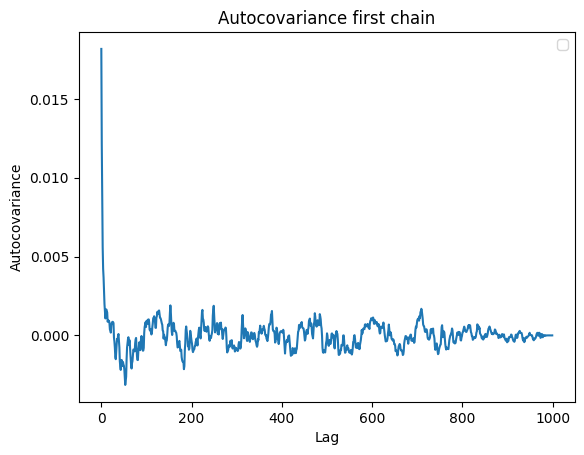

the difference between estimated values [0.12994911]



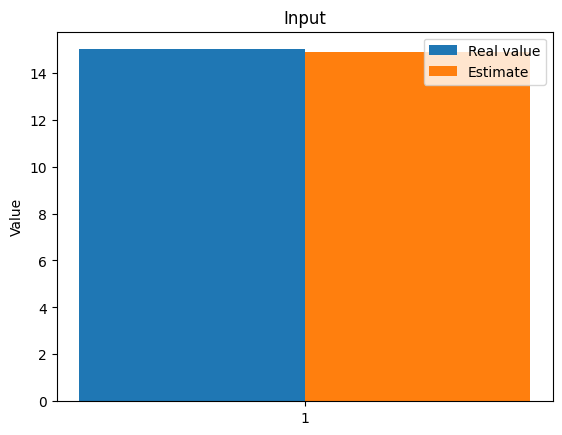

Sample 3000 / 3000

Average acceptance rate: 0.287 MCMC scale: 0.6360076776492017 

Mean values = [14.849556]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.308 MCMC scale: 0.6422882836555098 

Mean values = [14.84425001]
(2, 1, 1000)


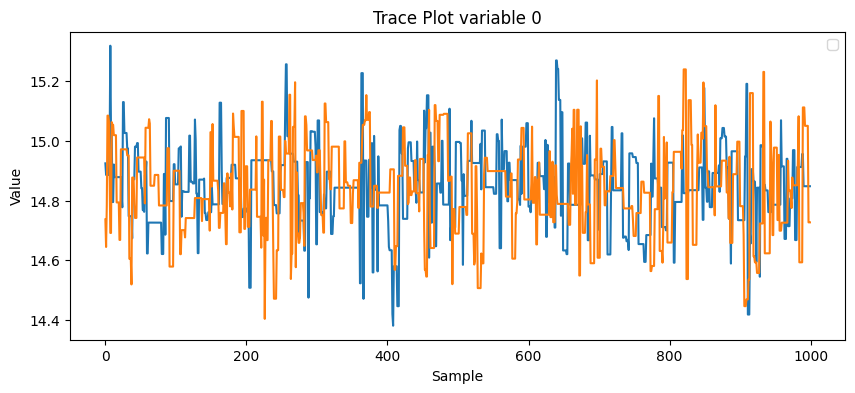

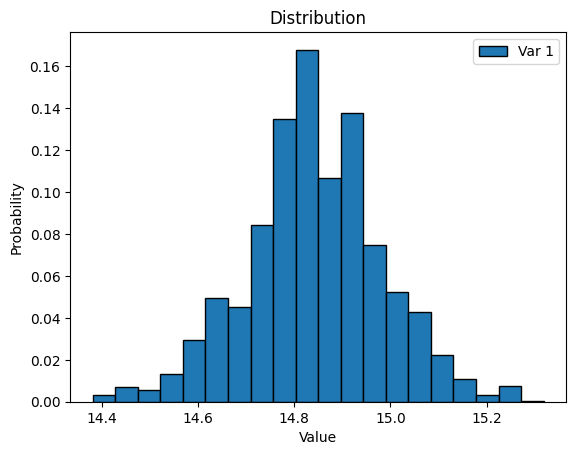

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 418.0888171575336


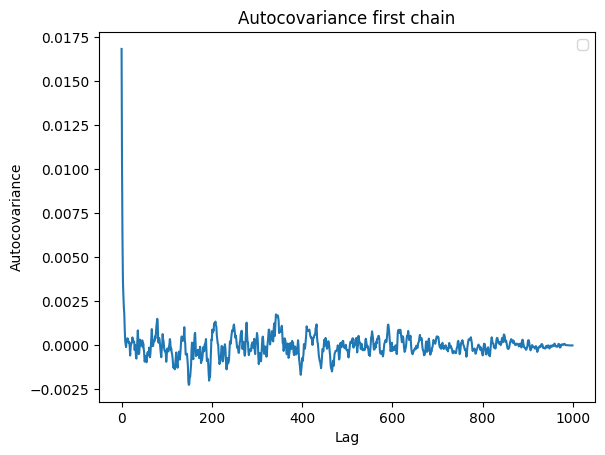

the difference between estimated values [0.15574999]



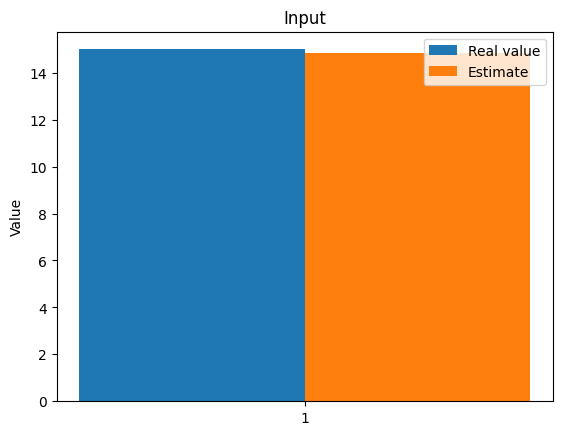

Sample 3000 / 3000

Average acceptance rate: 0.282 MCMC scale: 0.46465087216482126 

Mean values = [14.92725625]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.3 MCMC scale: 0.46064245220908323 

Mean values = [14.9289876]
(2, 1, 1000)


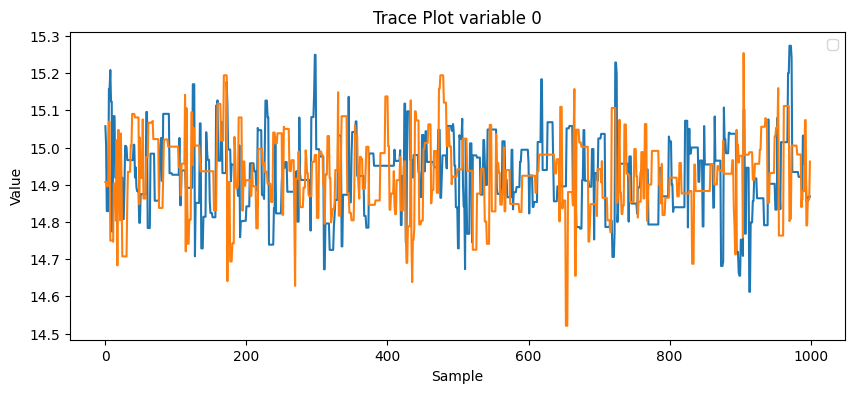

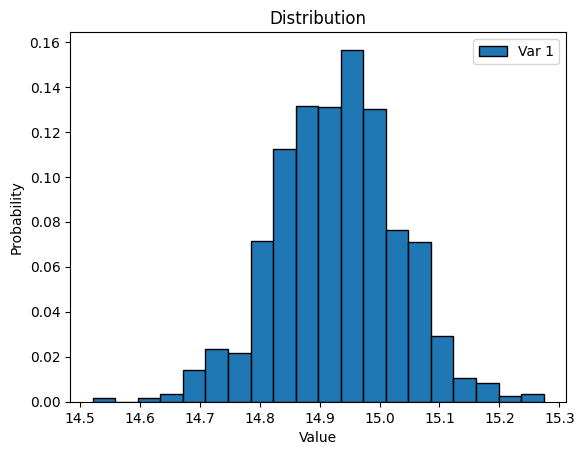

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 389.79802613337


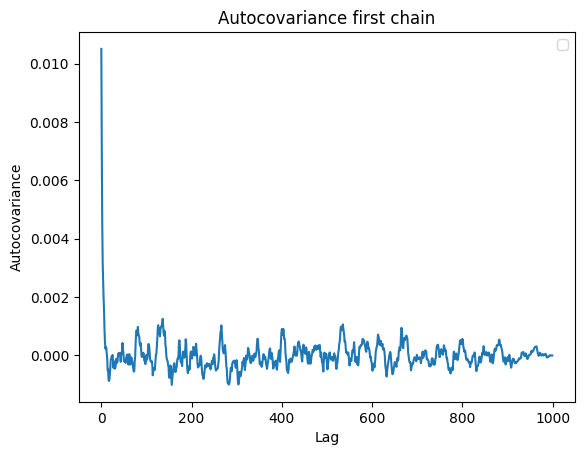

the difference between estimated values [0.0710124]



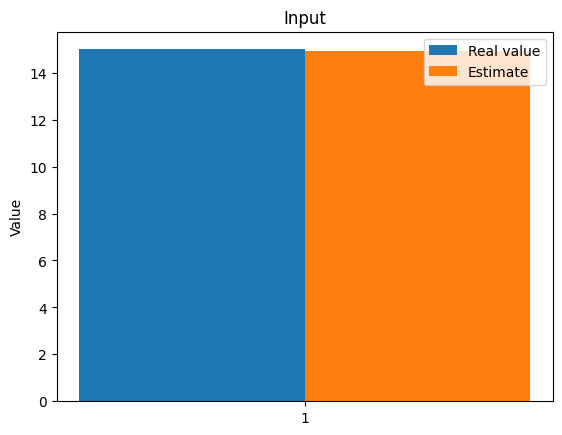

Sample 3000 / 3000

Average acceptance rate: 0.289 MCMC scale: 0.7922775411978211 

Mean values = [14.76791656]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.337 MCMC scale: 0.7632909606658906 

Mean values = [14.75423846]
(2, 1, 1000)


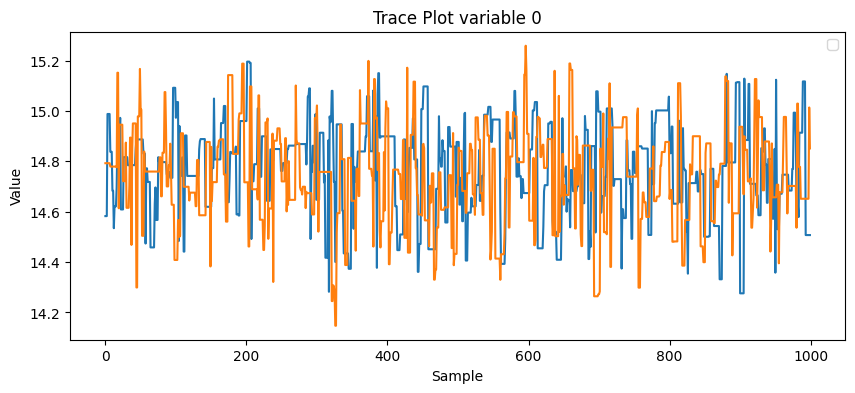

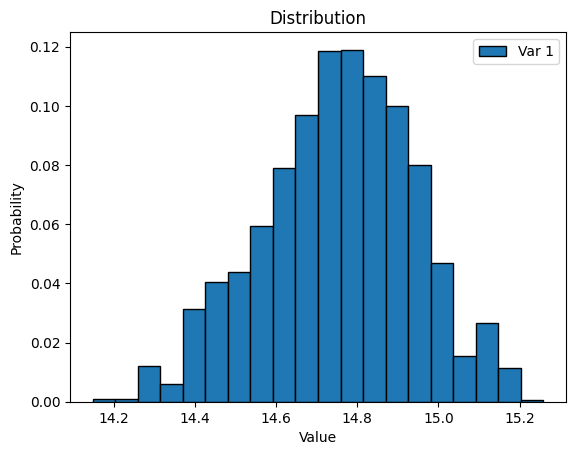

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 416.23731843630577


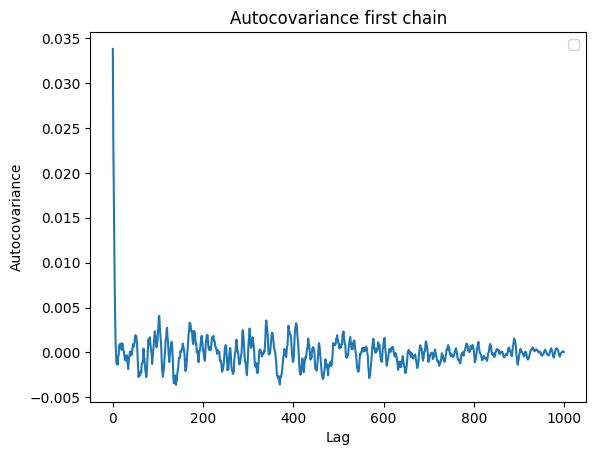

the difference between estimated values [0.24576154]



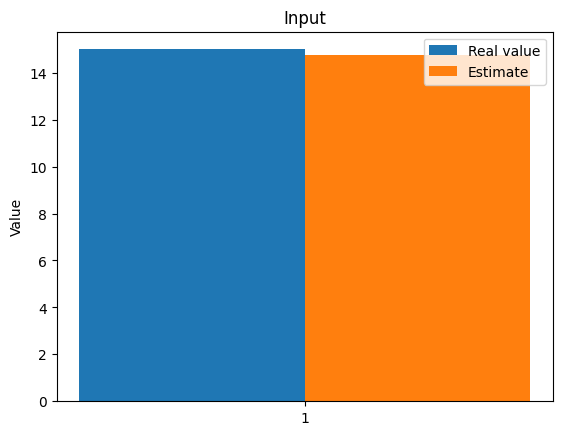

Sample 3000 / 3000

Average acceptance rate: 0.3 MCMC scale: 0.598474439023052 

Mean values = [14.88859857]
Sample 2970 / 3000

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Sample 3000 / 3000

Average acceptance rate: 0.298 MCMC scale: 0.6395843175826605 

Mean values = [14.88477948]
(2, 1, 1000)


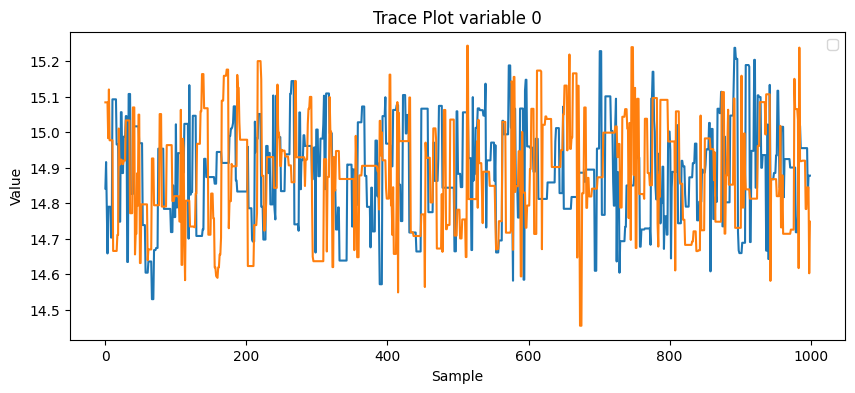

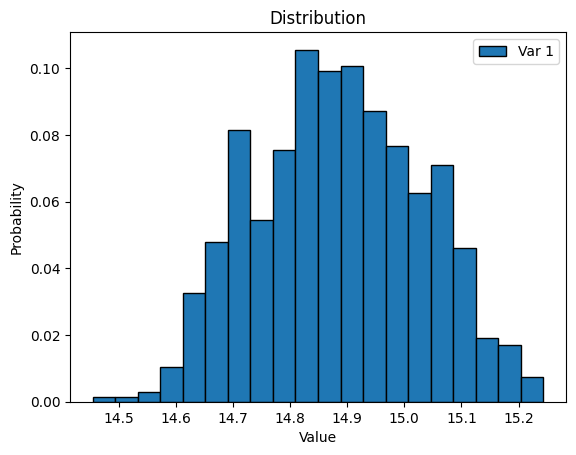

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


ESS values = 365.95467832527345


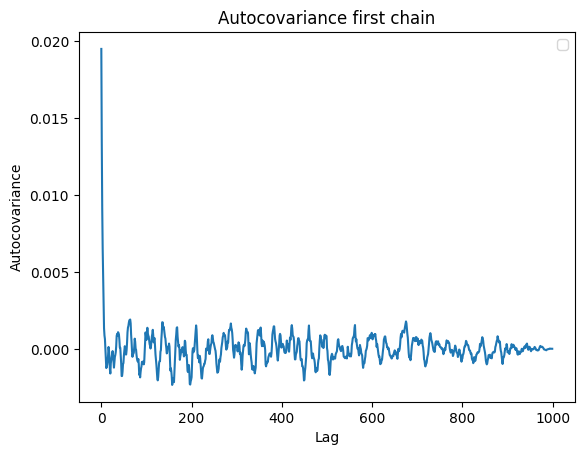

the difference between estimated values [0.11522052]



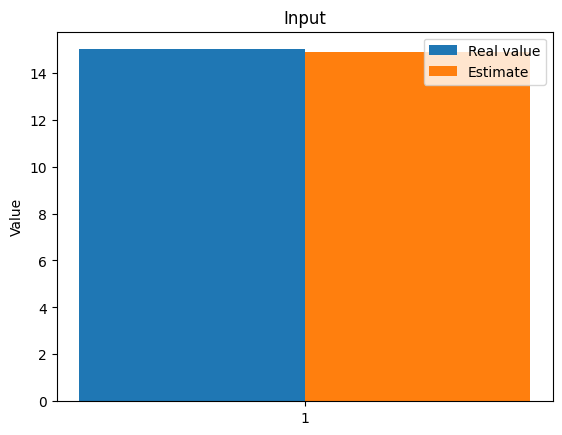

In [ ]:
# Define inputs
mean_prior = np.array([7.])
cov_prior = np.diag([1.])
Yhf = data["Yhf"]
sd_noise = [0.1,0.05]
N = 3000
burn_in = 2000
number_chains = 2
algo = "MH"
x_real = np.array([15.])
proposal_sd = [4.,2.]
adapt = True
n_data = [50,30]

x_data=  np.linspace(0., 5., n_data[0]).reshape(-1, 1)  # Generate evaluation times
nearest_x, y_obs = process_data(data["xhf"], x_real, x_data, Yhf) 

# estimates = final_model.inverse_cuqi(
#     mean_prior=mean_prior,
#     x_real=x_real,
#     y_obs=y_obs,
#     N=N,
#     burn_in=burn_in,
#     cov_prior=cov_prior,
#     sd_noise=sd_noise,  
#     adapt=adapt,
#     scale=proposal_sd,
#     proposal_sd=proposal_sd,
#     number_chains=number_chains,
#     algo=algo,
#     x_data=x_data
# )
estimates=run_simulation_cuqi(data,
    mean_prior,
    x_real,
    N,
    burn_in,
    cov_prior,
    sd_noise,  
    adapt,
    
    proposal_sd,
    number_chains,
    algo,
    x_data,
    n_data,
    final_model
) 


In [ ]:
    @compute_time
    def inverse_cuqi(self, mean_prior: np.ndarray, x_data: np.ndarray, cov_prior: Optional[np.ndarray] = None,
                      cov_noise: float = 0.1, cov_likelihood: Optional[np.ndarray] = None, y_obs: Optional[np.ndarray] = None, 
                      x_real: Optional[np.ndarray] = None, number_chains: int = 1, N: int = 1000, burn_in: int = 500, 
                      levels: int = 1, diagnostic: bool = True, rwmh_cov: Optional[np.ndarray] = None, rwmh_scaling: float = 0.1, 
                      rwmh_adaptive: bool = True, algo: str = "MH", transformation: List[Any] = []) -> Tuple[np.ndarray, np.ndarray]:

        self.transformations = transformation
        self.inputs = x_data

        if x_real is not None:
            dim = x_real.shape[0]
        elif y_obs is not None:
            dim = y_obs.shape[0]
        else:
            warnings.warn("No observation nor data given", UserWarning)
            return np.array([]), np.array([])

        if N <= burn_in:
            warnings.warn("Number of steps insufficient, smaller or equal to burn-in", UserWarning)

        if cov_prior is None:
            cov_prior = np.diag(mean_prior * 0.2)

        if cov_likelihood is None:
            cov_likelihood = cov_noise**2 * np.eye(dim)

        my_prior = multivariate_normal(mean=mean_prior, cov=cov_prior)

        if y_obs is None:
            y_obs = self.wrapper_prediction(x_real) + np.random.normal(loc=0., scale=cov_noise, size=x_real.shape)
        else:
            y_obs += np.random.normal(loc=0., scale=cov_noise, size=y_obs.shape)
            y_obs = y_obs.flatten()

        if levels > 1:
            if levels > len(self.model_list):
                warnings.warn("Number of levels is exceeding the number of models", UserWarning)
            else:
                my_loglike = [Gaussian(mean=y_obs, cov=cov_likelihood) for _ in range(levels)]
                my_posterior = [JointDistribution(my_prior, my_loglike[i])(self.model_list[i].wrapper_prediction) for i in range(levels)]
        else:
            my_loglike = Gaussian(mean=y_obs, cov=cov_likelihood)
            my_posterior = JointDistribution(my_prior, my_loglike)(self.wrapper_prediction)

        if rwmh_cov is None:
            rwmh_cov = np.eye(dim)

        estimates = self.MCMC_cuqi(my_posterior, N, burn_in, number_chains, diagnostic, rwmh_cov, rwmh_scaling, rwmh_adaptive, algo, dim)

        if diagnostic:
            self.plot_hist(estimates, x_real, self.wrapper_prediction(estimates), self.wrapper_prediction(x_real))
        
        error = np.abs(estimates - x_real) / np.abs(x_real + 1e-10)
        return estimates, error

    def MCMC_cuqi(self, posterior, N, burn_in, n=1, diagnostic=True, rwmh_cov=None, rwmh_scaling=0.1, rwmh_adaptive=True, algo="MH", dim=1):
        
        x_init = np.random.rand(dim, n)
        estimates = np.empty((dim, 0))
        chains = np.empty((0, dim, N - burn_in))
        post = np.empty((dim, 0))

        for i in range(n):
            if algo == "NUTS":
                sampler = NUTS(posterior, x0=x_init[:, i])
            elif algo == "MH":
                if rwmh_adaptive:
                    sampler = MH(posterior, x0=x_init[:, i], scale=rwmh_scaling)
                else:
                    sampler = MH(posterior, x0=x_init[:, i], scale=rwmh_scaling)
            elif algo == "pCN":
                sampler = pCN(posterior, x0=x_init[:, i])
            else:
                raise ValueError("Unknown algorithm %s" % algo)
            
            if rwmh_adaptive:
                samples = sampler.sample_adapt(N - burn_in, burn_in)
            else:
                samples = sampler.sample(N - burn_in, burn_in)

            estimates = np.column_stack((estimates, samples.mean()[:, np.newaxis]))
            chains = np.concatenate((chains, np.expand_dims(samples.samples, axis=0)), axis=0)
            post = np.concatenate((post, samples.samples), axis=1)

            print(f"Mean values = {estimates.mean(axis=1)}")

        print(chains.shape)
        for l in range(chains.shape[1]):
            plt.figure(figsize=(10, 4))
            for i in range(chains.shape[0]):
                plt.plot(chains[i, l, :])
            plt.xlabel('Sample')
            plt.ylabel('Value')
            plt.title(f'Trace Plot variable {l}')
            plt.legend()
            plt.show()
        
        if diagnostic:
            if n == 1:
                samples.plot_trace()
                samples.plot_autocorrelation()
            else:
                num_bins = 20
                plt.figure()
                for num in range(post.shape[0]):        
                    bin_edges = np.linspace(np.min(post[num, :]), np.max(post[num, :]), num_bins + 1)
                    hist, _ = np.histogram(post[num, :], bins=bin_edges)
                    hist = hist / post.shape[1]
                    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
                    plt.bar(bin_centers, hist, width=np.diff(bin_edges), edgecolor='black', label=f'Var {num + 1}')
                    plt.xlabel('Value')
                    plt.ylabel('Probability')
                    plt.title('Distribution')
                    plt.legend()
                    plt.show()
                
                autocov = arviz.autocov(chains[:, 0, :])
                ess = arviz.ess(chains[:, 0, :])
                print(f"ESS values = {ess}")
                plt.figure()
                plt.plot(autocov[0, :])
                plt.title('Autocovariance first chain')
                plt.xlabel('Lag')
                plt.ylabel('Autocovariance')
                plt.legend()
                plt.show()
        
        return estimates